In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import json
import data
import tqdm
import skimage.measure


/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
desc = json.load(open('data/MosVesna_2021_x_cont1_course.json'))
img = np.zeros((8000, 8000), dtype=int)
for shape in desc['shapes']:
    lb, rt = data.get_bounding_box(shape)
    lb[0] = max(lb[0], 0)
    lb[1] = max(lb[1], 0)
    rt[0] = min(rt[0], img.shape[1] - 1)
    rt[1] = min(rt[1], img.shape[0] - 1)
    for i in range(int(lb[0] - 1), int(rt[0] + 1)):
        for j in range(int(lb[1] - 1), int(rt[1] + 1)):
            if data.detect(i, j, shape):
                img[j][i] = 1
                
while img.shape[0] > 1000:
    img = skimage.measure.block_reduce(img, (2,2), np.max)

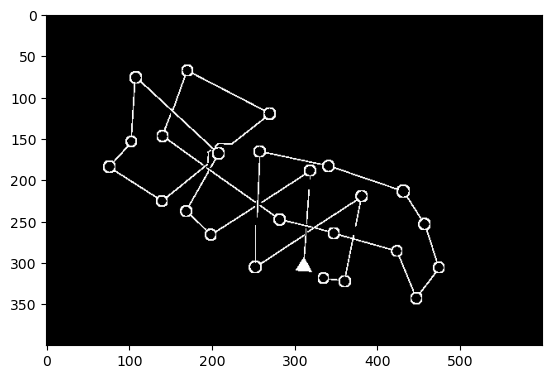

In [4]:
plt.imshow(img[:400,:600], cmap='gray')

In [4]:
def circle_mask(c, shape):
    mask = np.zeros((shape[0],shape[1],1), np.uint8)
    cv2.circle(mask,(c[1],c[0]),c[2],1,10)
    return mask

def check(c, img, visualize=False):
    mask = circle_mask(c, img.shape)    
    res = cv2.bitwise_xor(img, mask)
    a = int(np.sqrt(2)/2 * c[2]) - 1
    res_square = res[c[0]-a:c[0] + a, c[1] - a:c[1]+a]
    if visualize:
        plt.imshow(img[c[0] - c[2]: c[0] + c[2], c[1] - c[2]:c[1] + c[2]])
        plt.show()
    return res_square.sum() < 0.02 * 255 * (4 * a * a)

def check_circle_cv_kernel(c, img, visualize=False, print_score=False):
    kernel = np.float32(cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(2 * c[2] + 1, 2 * c[2] + 1)))
    kernel[3:-3, 3:-3] -= cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(2 * c[2] - 5, 2 * c[2] - 5))
    kernel[6:-6, 6:-6] -= cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(2 * c[2] - 11, 2 * c[2] - 11))
    res_square = img[c[0]-c[2]:c[0] + c[2] + 1, c[1] - c[2]:c[1]+c[2] + 1] / 255
    if visualize:
        ax1 = plt.subplot(1, 2, 1)
        ax2 = plt.subplot(1, 2, 2)
        ax1.imshow(res_square)
        ax2.imshow((kernel + 1) / 2)
        plt.show()

    score = np.multiply(kernel, res_square).sum()
    threshold = 0.3 * np.absolute(kernel).sum()
    if print_score:
        print(score, threshold)
    return score > threshold

def hough_circle_fixed_radius(img, r, visualize=False):
    img8 = np.uint8(img * 255)
    res = np.zeros_like(img)
    n, m = img.shape
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10,10))
    course = cv2.dilate(img8, kernel)
    plt.imshow(course)
    plt.show()
    
    for i in tqdm.tqdm(range(0, n)):
        for j in range(0, m):
            if course[i,j] == 255:
                res += circle_mask((i,j,r), course.shape).reshape((n, m))
    threshold = 0.8 * res.max()
    res[res < threshold] = 0
#     print(res.max())
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (8,8))
    course = cv2.erode(course, kernel)
    circles = []
    for i in tqdm.tqdm(range(0, n)):
        for j in range(0, m):
            if res[i,j] >= threshold and check_circle_cv_kernel((i, j, r+3), course,visualize=False, print_score=False):
                circles.append(np.array([i, j]))
    circles_filtered = []
    for circle in circles:
        duplicate = False
        for filtered_circle in circles_filtered:
            if np.linalg.norm(circle - filtered_circle) < r * 2:
                duplicate = True
                break
        if not duplicate:
            circles_filtered.append(circle)
    if visualize:
        n_res = np.zeros(res.shape)
        for circle in circles_filtered:
            n_res += circle_mask((circle[0],circle[1],r), course.shape).reshape((n, m))
        plt.imshow(n_res, cmap='gray')
        plt.show()
    return circles_filtered


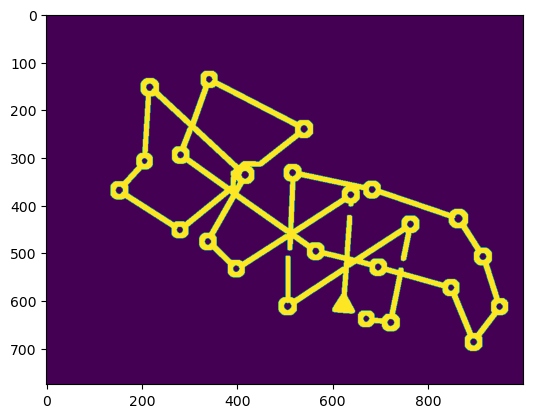

100%|███████████████████████████████████████| 775/775 [00:00<00:00, 3881.40it/s]


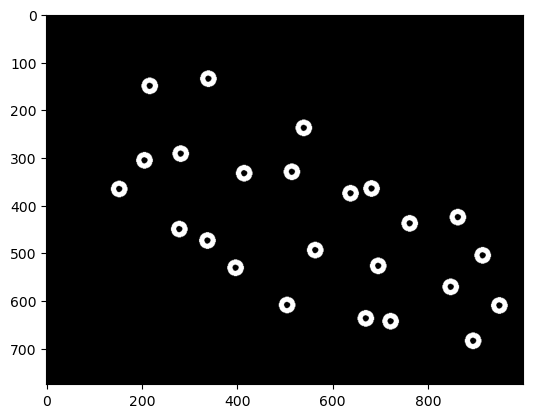

[array([135, 340]), array([150, 217]), array([238, 540]), array([292, 282]), array([306, 206]), array([330, 515]), array([333, 415]), array([365, 682]), array([366, 153]), array([375, 638]), array([425, 863]), array([438, 762]), array([450, 279]), array([474, 338]), array([494, 564]), array([505, 915]), array([527, 696]), array([531, 397]), array([571, 848]), array([609, 505]), array([610, 950]), array([637, 670]), array([643, 722]), array([684, 895])]


In [5]:
circles = hough_circle_fixed_radius(img, 12, visualize=True)

print(circles)

In [6]:
class Node:
    def __init__(self, l, t, r, b, p):
        self.l = l
        self.t = t
        self.r = r
        self.b = b
        self.x = (l + r) / 2
        self.y = (b + t) / 2
        self.val = -1.
        self.parent = p
        self.children = []
        self.id = hash(self)
        
class Tree:
    def __init__(self,root):
        self.root = root
        self.nodes = {}

def build_quadtree(img):
    root = Node(0, 0, img.shape[0], img.shape[1], None)
    tree = Tree(root)
    q = [root]
    while len(q) > 0:
        node = q[0]
        q = q[1:]
        tree.nodes[node.id] = node
        total = 0
        s = 0
        for i in range(node.l, node.r):
            for j in range(node.t, node.b):
                total += 1
                if img[i][j]:
                    s += 1
        if s == 0:
            node.val = 0
            continue
        if s > total * 0.3:
            node.val = 1
            continue
        xmid = (node.l + node.r) // 2
        ymid = (node.t + node.b) // 2
        node.children = [
            Node(node.l, node.t, xmid, ymid, node),
            Node(xmid, node.t, node.r, ymid, node),
            Node(node.l, ymid, xmid, node.b, node),
            Node(xmid, ymid, node.r, node.b, node),
        ]
        for x in node.children:
            q.append(x)
    return tree

def draw_quadtree(node):
    res = np.zeros((node.r, node.b))
    def draw_node(node, res):
        if node.val != -1:
            if node.val == 1:
                cv2.rectangle(res, [node.t, node.l], [node.b, node.r], 1, -1)
            return 1
        s = 0
        for x in node.children:
            s += draw_node(x, res)
        return s
    draw_node(node, res)
    plt.imshow(res)
    plt.show()

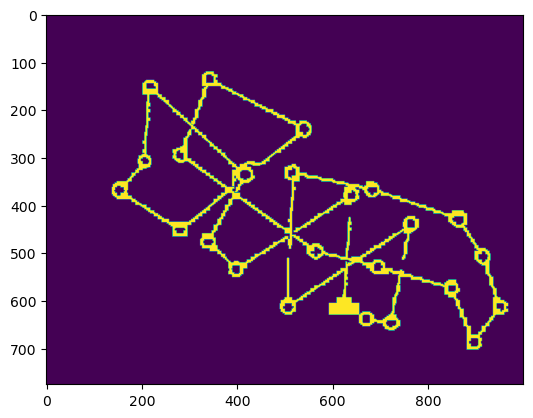

In [7]:
tree = build_quadtree(img)
draw_quadtree(tree.root)

In [8]:
def build_graph_from_quadtree(root, graph):
    if root.val != -1:
        return [root], [root], [root], [root]
    NW_l, NW_t, NW_r, NW_b =  build_graph_from_quadtree(root.children[0], graph)
    NE_l, NE_t, NE_r, NE_b =  build_graph_from_quadtree(root.children[1], graph)
    SW_l, SW_t, SW_r, SW_b =  build_graph_from_quadtree(root.children[2], graph)
    SE_l, SE_t, SE_r, SE_b =  build_graph_from_quadtree(root.children[3], graph)
    
    def make_edge(i, j, graph):
        graph[i] = graph.get(i, []) + [j]
        graph[j] = graph.get(j, []) + [i]
    
    def merge_by_y(L, R, graph):
        ptr_a = 0
        ptr_b = 0
        while ptr_a < len(L) and ptr_b < len(R):
            ymin = max(L[ptr_a].t, R[ptr_b].t)
            ymax = min(L[ptr_a].b, R[ptr_b].b)
            if ymin < ymax:
                make_edge(L[ptr_a].id, R[ptr_b].id, graph)
            if L[ptr_a].b < R[ptr_b].b:
                ptr_a += 1
            else:
                ptr_b += 1

    def merge_by_x(T, B, graph):
        ptr_a = 0
        ptr_b = 0
        while ptr_a < len(T) and ptr_b < len(B):
            xmin = max(T[ptr_a].l, B[ptr_b].l)
            xmax = min(T[ptr_a].r, B[ptr_b].r)
            if xmin < xmax:
                make_edge(T[ptr_a].id, B[ptr_b].id, graph)
            if T[ptr_a].r < B[ptr_b].r:
                ptr_a += 1
            else:
                ptr_b += 1

    merge_by_y(NW_r, NE_l, graph)
    merge_by_y(SW_r, SE_l, graph)
    merge_by_x(NW_b, SW_t, graph)
    merge_by_x(NE_b, SE_t, graph)    
    return NW_l + SW_l, NW_t + NE_t, NE_r + SE_r, SW_b + SE_b


def draw_quadtree_graph(tree, graph):
    draw_quadtree(tree.root)
    res = np.zeros((tree.root.r, tree.root.b))
    cnt = 0
    for v in graph:
        a = tree.nodes[v]
        cv2.rectangle(res, [a.t, a.l], [a.b, a.r], 255, 2)
        for u in graph[v]:    
            b = tree.nodes[u]
            cv2.line(res, (int(a.y), int(a.x)), (int(b.y), int(b.x)), 255, 3)
            cnt += 1
    print(f"total {cnt} edges and {len(graph)} vertices")
    plt.imshow(res)
    plt.show()
            


In [9]:
graph = {}
build_graph_from_quadtree(tree.root, graph)

([<__main__.Node at 0x7f1283ff32e0>,
  <__main__.Node at 0x7f1283ff01f0>])

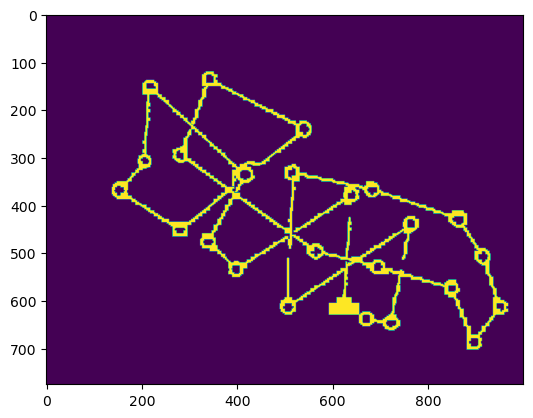

total 31748 edges and 6553 vertices


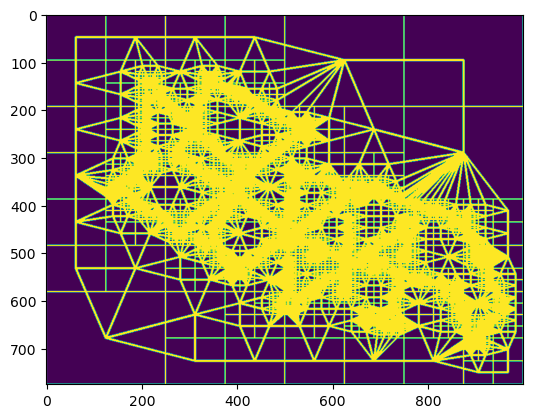

In [10]:
draw_quadtree_graph(tree, graph)

In [11]:
def find_node(root, x, y):
    if root.val != -1:
        return root
    xmid = root.x
    ymid = root.y
    if x < xmid and y < ymid:
        return find_node(root.children[0], x, y)
    if x >= xmid and y < ymid:
        return find_node(root.children[1], x, y)
    if x < xmid and y >= ymid:
        return find_node(root.children[2], x, y)
    if x >= xmid and y >= ymid:
        return find_node(root.children[3], x, y)

In [12]:
find_node(tree.root, circles[0][0], circles[0][1]).__dict__

{'l': 132,
 't': 335,
 'r': 138,
 'b': 343,
 'x': 135.0,
 'y': 339.0,
 'val': 0,
 'parent': <__main__.Node at 0x7f1283615900>,
 'children': [],
 'id': 8732343169280}

In [13]:
import heapq

def get_angle_impl(x, y, nx, ny, px, py):
    
    v1 = [nx - x, ny - y]
    v2 = [x - px, y - py]
    u1 = v1 / np.linalg.norm(v1)
    u2 = v2 / np.linalg.norm(v2)
    dot_product = np.dot(u1, u2)
    return np.arccos(dot_product)


def get_angle(x, y, nx, ny, prex, prey):
    if prex[x,y] == -1:
        return 0
    px = prex[x, y]
    py = prey[x, y]
    return get_angle_impl(x, y, nx, ny, px, py)

def penalty(c1, c2, course):
    dist = np.float64(np.full_like(course, 10.0 ** 10))
    prex = np.full_like(course, -1)
    prey = np.full_like(course, -1)
    
    approx_metric = abs(c2[0] - c1[0]) + abs(c2[1] - c1[1])
    coefficient = 2
    if approx_metric > 600:
        coefficient = 1.6
    if approx_metric > 1000:
        coefficient = 1.3
    
    q = []
    for i in range(-12, 13):
        for j in range(-12, 13): 
            x = c1[0] + i
            y = c1[1] + j
            dist[x, y] = 0
            heapq.heappush(q, (0, (x, y)))
    while len(q) > 0:
        d, v = heapq.heappop(q)
        x, y = v[0], v[1]
        if x == c2[0] and y == c2[1]:
            break
        already_done_metric = abs(c1[0] - x) + abs(c1[1] - y)
        approx_leftover_metric = abs(c2[0] - x) + abs(c2[1] - y)
        
        if already_done_metric != 0:
            approx_dist = approx_metric / already_done_metric * d
            if approx_dist > approx_metric * 2:
                continue
        local_area_size = 3
        if approx_leftover_metric < 20:
            local_area_size = 2
        if approx_leftover_metric < 5:
            local_area_size = 1
        for dx in [-local_area_size, 0, local_area_size]:
            dy_set = [-local_area_size, 0, local_area_size]
            for dy in dy_set:
                if dx == 0 and dy == 0:
                    continue
                nx = x + dx
                ny = y + dy
                if nx < 0 or ny < 0 or nx >= course.shape[0] or ny >= course.shape[1]:
                    continue
                n_cost = dist[x, y] + 1 + local_area_size ** 2 * (1 - course[nx, ny]) + get_angle(x, y, nx, ny, prex, prey)
                if dist[nx,ny] > n_cost:
#                     if dist[nx,ny] == 10.0 ** 10:
                    heapq.heappush(q, (n_cost, (nx, ny)))
                    dist[nx, ny] = n_cost
                    prex[nx, ny] = x
                    prey[nx, ny] = y
    return dist[c2[0], c2[1]], prex, prey

In [14]:
def draw_path(course, x, y, prex, prey, addx, addy):
    res = np.uint8(course * 255)
    while prex[x,y] != -1:
        nx = prex[x,y]
        ny = prey[x,y]
        cv2.line(res, (y + addy, x + addx), (ny + addy, nx + addx), 255, 10)
        x = nx
        y = ny
    plt.imshow(res)
    plt.show()

In [15]:
penalties_cache = {}
def calculate_penalty(c1_idx, c2_idx, circles, img, visualize=False):
    key = str(c1_idx) + ';' + str(c2_idx) + ';' + str(hash(len(circles)))
    if key in penalties_cache:
        return penalties_cache[key]
    minx = min(circles[c1_idx][0], circles[c2_idx][0]) - 50
    maxx = max(circles[c1_idx][0], circles[c2_idx][0]) + 50
    miny = min(circles[c1_idx][1], circles[c2_idx][1]) - 50
    maxy = max(circles[c1_idx][1], circles[c2_idx][1]) + 50
    dist, prex, prey = penalty([circles[c1_idx][0] - minx, circles[c1_idx][1] - miny], [circles[c2_idx][0] - minx, circles[c2_idx][1] - miny], img[minx:maxx+1, miny:maxy+1])
    if visualize:
        draw_path(img, circles[c2_idx][0] - minx, circles[c2_idx][1] - miny, prex, prey, minx, miny)
    penalties_cache[key] = dist
    return dist

In [16]:
# calculate_penalty(12, 2, circles, img, visualize=True)

In [17]:
# calculate_penalty(19, 9, circles, img, visualize=True)

In [18]:
# calculate_penalty(6, 5, circles, img, visualize=True)

In [19]:
# calculate_penalty(4, 1, circles, img, visualize=True)

In [20]:
# calculate_penalty(4, 17, circles, img, visualize=True)

In [21]:
def calculate_dist_matrix(img, circles):
    res = []
    n = len(circles)
    for i in tqdm.tqdm(range(n)):
        res.append([])
        for j in range(n):
            if i == j:
                res[-1].append(0)
                continue
            if i < j:
                res[-1].append(calculate_penalty(i, j, circles, img))
            else:
                res[-1].append(res[j][i])
    return res

In [22]:
def quadtree_penalty(c1_idx, c2_idx, circles, img, tree, graph, visualize=False):
    n1 = find_node(tree.root, *circles[c1_idx]).id
    n2 = find_node(tree.root, *circles[c2_idx]).id
    c1 = circles[c1_idx]
    c2 = circles[c2_idx]
    q = []
    dist = {}
    pre = {}
    dist[n1] = 0
    approx_metric = np.sqrt((c2[0] - c1[0]) ** 2 + (c2[1] - c1[1]) ** 2) * 0.9
    heapq.heappush(q, (0, n1))
    while len(q) > 0:
        d, v = heapq.heappop(q)
        if v == n2:
            break
        for u in graph[v]:
            curd = dist.get(u, 10**9)
            can = d
            area2 = ((tree.nodes[u].b - tree.nodes[u].t) + (tree.nodes[u].r - tree.nodes[u].l)) / 2
            if tree.nodes[u].val == 0:
                can += area2
            elif tree.nodes[u].val == 1:
                can += 0.1 * area2
#             if u != n2:
#                 can += get_angle_impl(tree.nodes[u].x, tree.nodes[u].y, tree.nodes[n2].x, tree.nodes[n2].y, tree.nodes[v].x, tree.nodes[v].y)
            if can < curd:
                dist[u] = can
                pre[u] = v
                heapq.heappush(q, (can, u))
    if visualize:
        res = np.uint8(img * 255)
        node = n2
        while node in pre:
            a = tree.nodes[node]
            node = pre[node]
            b = tree.nodes[node]
            cv2.line(res, (int(a.y), int(a.x)), (int(b.y), int(b.x)), 255, 10)
        plt.imshow(res)
        plt.show()
    return dist.get(n2, 10 ** 9) / (0.1 * approx_metric) - 1

In [23]:
def lines_penalty(c1_idx, c2_idx, circles, img, tree, graph, visualize=False):
    c1 = circles[c1_idx]
    c2 = circles[c2_idx]
    dx = c2[0] - c1[0]
    dy = c2[1] - c1[1]
    dist = np.sqrt(dx ** 2 + dy ** 2)
    score = 0
    add_per_bad_pixel = 3
    
    for i in range(int(dist)):
        x = int(c1[0] + dx * i / dist)
        y = int(c1[1] + dy * i / dist)
#         n1 = find_node(tree.root, x,y).id
#         print(x, y, img.shape)
        s = 0
        d = 3
        for v in range(-d, d+1):
            for u in range(-d, d+1):
                s += img[x+v, y+u]
        if s == 0:
            score += add_per_bad_pixel
#             print('add')
    return max(0, score - add_per_bad_pixel * 5) / (add_per_bad_pixel * dist)

In [24]:
def quadtree_dist_matrix(img, circles,tree, graph):
    res = []
    n = len(circles)
    for i in tqdm.tqdm(range(n)):
        res.append([])
        for j in range(n):
            if i == j:
                res[-1].append(0)
                continue
            if i < j:
                quadtree_p = quadtree_penalty(i, j, circles, img, tree, graph, visualize=True)
                lines_p = lines_penalty(i, j, circles, img, tree, graph)
                print(quadtree_p, lines_p)
                res[-1].append(min(quadtree_p, lines_p))
            else:
                res[-1].append(res[j][i])
    return res

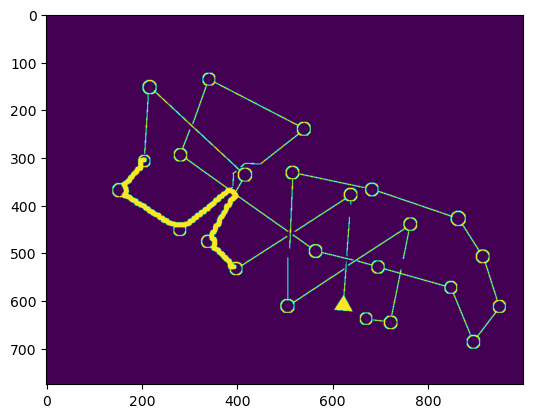

1.5129550779330625

In [25]:
quadtree_penalty(4, 17, circles, img, tree, graph, visualize=True)

In [26]:
lines_penalty(4, 17, circles, img, tree, graph, visualize=True)

0.6200504888922473

In [27]:
penalties_cache = {}

subsample_circles = [circles[9], circles[17], circles[13], circles[1], circles[6], circles[4]]

In [28]:
# dist_matrix_full = calculate_dist_matrix(img, circles)

  0%|                                                    | 0/24 [00:00<?, ?it/s]

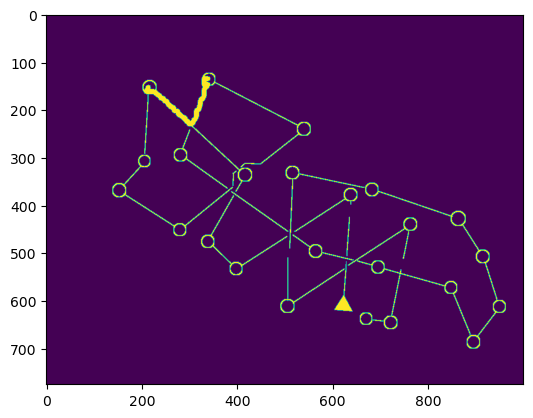

1.9591069520476383 0.7908885853654597


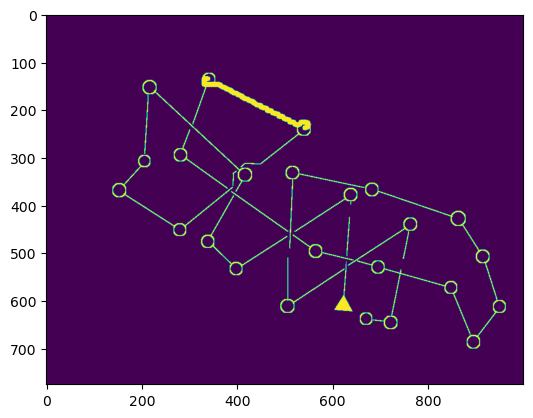

0.790406407568456 0.04445146942928581


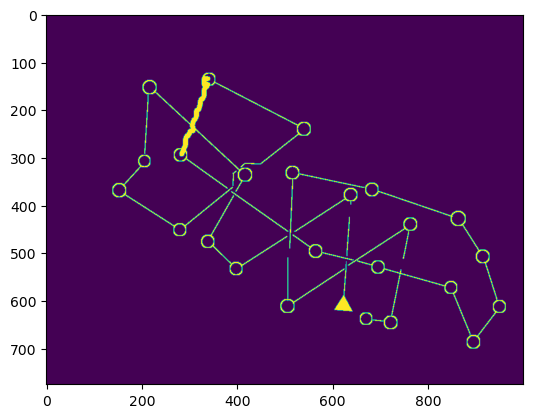

1.2172984159515372 0.04779804968518284


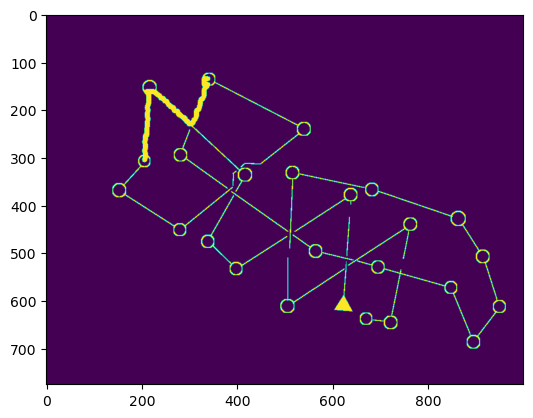

1.6492933731572639 0.810131409861217


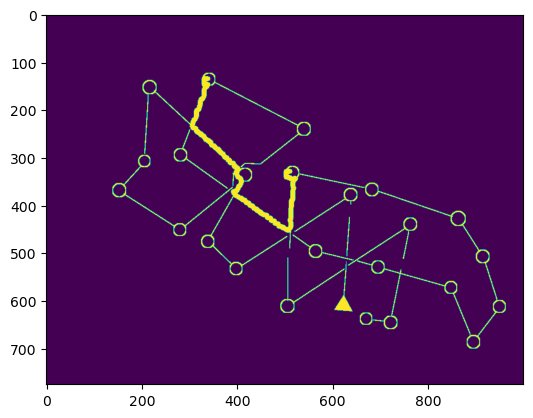

2.0108947089641434 0.8472912152831482


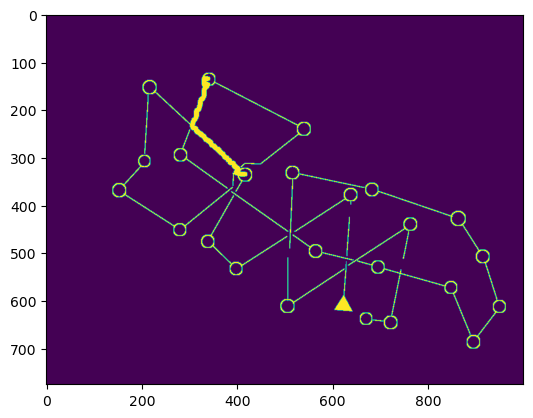

1.183088267343329 0.8501449502635079


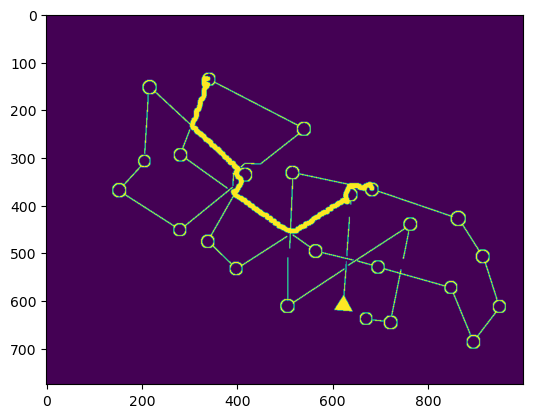

1.1688667240654036 0.8273774985900206


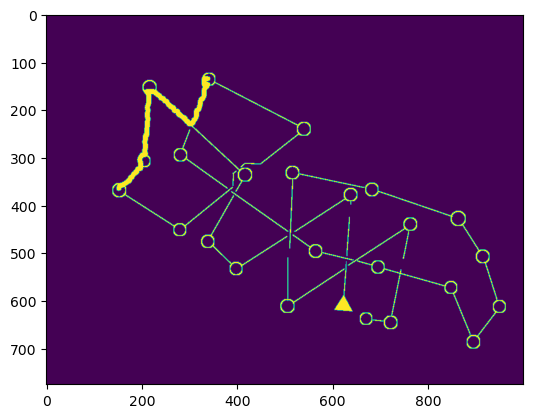

1.2562158704760358 0.6527511035378882


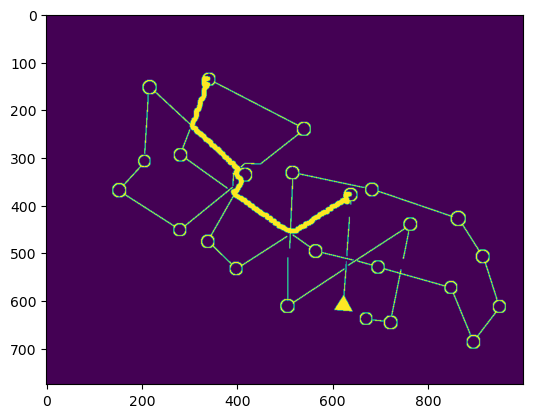

1.1372672630488823 0.8128004170208987


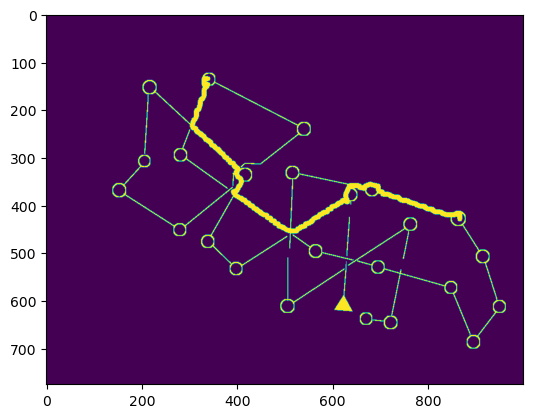

0.9806070978561181 0.607002194061532


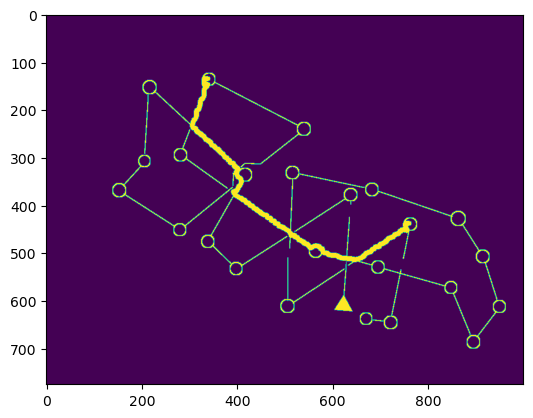

0.8051118898221301 0.7853519975624237


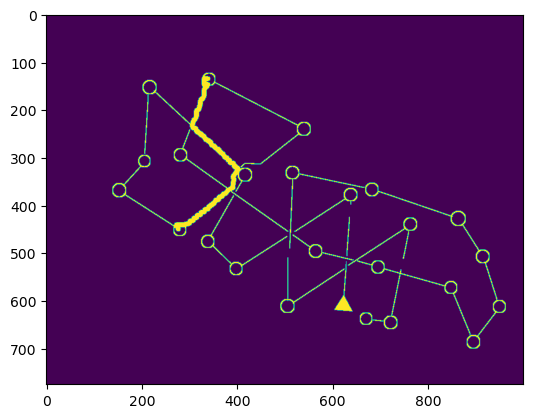

0.9063826443542435 0.7604752564944445


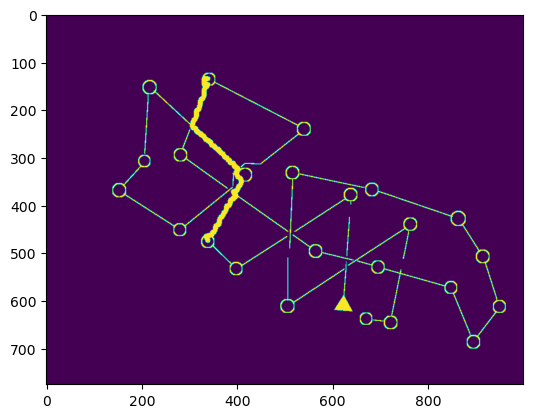

0.7682419245707071 0.7905467140064031


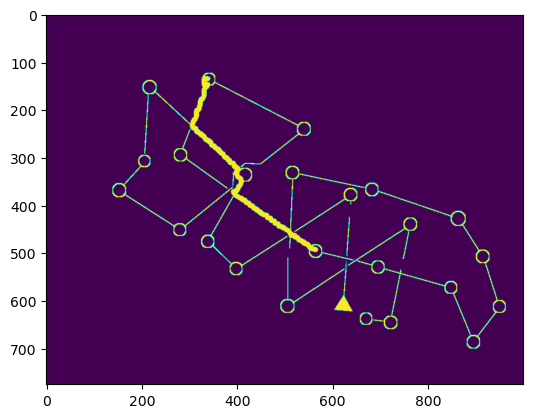

0.6004258172762851 0.843669918114635


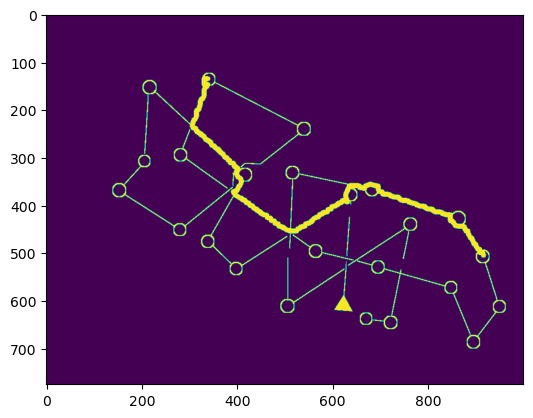

0.8297571868143165 0.7707405272700083


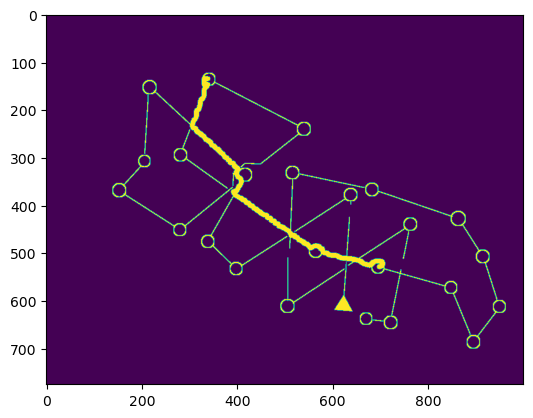

0.681790955673055 0.8139322666320364


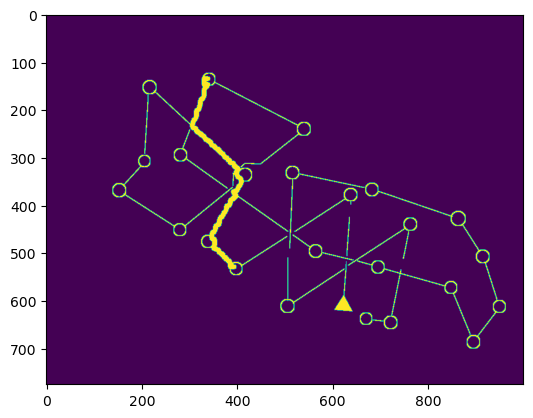

0.7065978269606079 0.7873400877841042


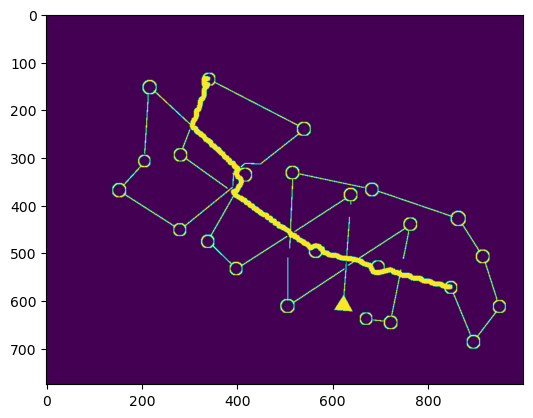

0.48961968256135857 0.8260542796777569


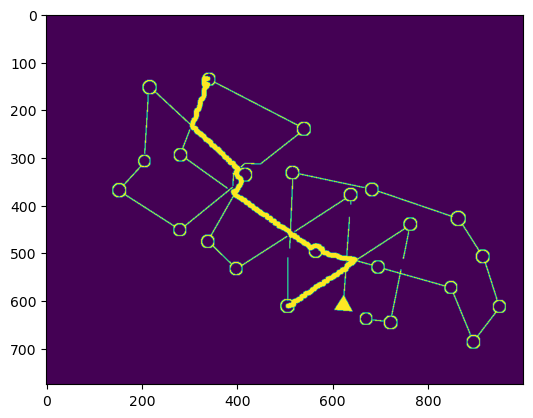

1.0721366563398647 0.8368244189064834


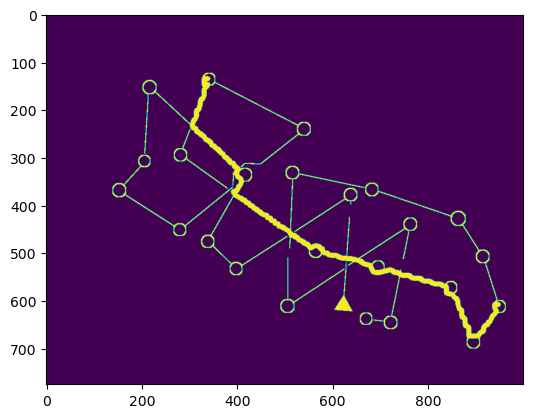

0.6182483420121538 0.8291007713204351


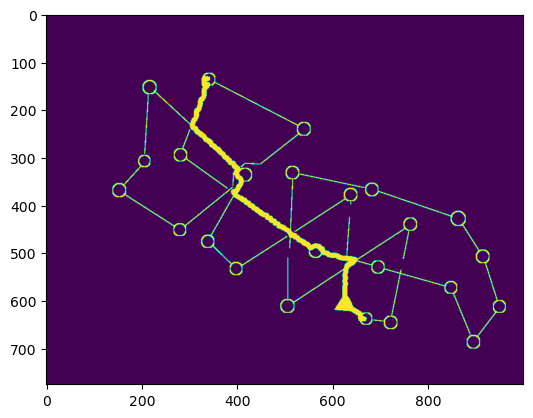

0.6220387911627776 0.7956682872955834


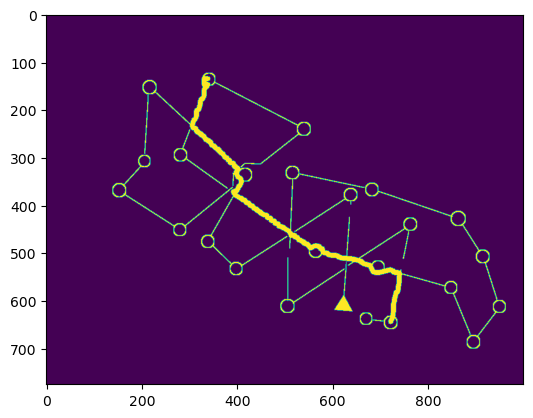

0.5977890986955692 0.8448703188179083


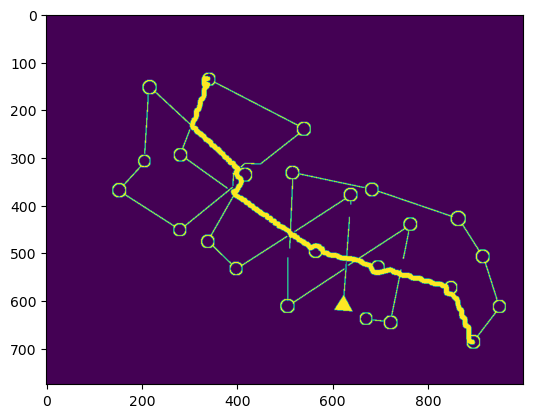

  4%|█▊                                          | 1/24 [00:02<00:59,  2.57s/it]

0.5236445862090642 0.8223837850645455


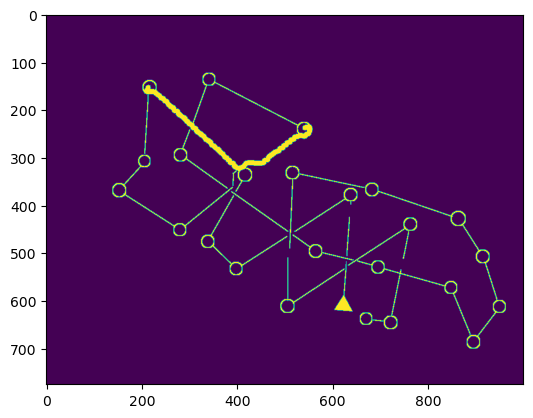

0.7905994257589104 0.8483358910546378


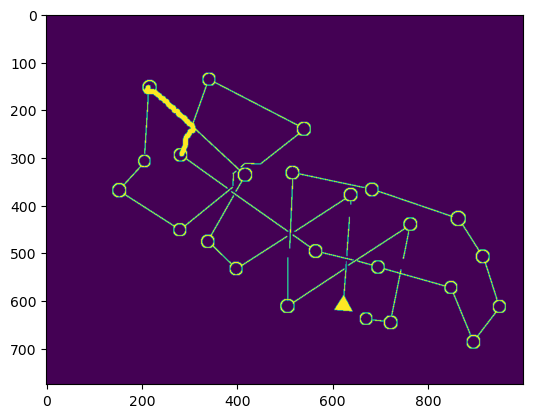

1.2945113625325368 0.8132175154650201


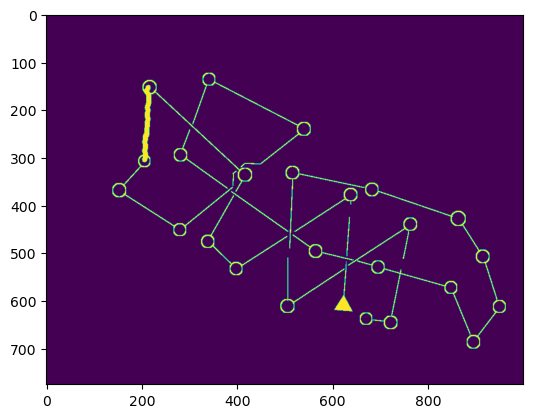

0.932523584811489 0.07673255410280913


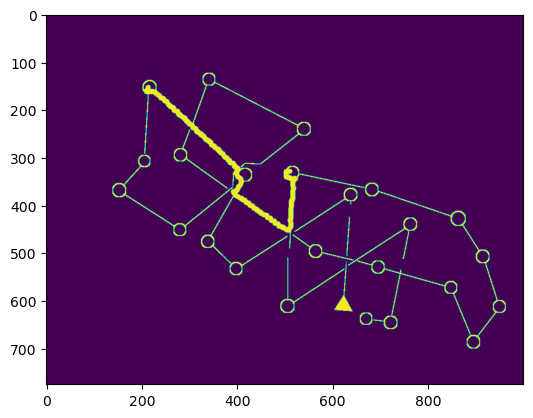

1.2292841314953638 0.8588408873090932


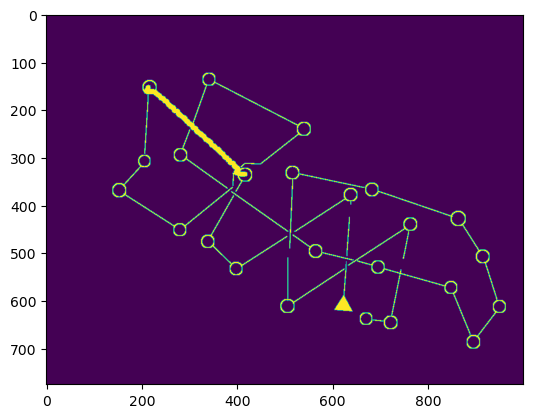

0.6669774323041904 0.03338075946023224


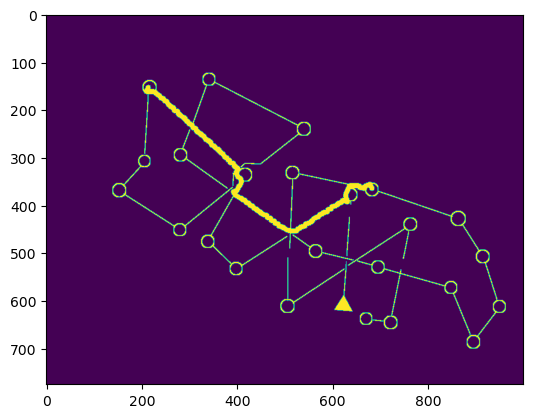

0.7199166046004031 0.9037695449394545


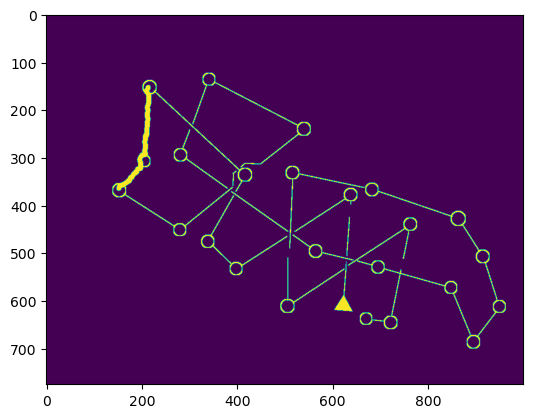

0.7632218379282325 0.8744593898312606


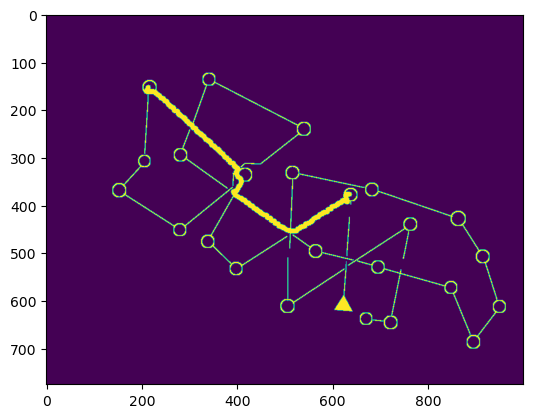

0.6863826135110891 0.8253847822650537


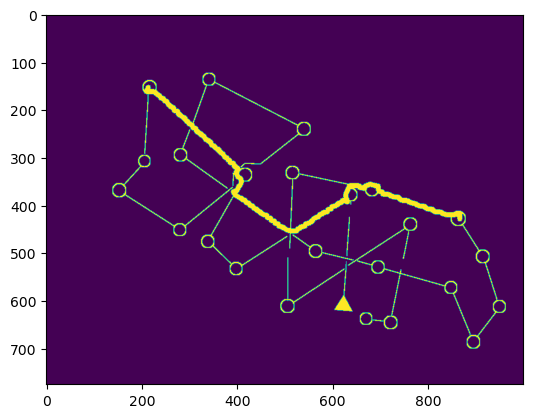

0.6688088865654036 0.8958868759456368


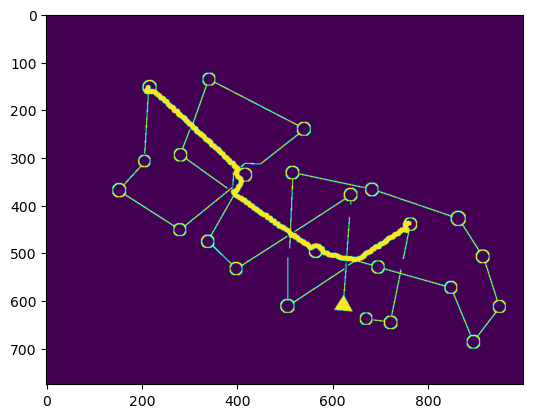

0.5006093557737756 0.8257407157717312


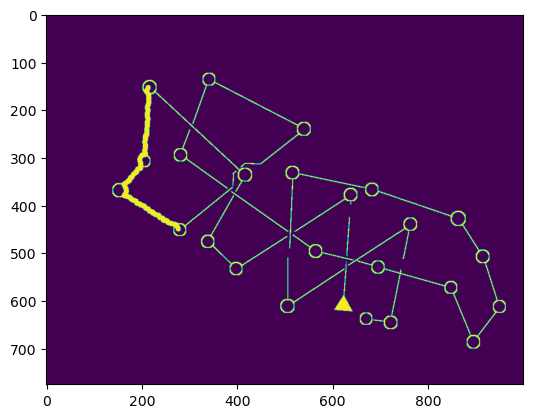

0.7155973861253995 0.9205467581366307


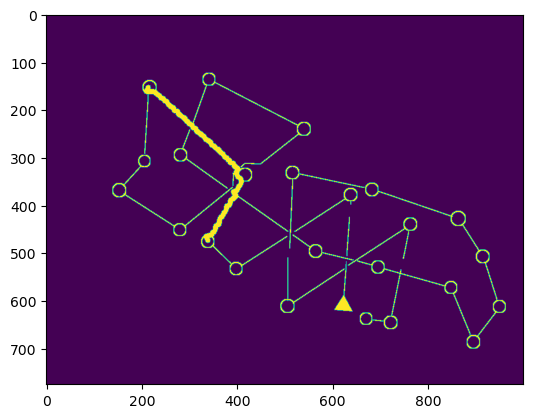

0.6962699170844513 0.7922351544564878


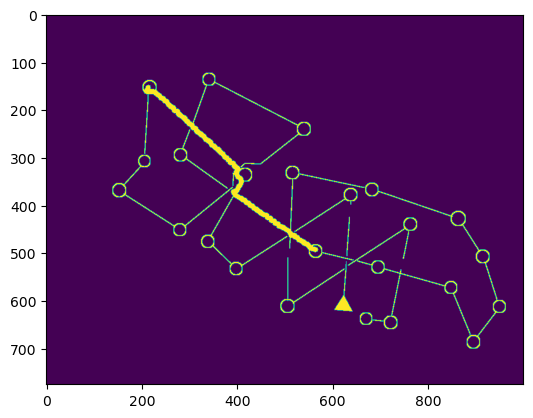

0.35985164841570616 0.42364609046796964


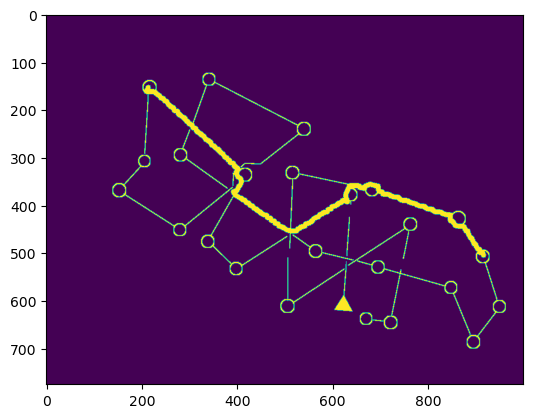

0.5813435117458547 0.8019518643685567


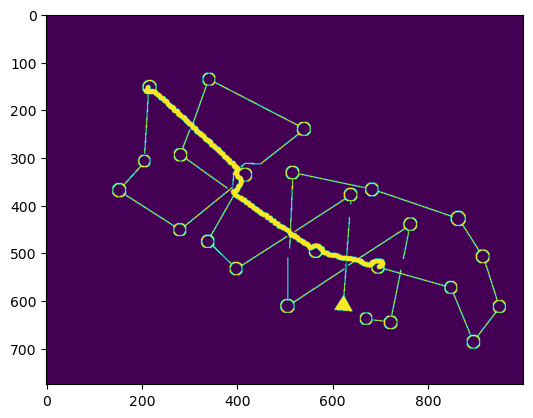

0.4400058639576272 0.7923677836232659


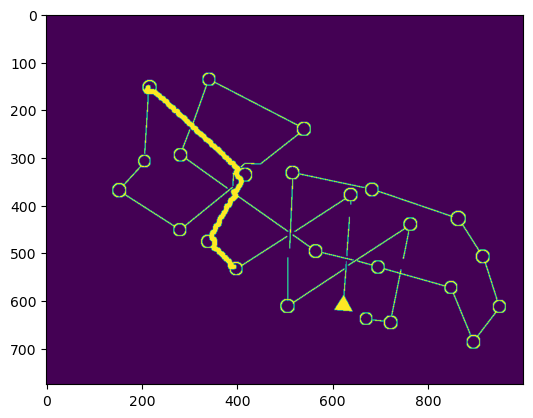

0.5900142317359642 0.8211118271352883


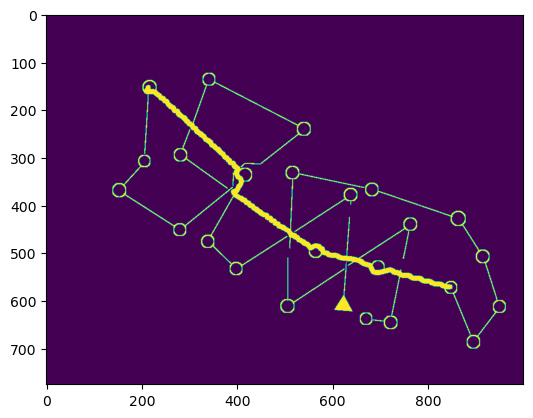

0.29779330348576694 0.8358023238927513


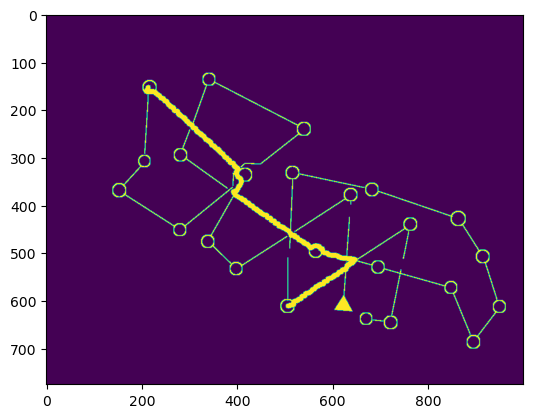

0.8956924969082136 0.7953911514880428


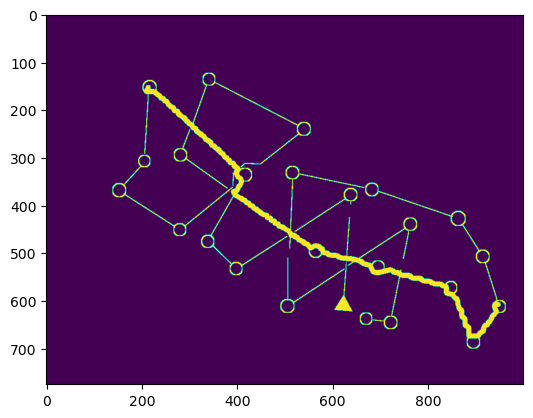

0.430964427140649 0.8747564506154534


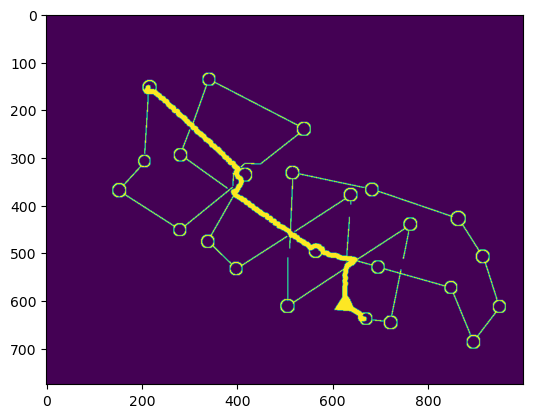

0.44586519127498936 0.6404907155803935


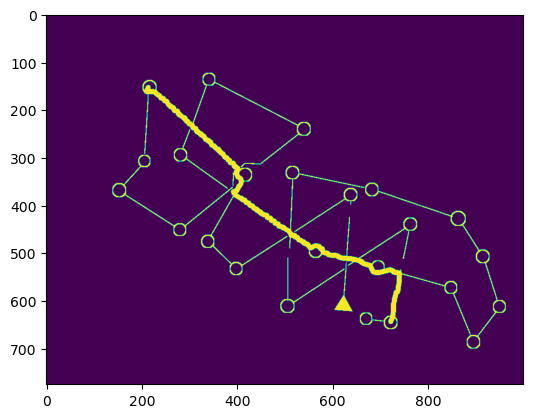

0.4208811910038601 0.4959308312091033


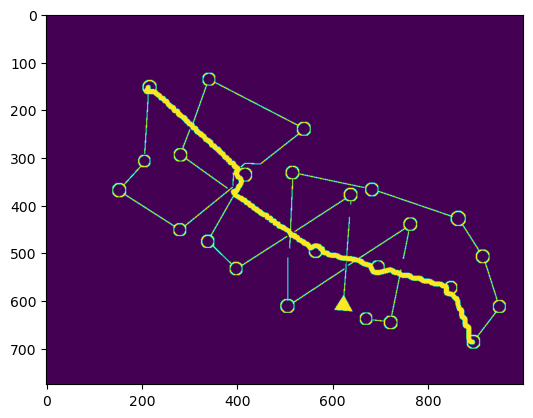

  8%|███▋                                        | 2/24 [00:05<00:55,  2.53s/it]

0.36339580988944764 0.8134027126422584


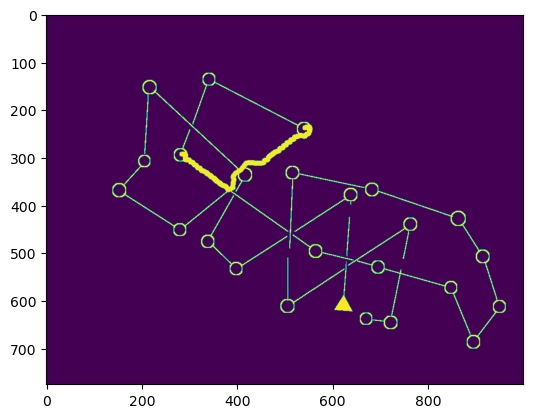

0.9917251095261876 0.8498027133978395


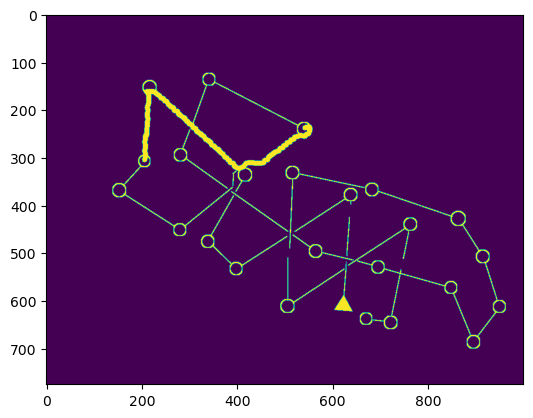

1.3715091364459635 0.8156035545550232


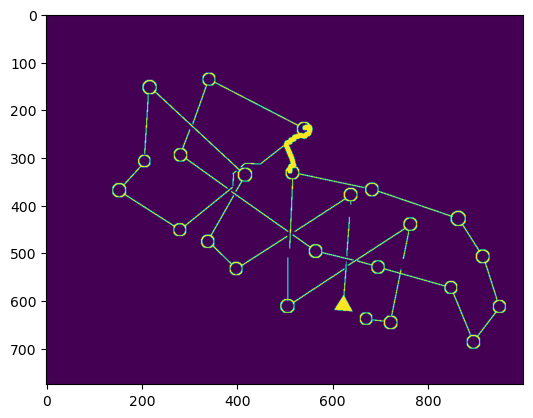

6.1209944795896565 0.7342432933128451


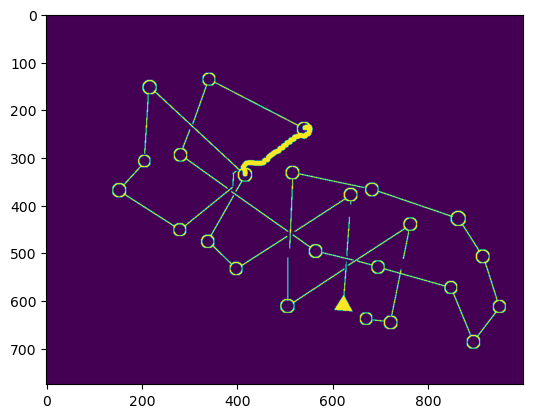

1.505257037507362 0.24840260456640798


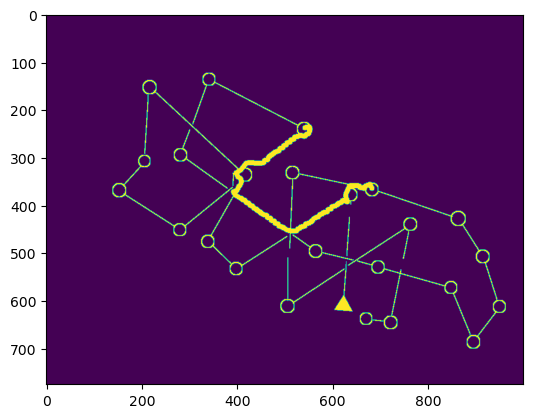

3.400533184023141 0.845112337130487


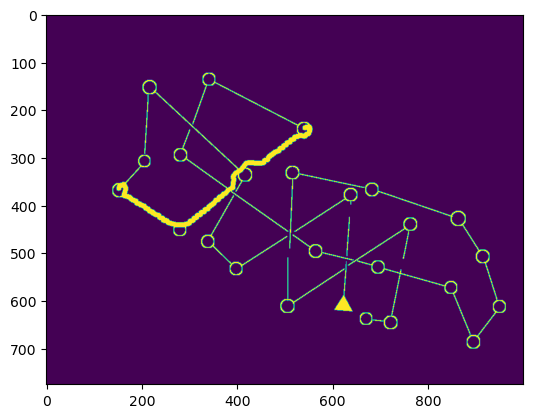

0.868576385692146 0.8660054233908012


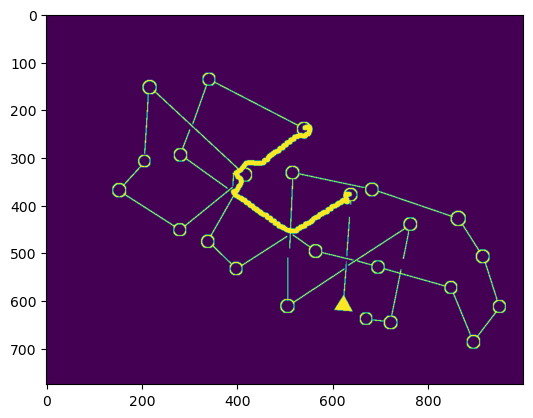

3.5251082952827852 0.7420913749552664


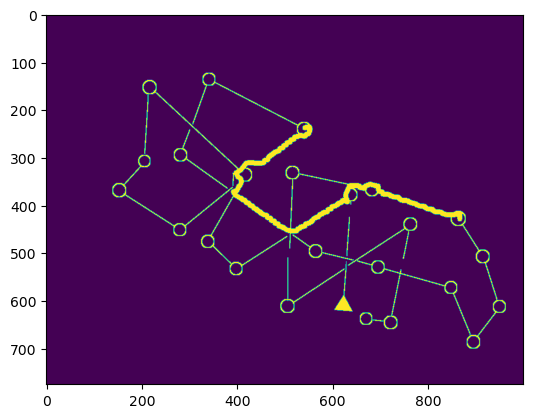

2.024675287405659 0.9270510674194108


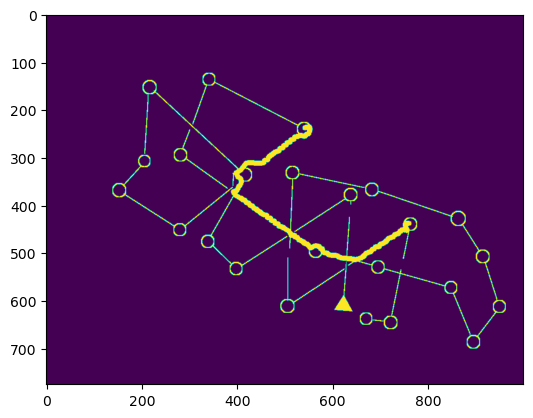

1.9525086156323472 0.819934697414272


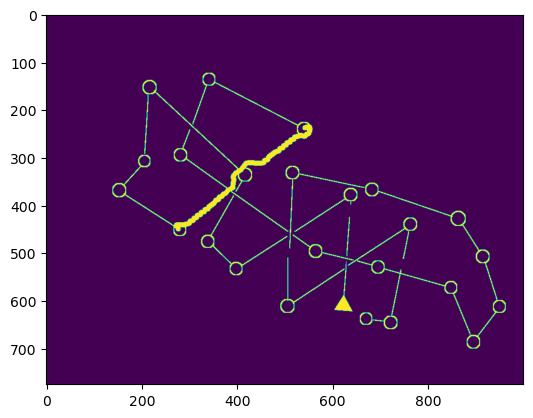

0.6538551838087443 0.13977637217804165


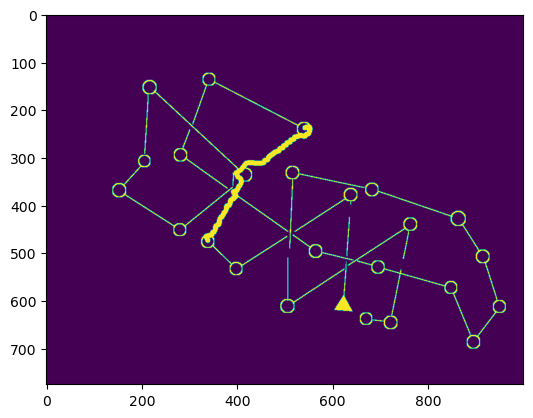

0.7508402822224387 0.714643285777412


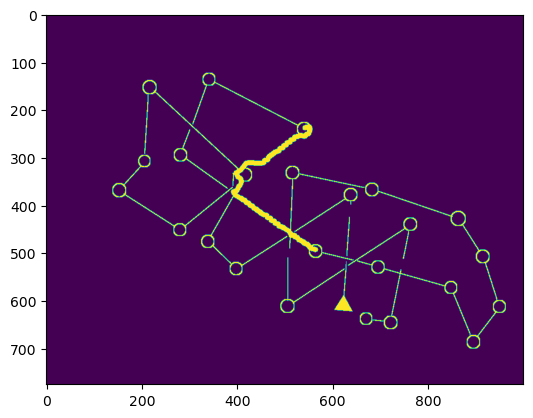

1.4177836348965807 0.824509593455348


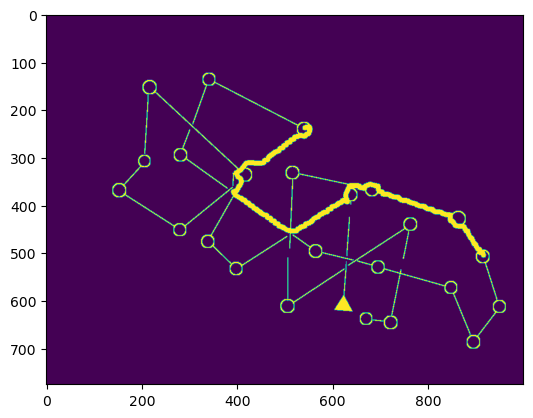

1.5971075653235194 0.8624038411617962


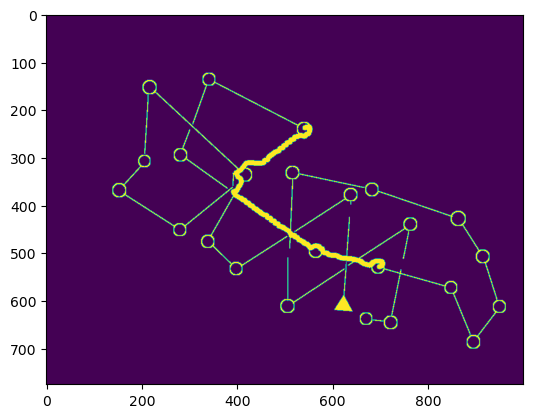

1.5425078781377404 0.8129935370811691


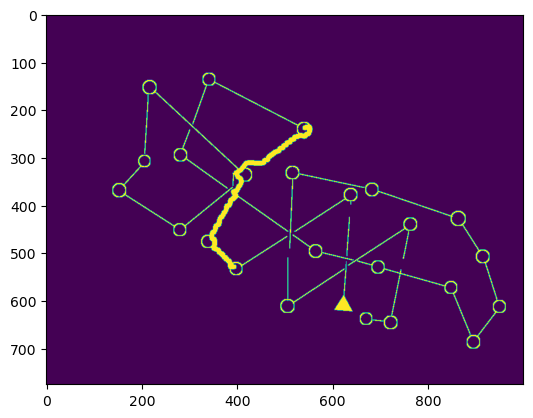

0.9237954363138956 0.8802769906109457


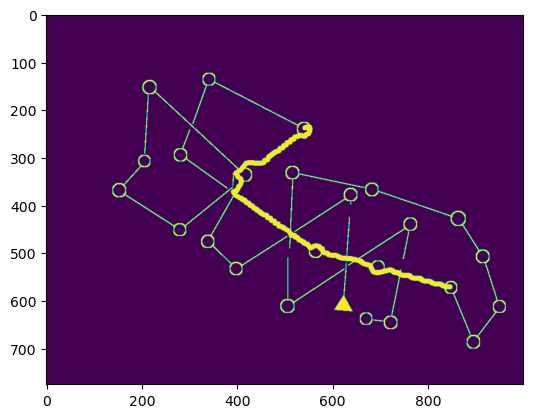

1.0759845130797263 0.8156965697410593


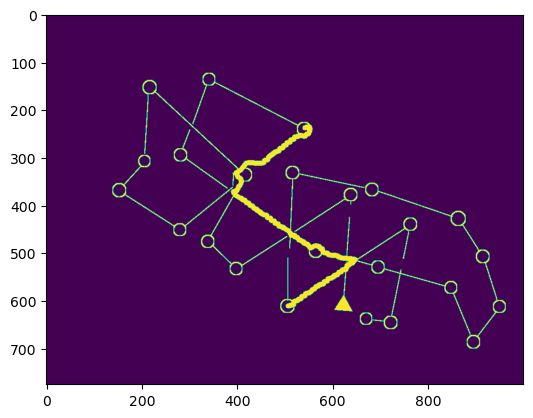

1.6417593273575228 0.6789261837915433


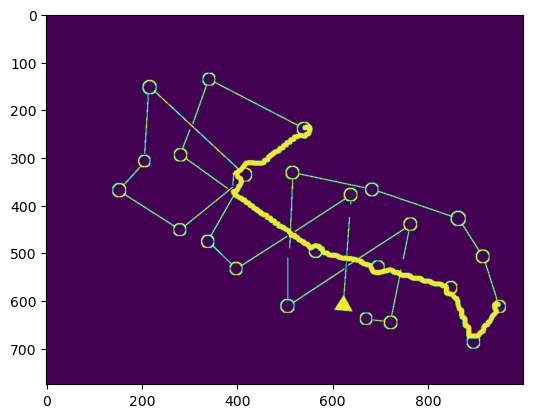

1.159562901978989 0.8598111033529716


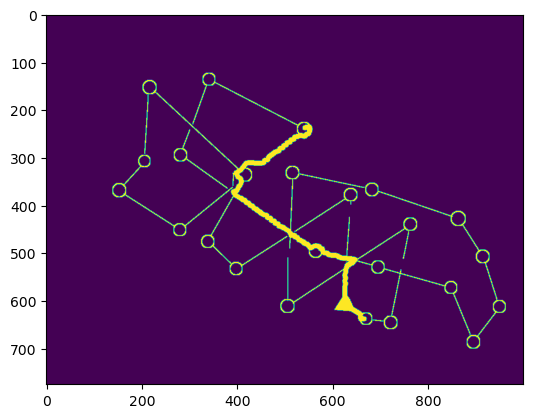

1.1896872472418911 0.8221256230575656


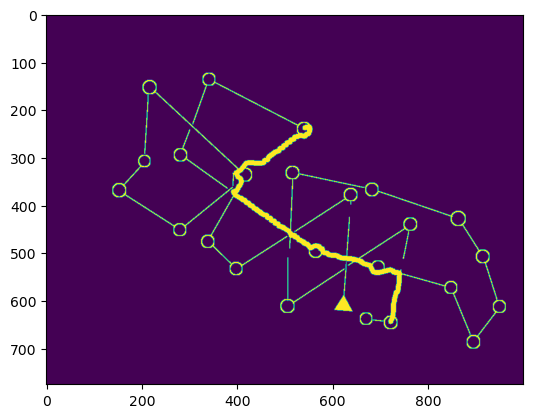

1.1620908745282277 0.790514475999383


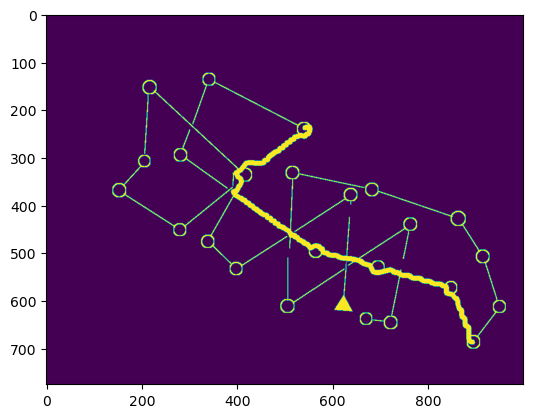

 12%|█████▌                                      | 3/24 [00:07<00:51,  2.44s/it]

0.9891532481116039 0.798195252426948


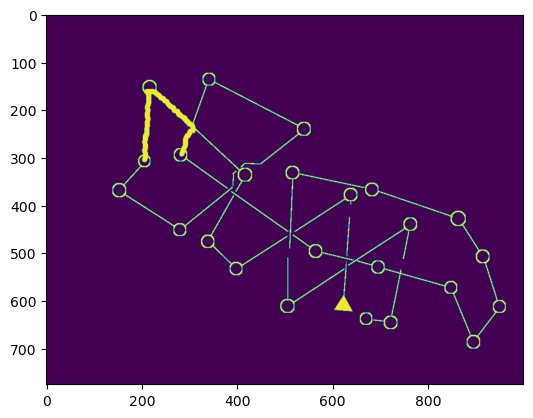

6.411843840901569 0.6858291973055378


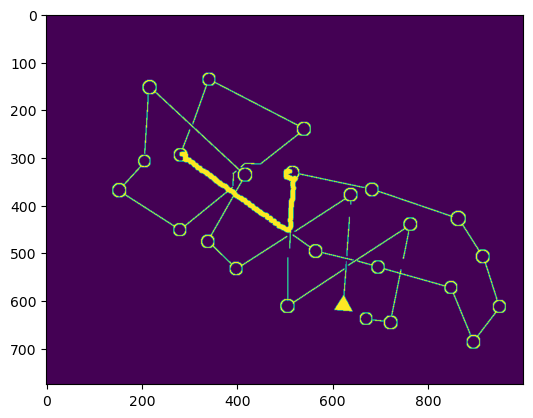

1.348560897116657 0.6777410204104177


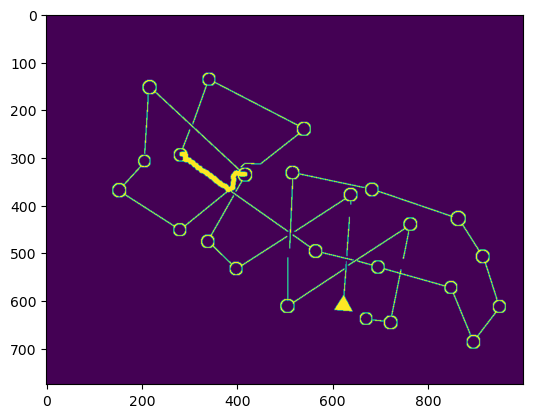

1.5986253641214079 0.7688099003529698


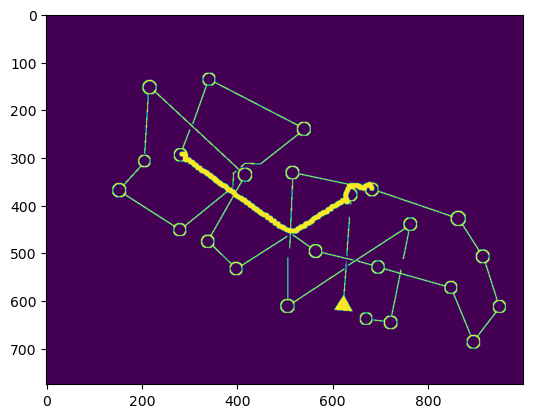

0.6218238936205414 0.47220078992018427


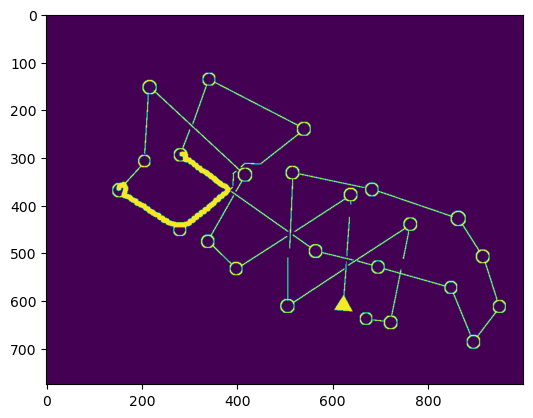

2.873853050570766 0.7665522140570116


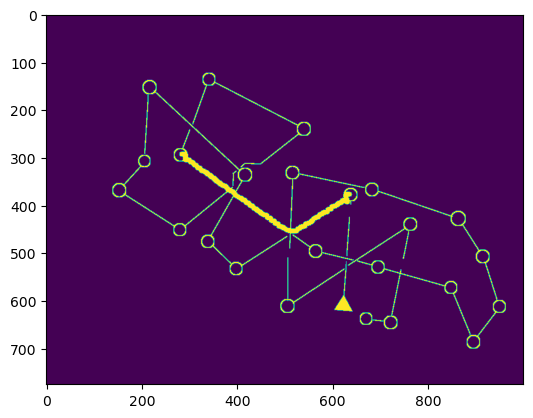

0.5957796954791368 0.7139974294629503


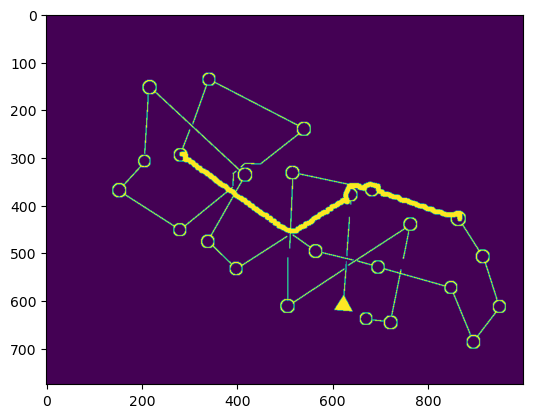

0.5938834529684827 0.6560088738007117


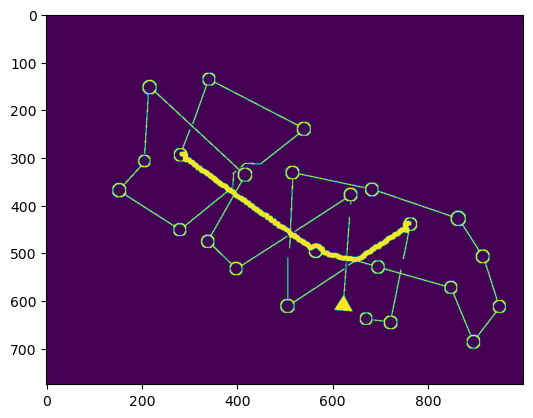

0.4018636982533017 0.8291591921422367


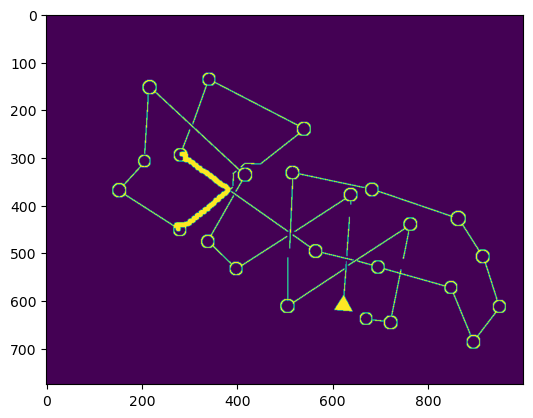

1.344865679902536 0.8542764021234128


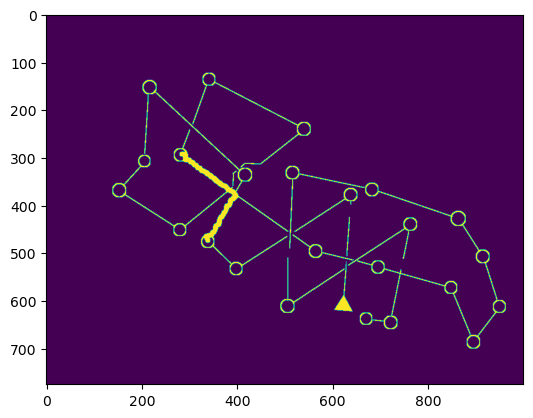

0.9168095504588556 0.7929814852583211


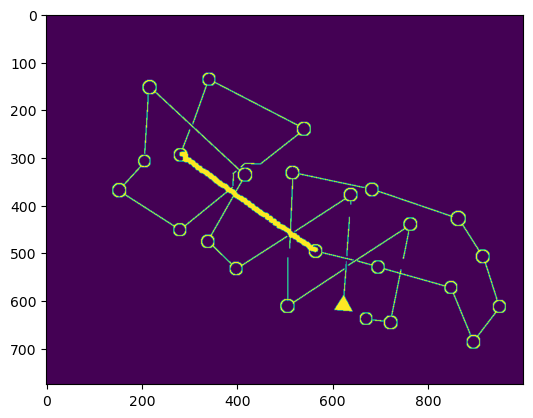

0.2764460601062002 0.02306251350756497


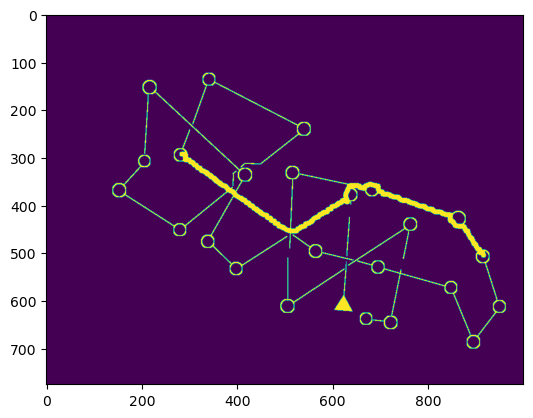

0.5222392586335165 0.8384793293456737


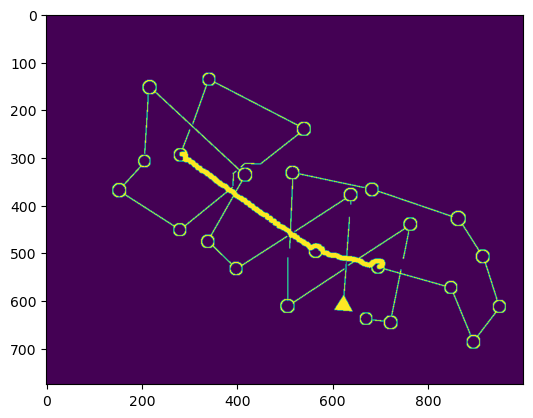

0.3782478278915349 0.7856362724272486


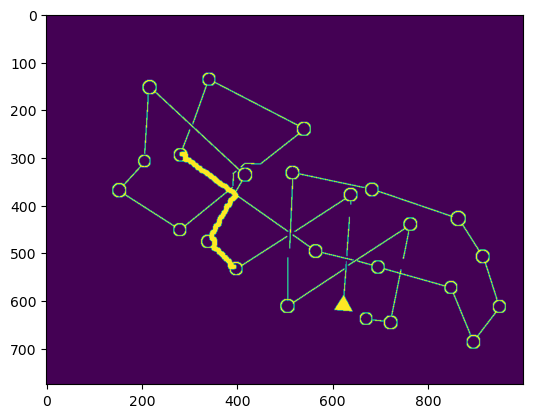

0.6903682459098825 0.7955413380378852


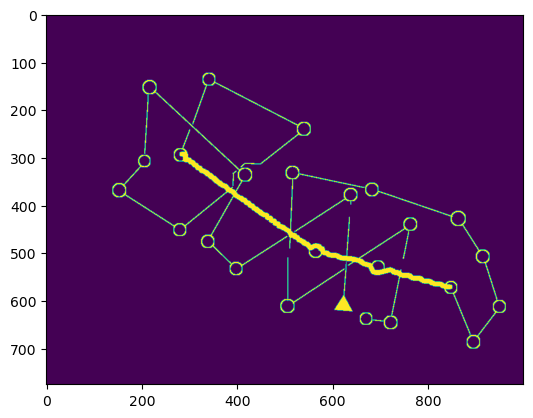

0.20878493910923224 0.8430680682381646


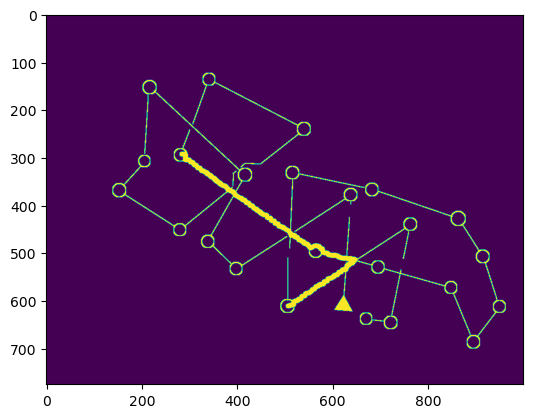

1.0784257263986876 0.8307969317383989


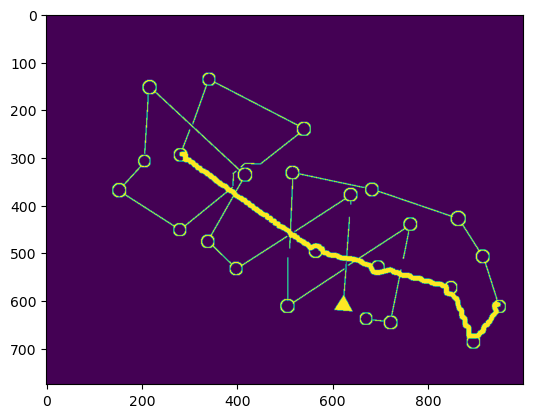

0.3741901044764766 0.8150524259009653


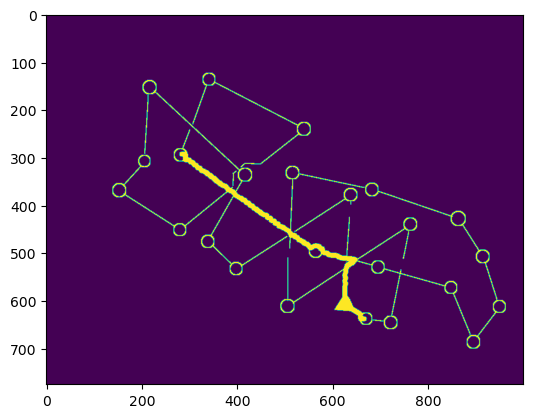

0.4252686939093535 0.6952999979746982


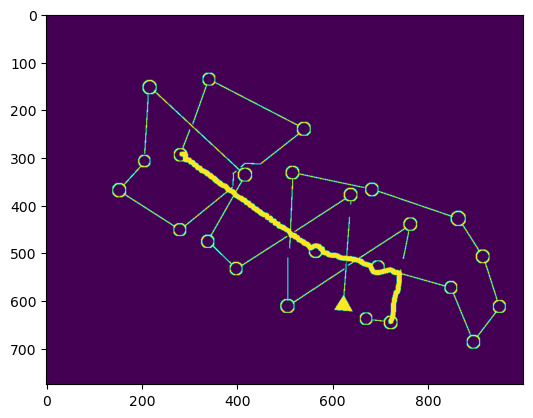

0.387776546716301 0.5969610636230568


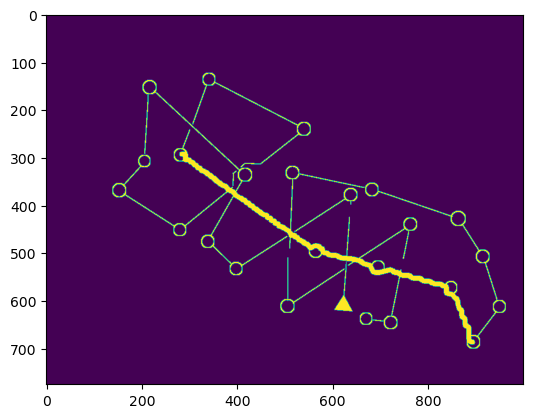

 17%|███████▎                                    | 4/24 [00:09<00:47,  2.36s/it]

0.3124956349231214 0.7737539711641013


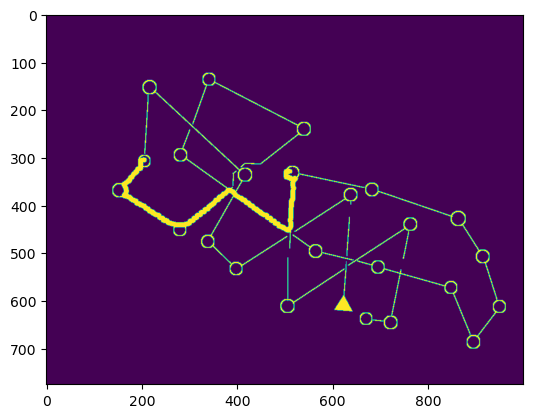

1.7353790670264244 0.6840240183337369


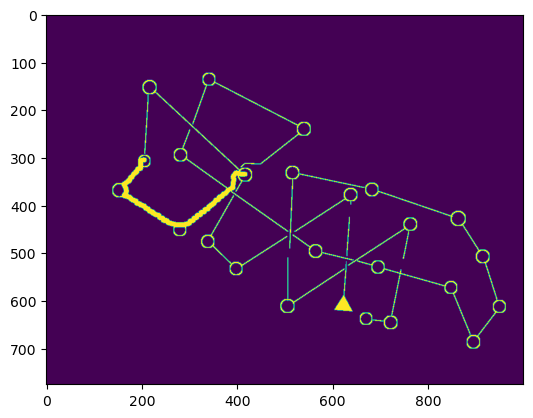

2.108142439754813 0.7165336006152316


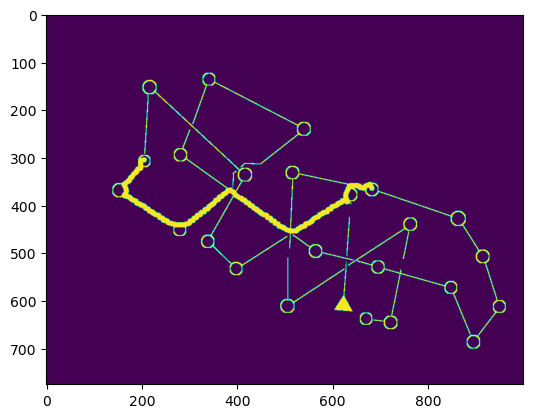

0.9864328709050483 0.6525692591649583


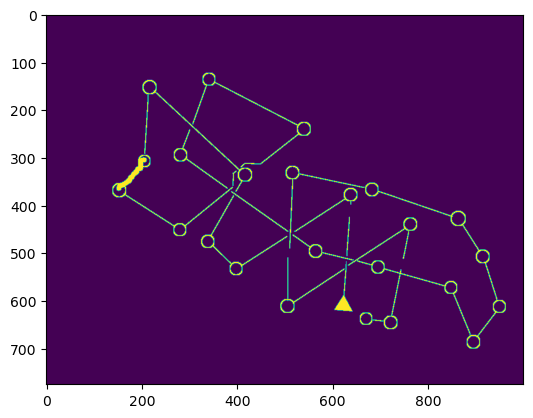

1.9076784790426853 0.09992976157091807


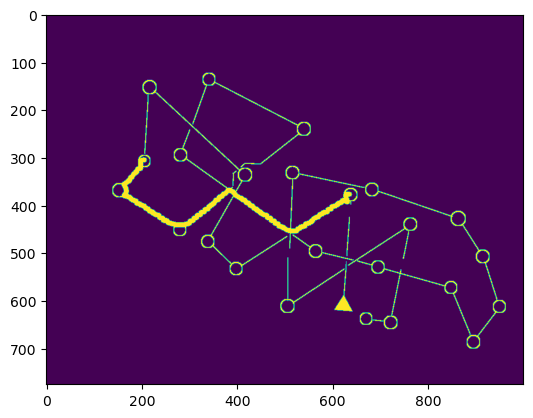

1.0039207649477455 0.8046160942147597


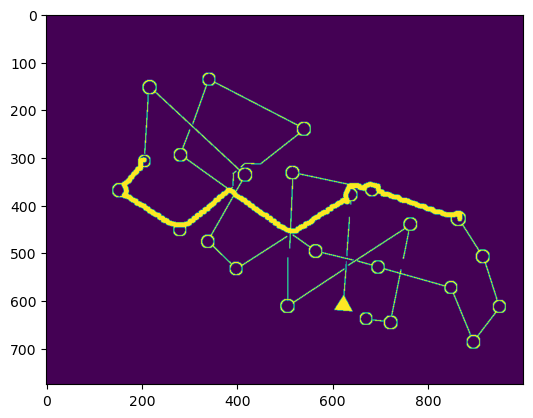

0.8621414791699522 0.7638274700080495


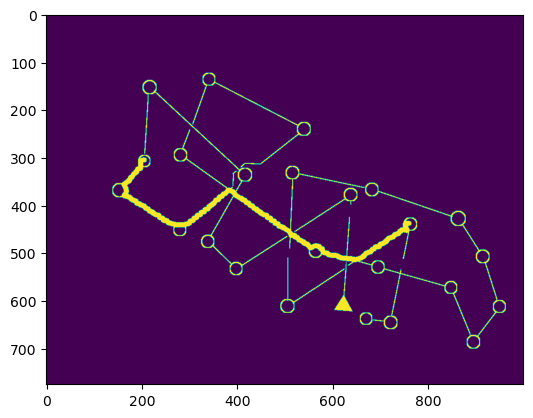

0.7440881844641767 0.8277127537641021


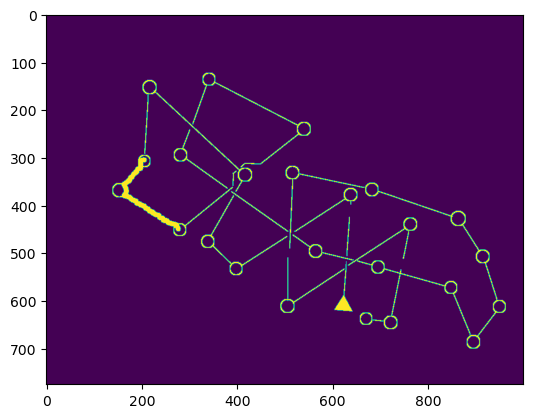

1.2367218840970002 0.8176078764022268


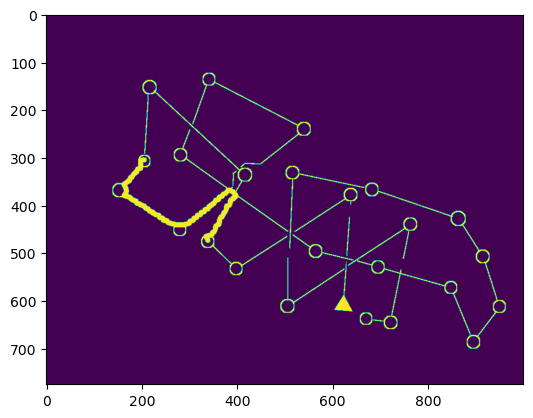

2.0813069824886616 0.8144011366375091


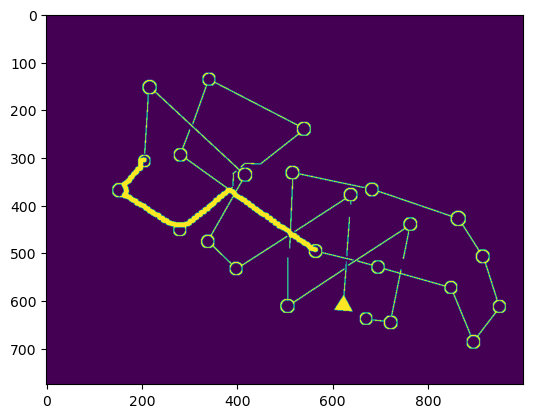

0.820429522512377 0.7567491177357106


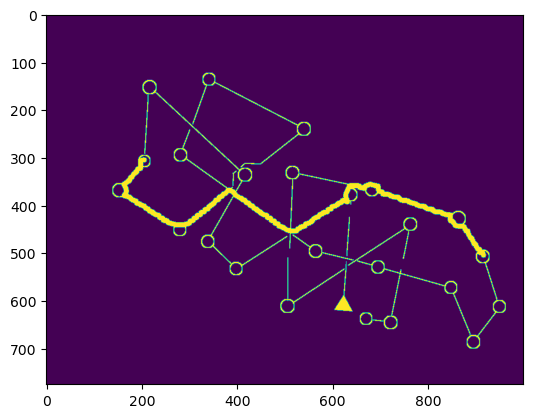

0.7789293526028003 0.8188506867324333


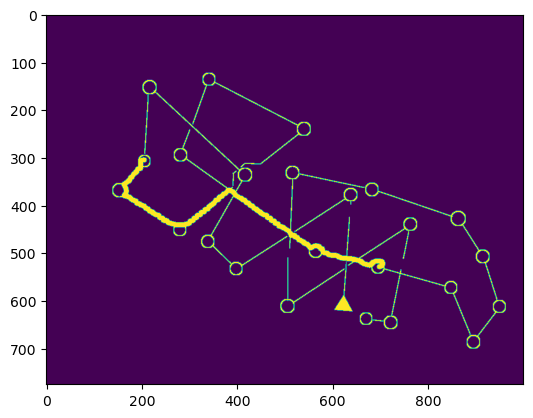

0.7663020454338985 0.7143756429513803


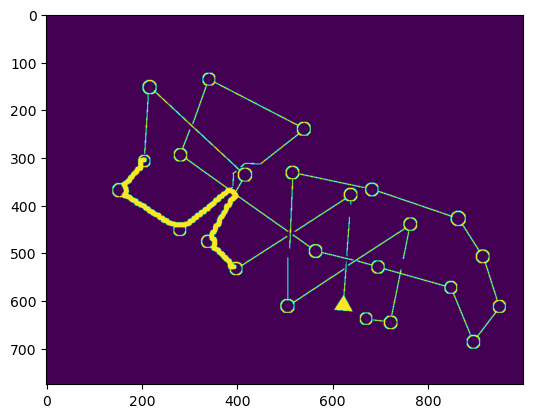

1.5129550779330625 0.6200504888922473


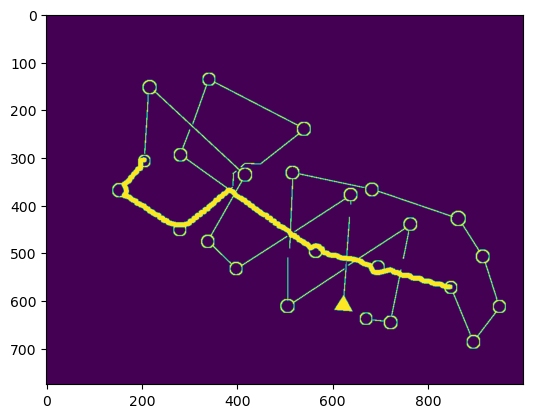

0.5205857414512083 0.7702914618713894


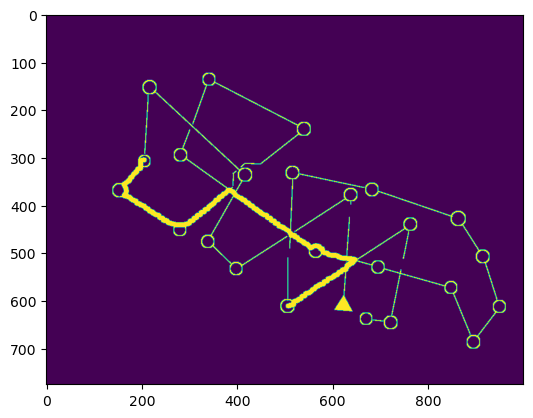

1.581443962928963 0.8550869992472474


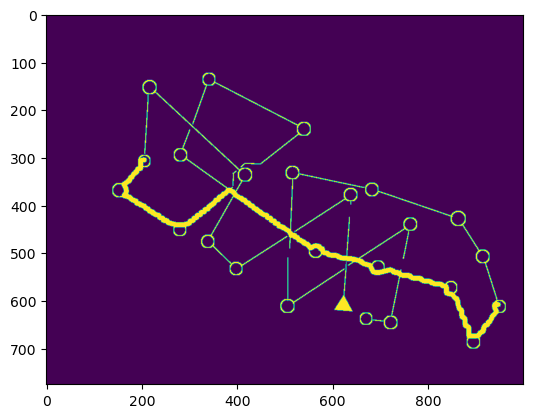

0.6299383269827035 0.793817292072491


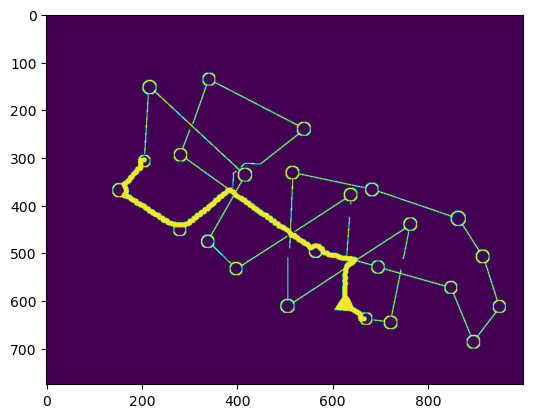

0.8129854739226945 0.7789989197629122


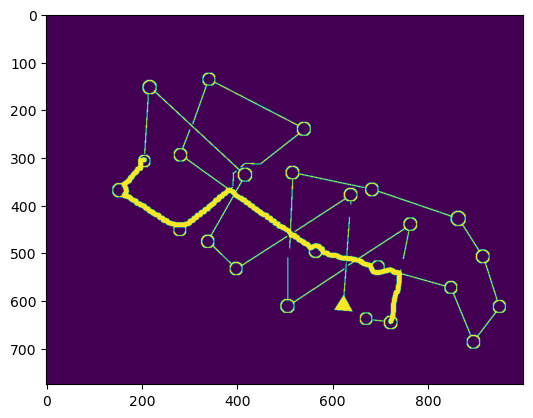

0.7433805295730977 0.8599715745670808


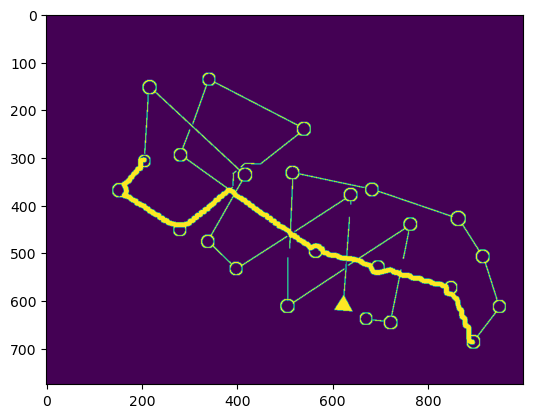

0.5884559130624818 0.8347346426987875


 21%|█████████▏                                  | 5/24 [00:11<00:42,  2.26s/it]

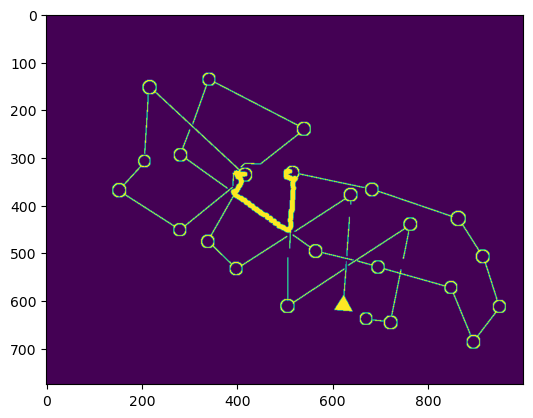

4.641906157659581 0.7396672246065514


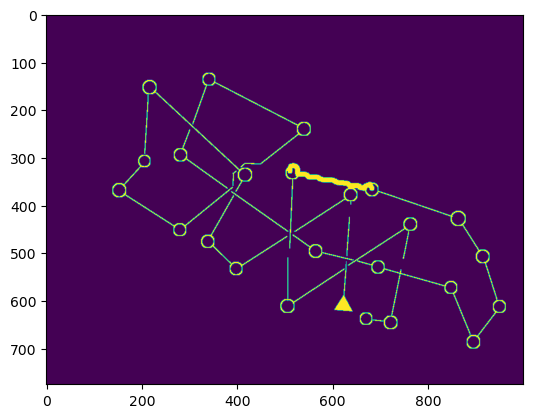

0.702857258683123 0.05860694198144592


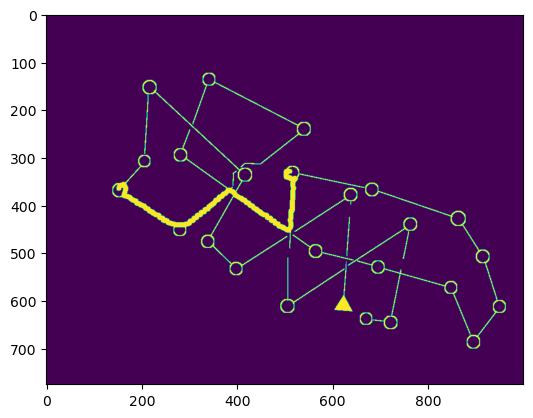

1.1593912597176423 0.8026704710803338


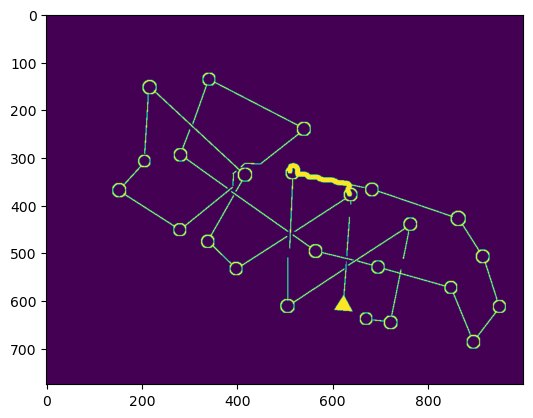

0.9257532739955991 0.6031764659959786


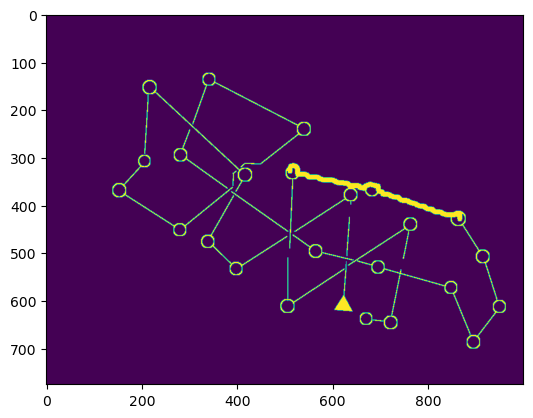

0.6109131742225973 0.22177007369794838


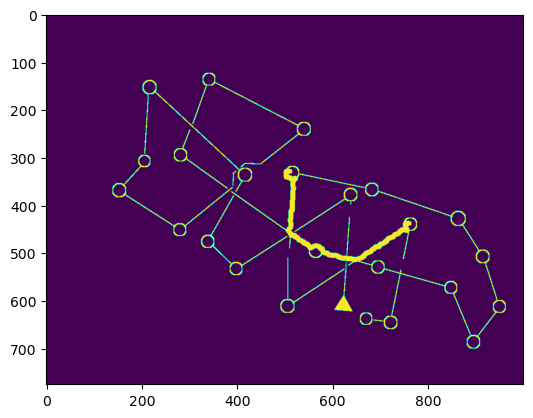

1.1865345015077544 0.7715725894104645


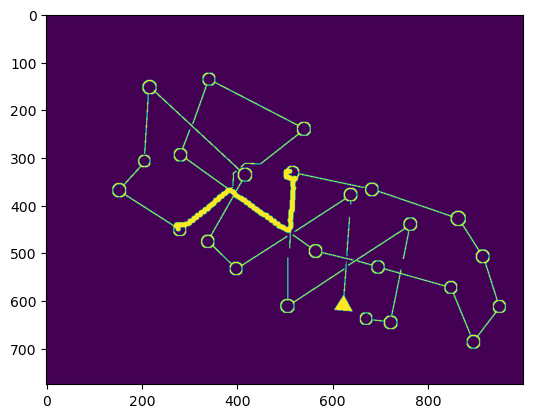

1.1906922691523154 0.6836470702009808


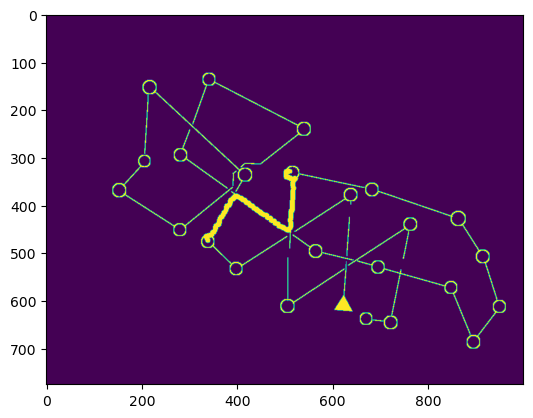

1.3470999945572384 0.8151546454126174


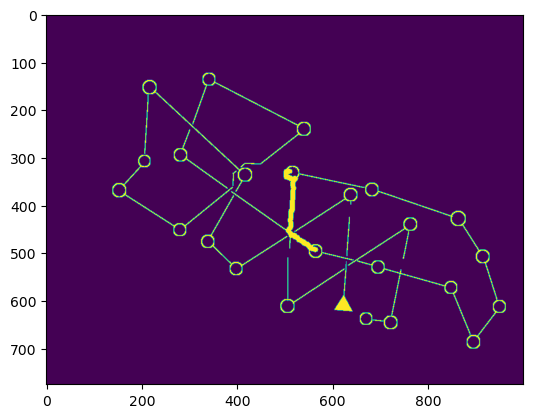

0.9214877766411647 0.7945611616921575


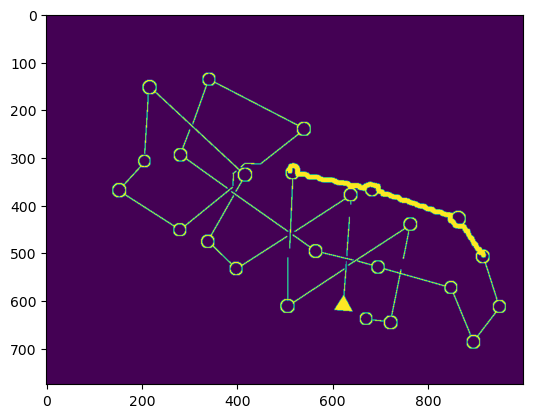

0.48366590624437933 0.8062184547139265


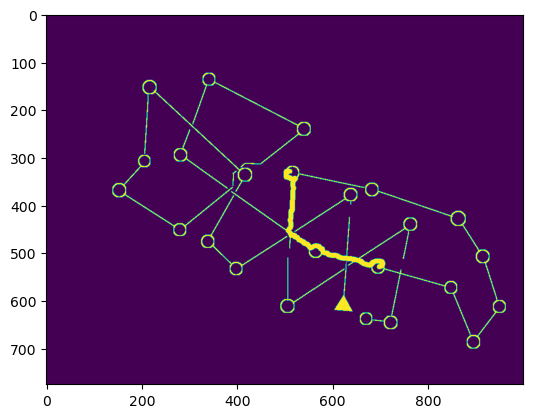

1.0268042391073728 0.7588056034526987


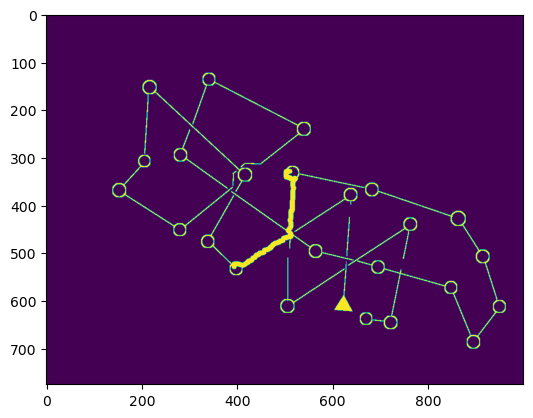

0.9521425566376556 0.8323421010718796


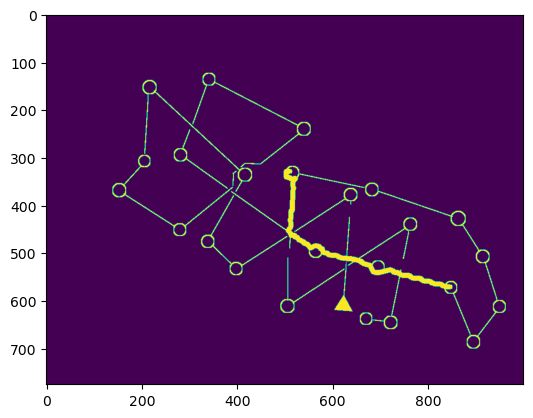

0.5785761451924529 0.8465925490997878


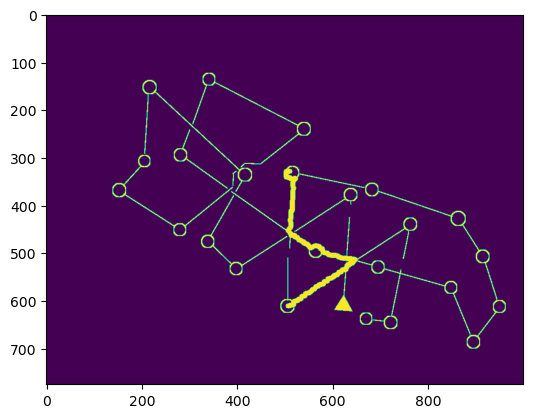

1.477501120272029 0.08238437460181681


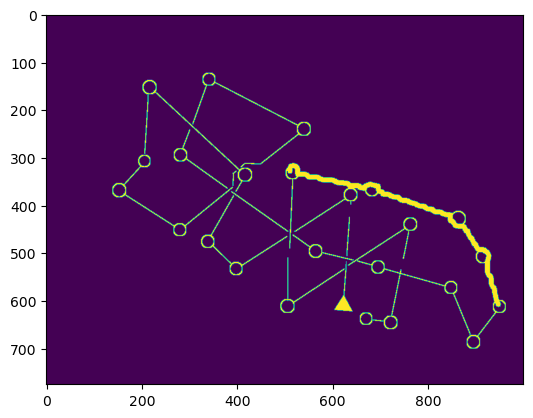

0.4551355466087661 0.8814577539900177


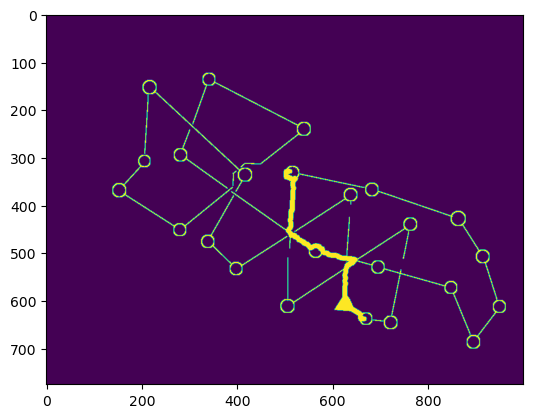

0.8205674283971272 0.7763661988355456


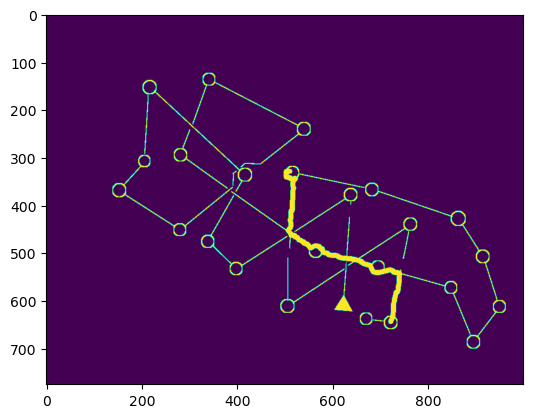

0.7780395473630817 0.8101109411466091


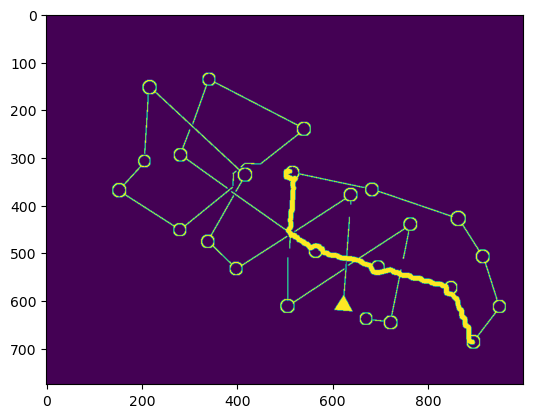

 25%|███████████                                 | 6/24 [00:13<00:38,  2.14s/it]

0.619571086587605 0.8375985210027039


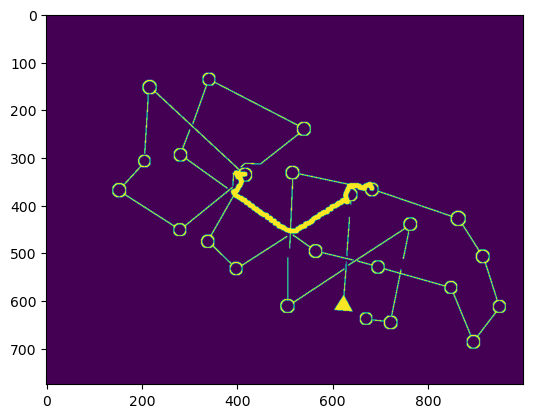

1.4894668767993178 0.5875555018769505


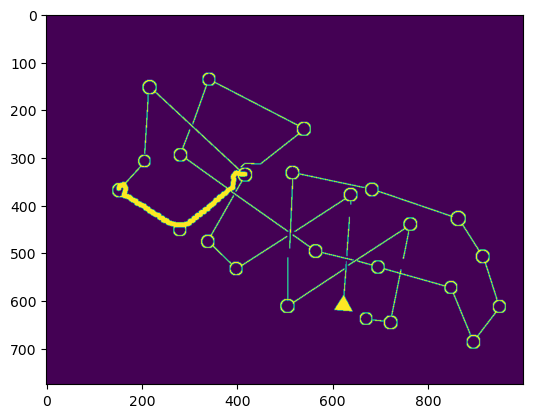

1.2447745998820787 0.7990303589833302


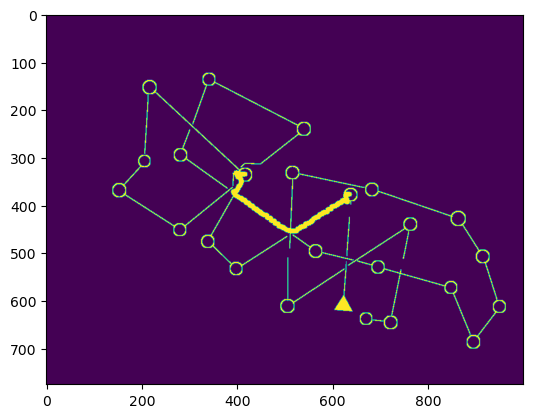

1.6147167573886132 0.8461105911549665


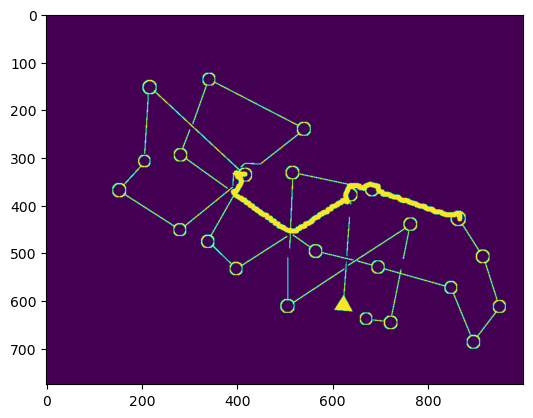

1.0990539989862453 0.7849587350375639


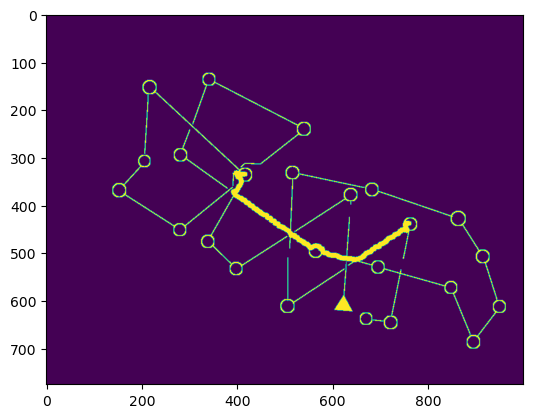

0.9676083459401319 0.8385321549053267


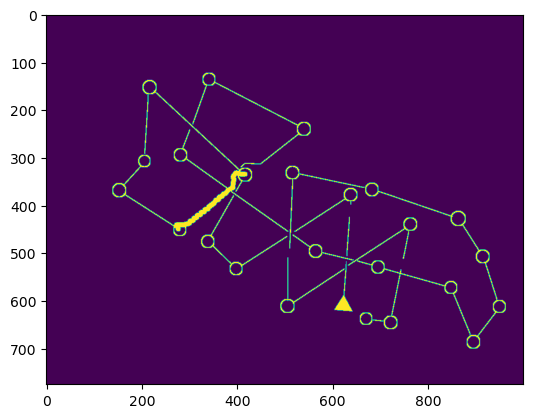

1.1584078720093007 0.32329667408575463


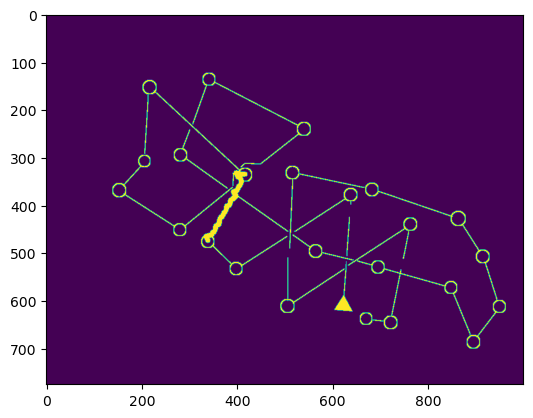

1.3341957041842063 0.06846974065607006


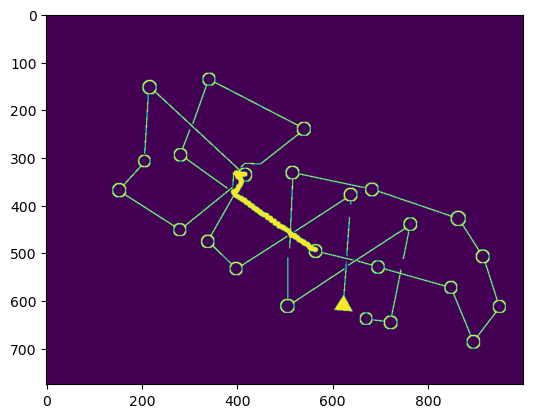

1.0640169965466946 0.7476046839025574


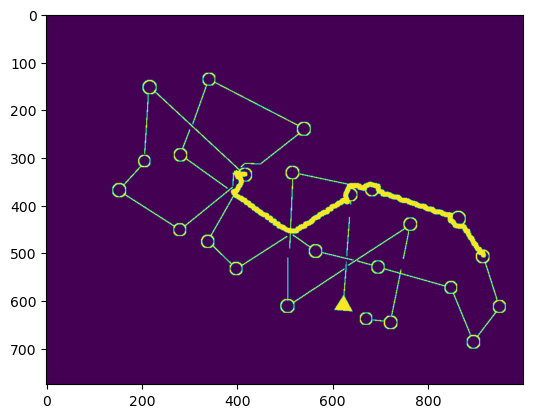

0.9416605406538179 0.8434875985048071


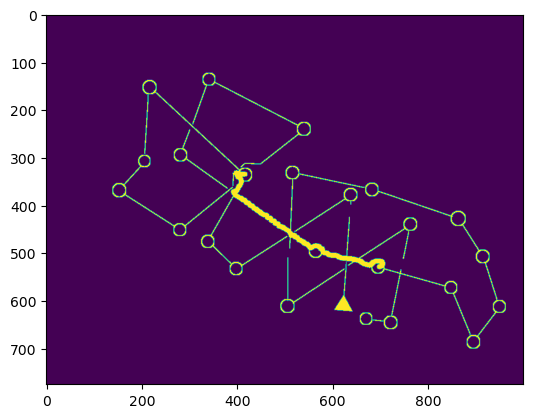

0.9507561728087472 0.7848580298273053


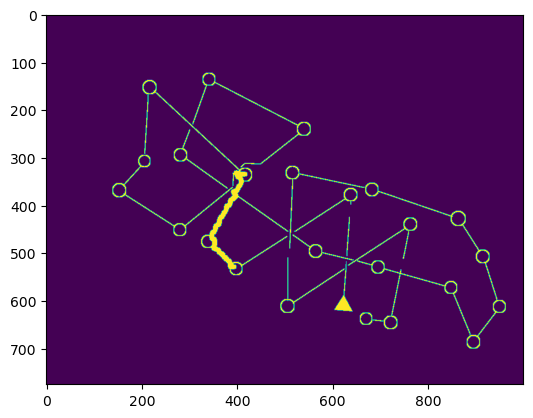

1.3053083483048704 0.7896728960375227


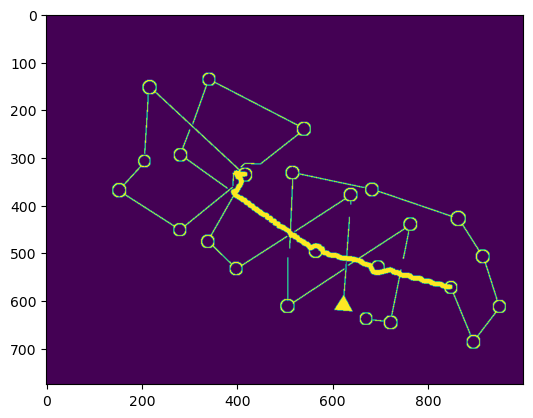

0.5640166817575947 0.8500335092801872


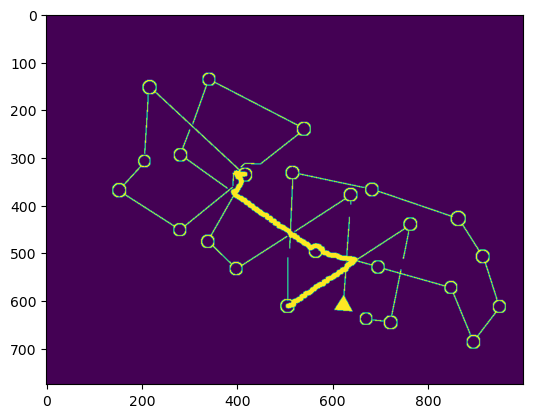

1.8093224725418922 0.8094982328918389


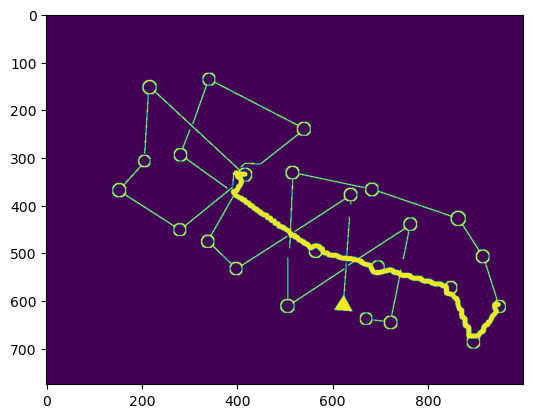

0.7041337132957848 0.831595120481676


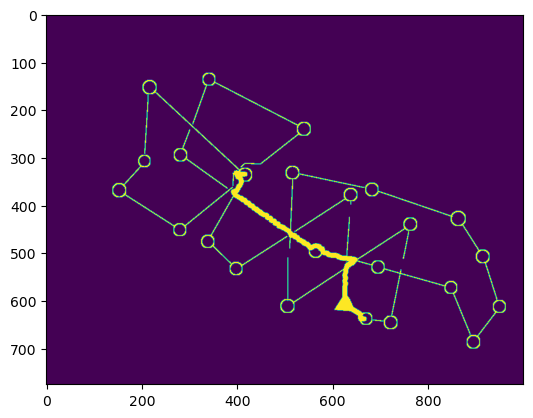

0.8901764312536771 0.6451802218679219


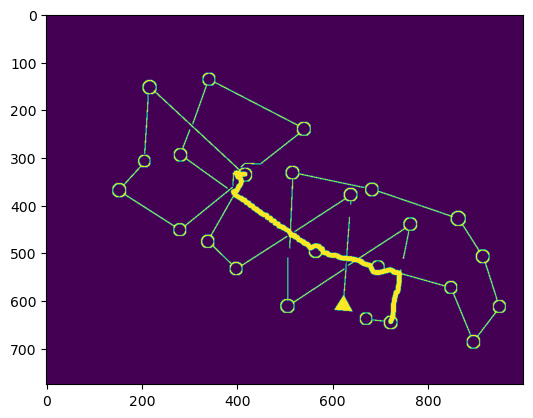

0.8132687811065107 0.7380411415234076


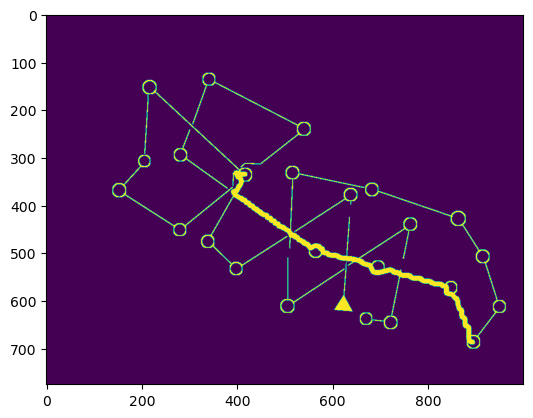

0.622820820805029 0.7819810172791064


 29%|████████████▊                               | 7/24 [00:15<00:34,  2.03s/it]

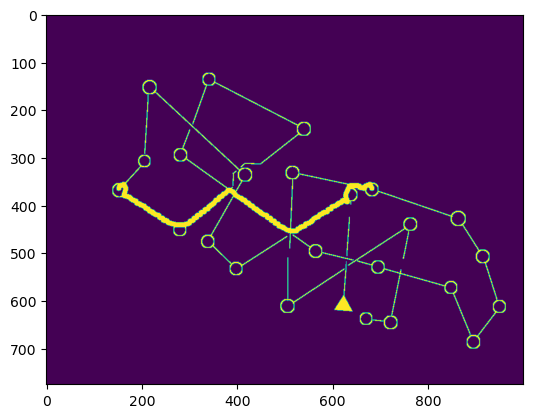

0.6834668513770881 0.7882783647184285


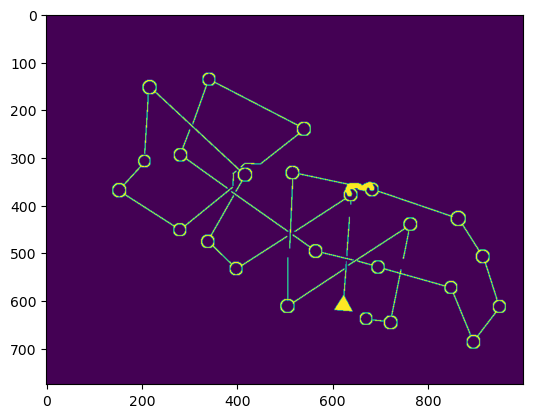

2.4105025385635654 0.42108009681903946


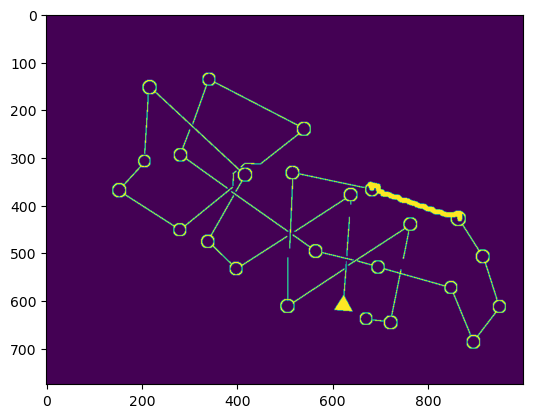

1.0132032968466702 0.05768657782570777


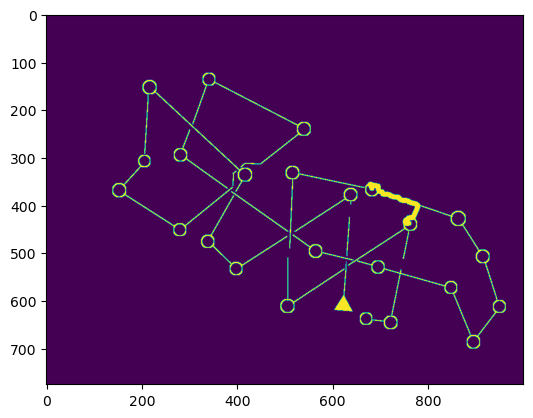

3.734767989273025 0.7294517963972094


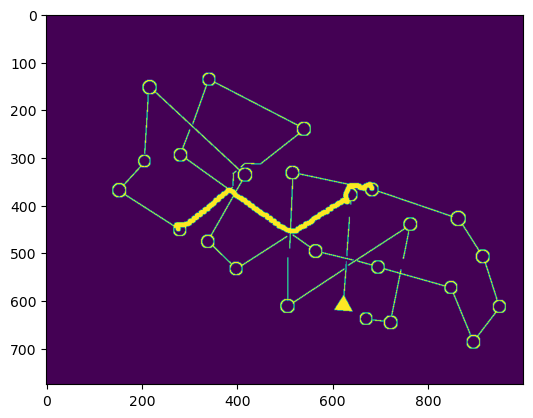

0.66316033935232 0.7890906719554797


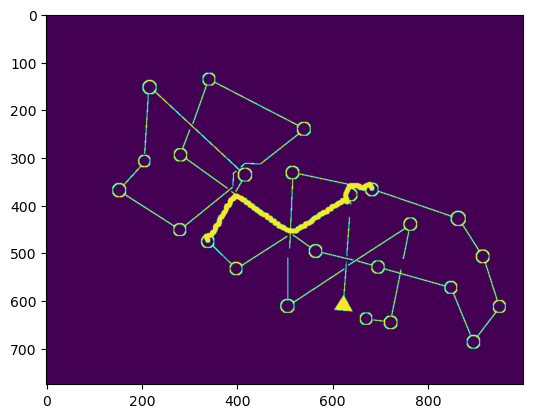

0.775100553304938 0.8064160189255212


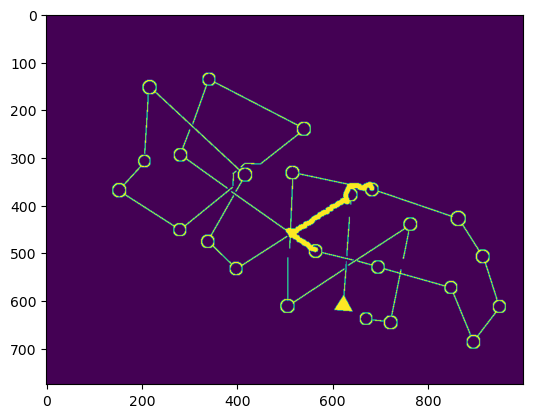

1.4817974197924415 0.8351041765959715


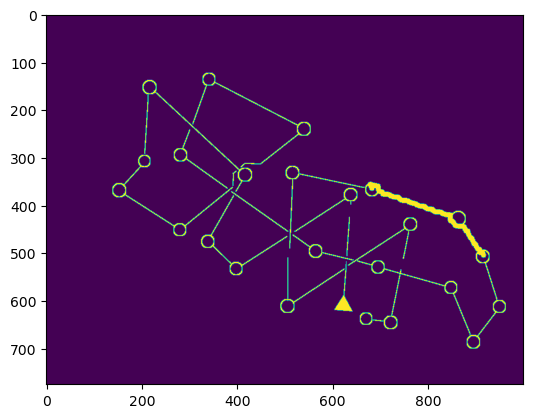

0.6575187681534462 0.8608469853837629


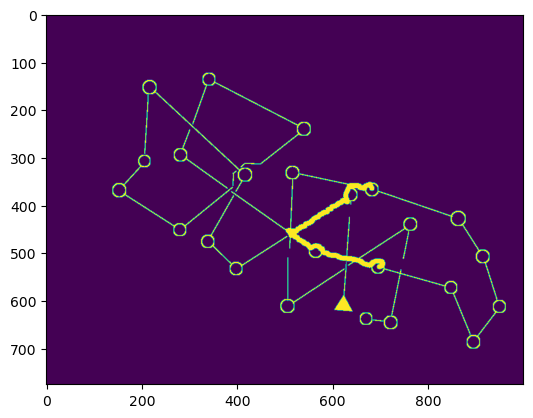

2.9803631311425787 0.781039495089436


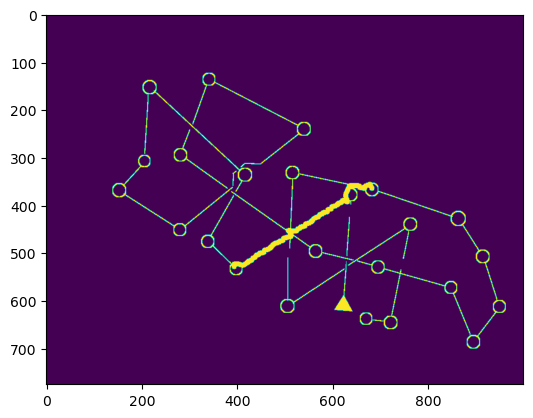

0.6978976356569639 0.24255680509385188


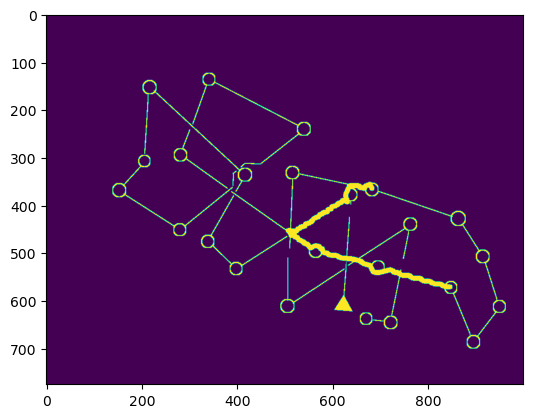

1.8495950046169392 0.7824311707592269


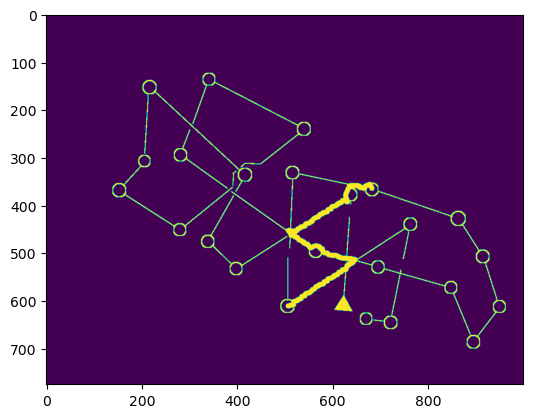

1.6428853937523957 0.779595900667547


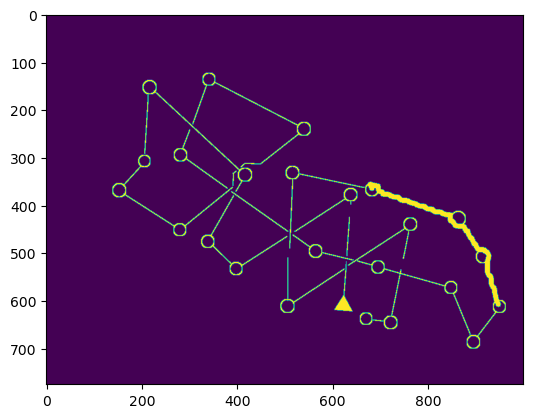

0.5299916997532841 0.8537353684623323


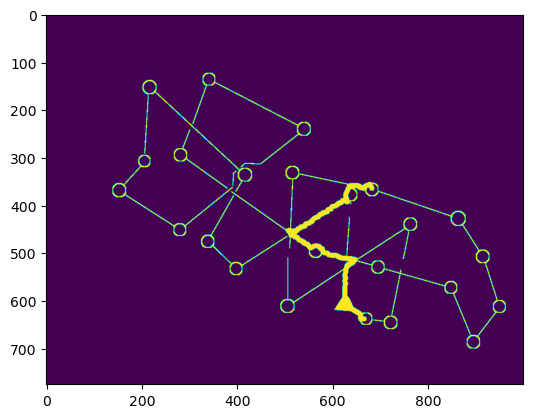

1.685296481163871 0.8264020325770274


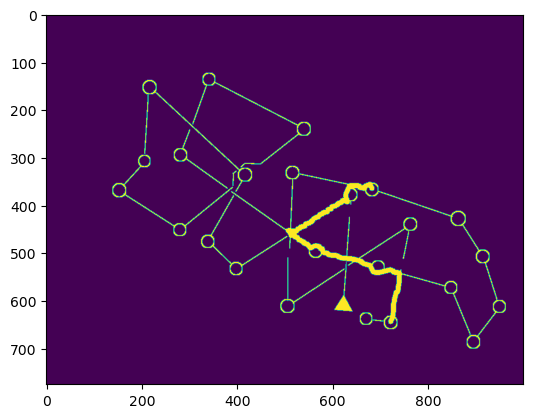

1.7494627040880535 0.7548165236546763


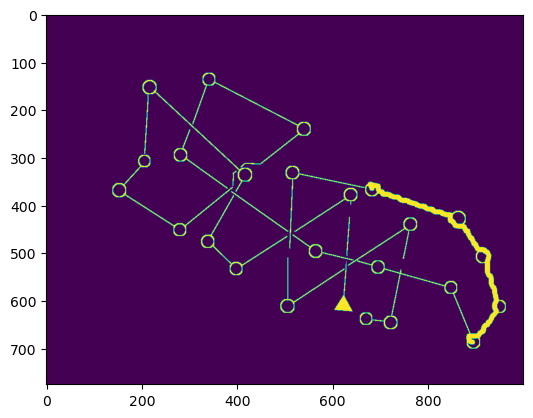

 33%|██████████████▋                             | 8/24 [00:17<00:32,  2.01s/it]

0.8741793728653726 0.795150290342418


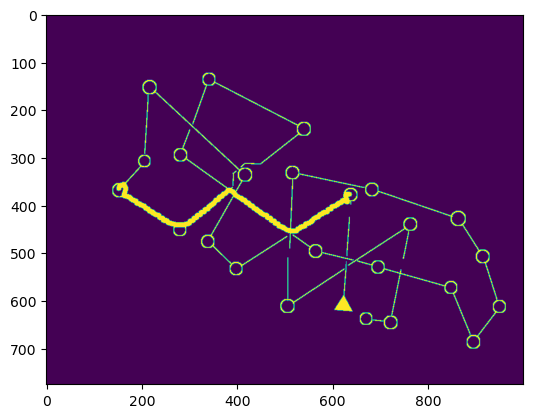

0.6789778416656826 0.8658303194401463


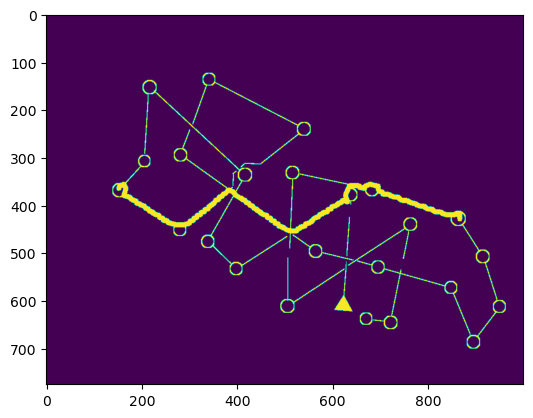

0.6578226793359396 0.8421676828235242


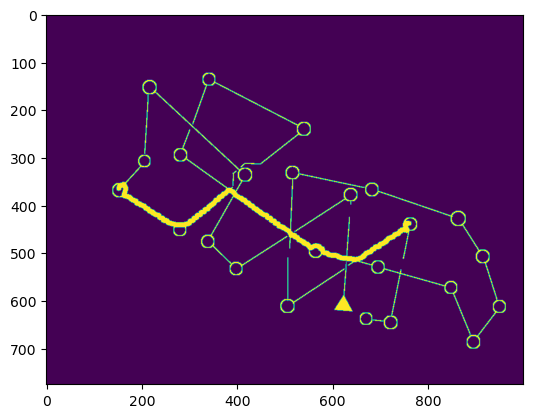

0.5237791556071336 0.8218623364844176


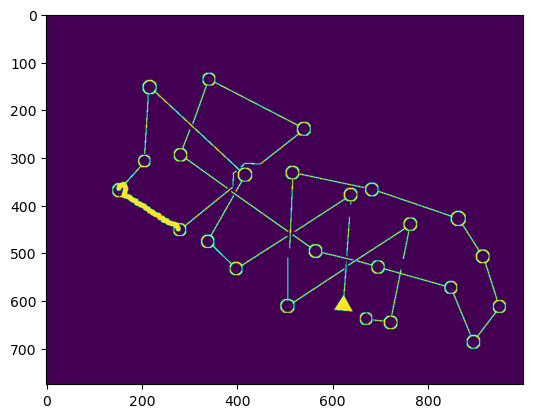

0.9737348251929443 0.06603573764586061


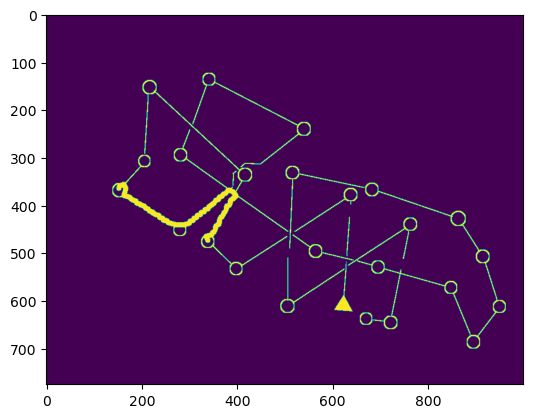

1.782741853181876 0.6068607582894303


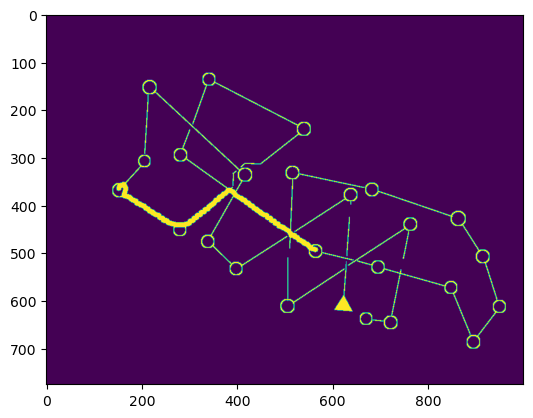

0.5654699186863243 0.8107404805595616


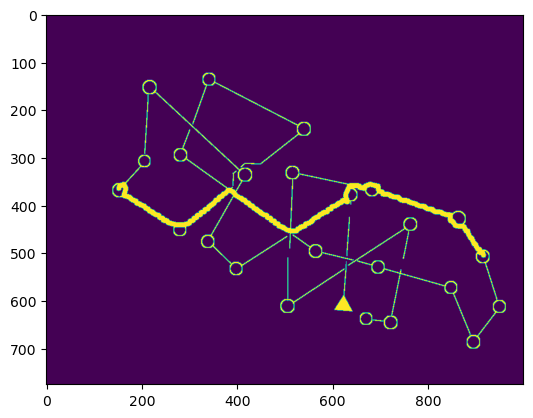

0.6109211702530322 0.818514354181994


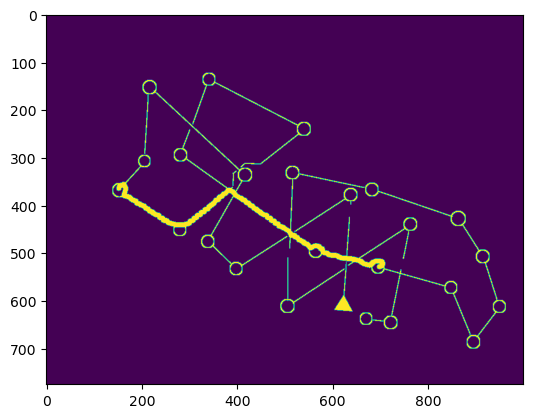

0.5665185391777983 0.6744759846829385


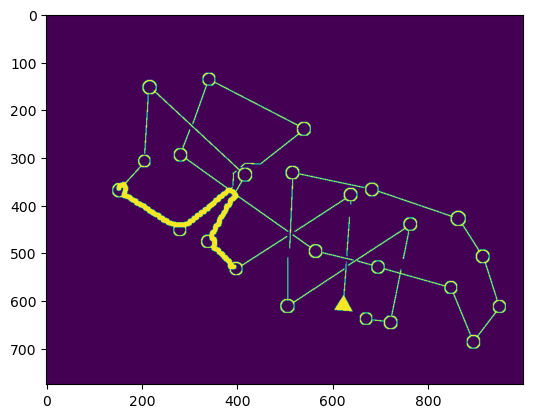

1.3067029839474764 0.3123385234192166


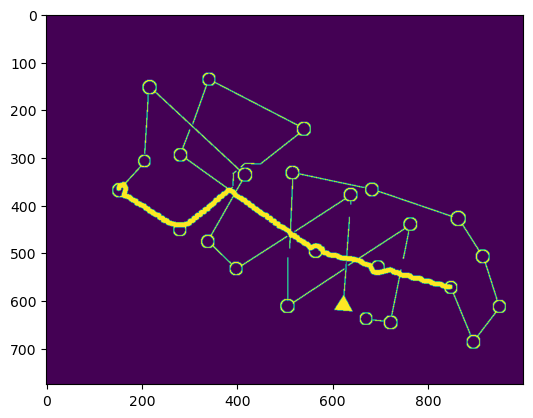

0.3716316698317885 0.5520261611396793


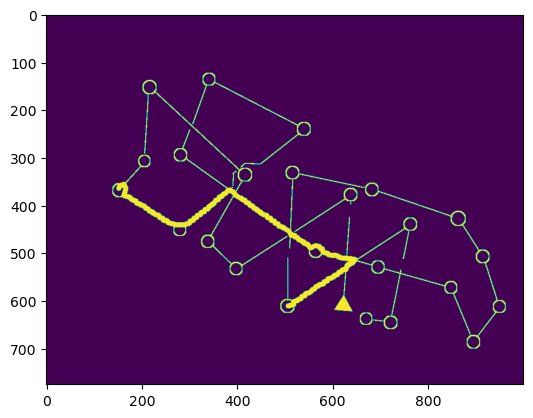

1.4236470044777851 0.5073293247315233


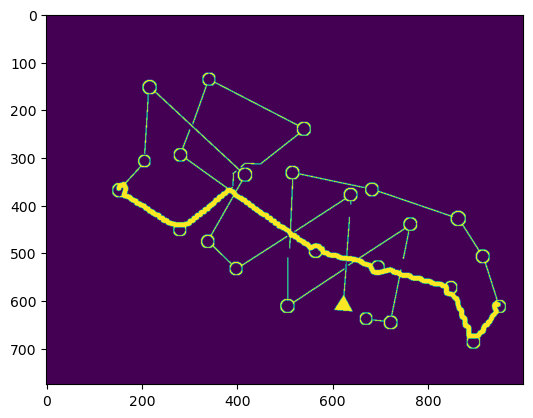

0.49700941553992695 0.5638779900030169


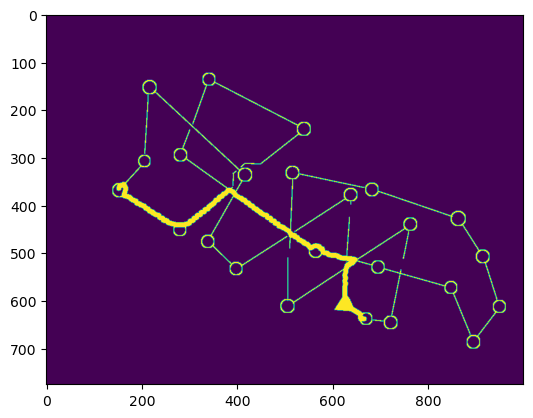

0.6636567888490199 0.7383666686436321


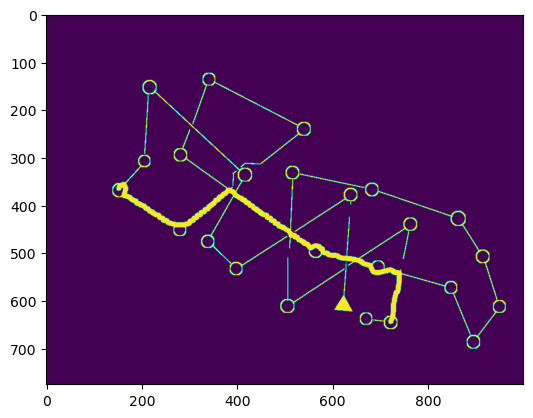

0.5994844758328888 0.8216890611303967


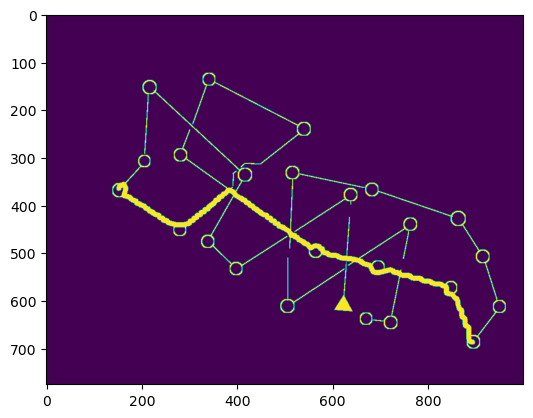

 38%|████████████████▌                           | 9/24 [00:19<00:29,  2.00s/it]

0.46928319788002204 0.8683566927798634


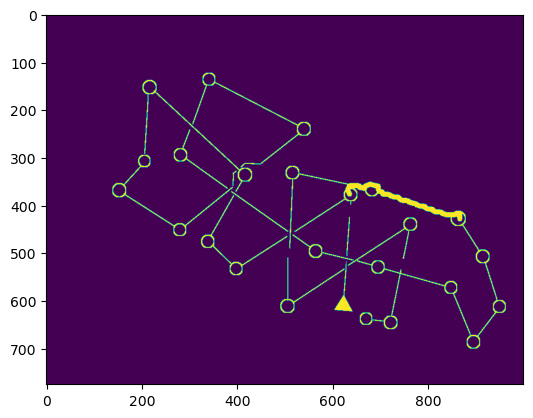

0.9282707361658318 0.5900508452667448


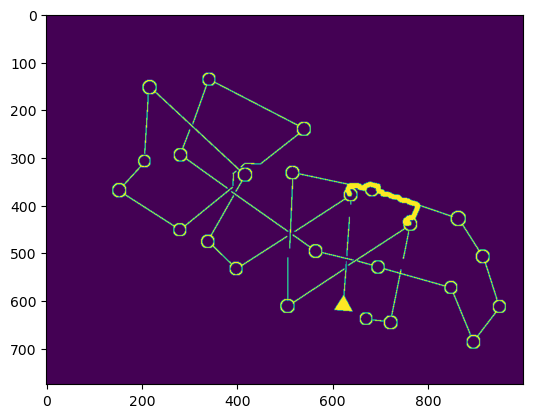

3.122140830963664 0.8052554181417392


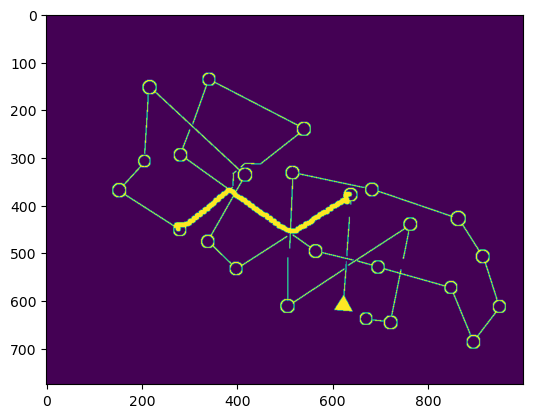

0.6602260358254708 0.8261745254919811


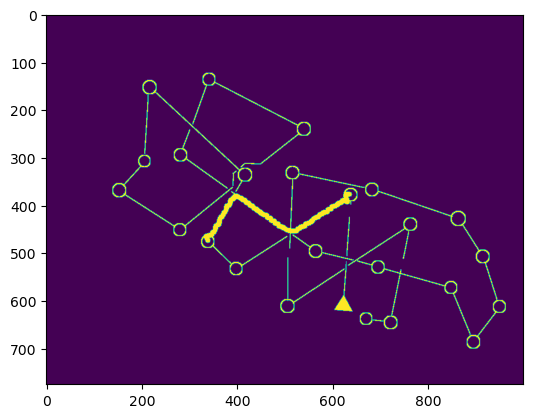

0.7867087175710685 0.8388386400407474


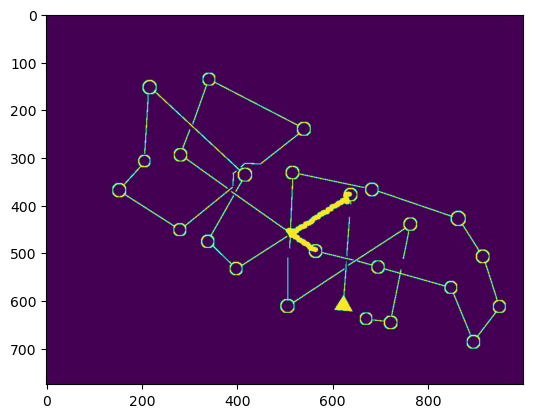

1.5531468338078778 0.7778375912936423


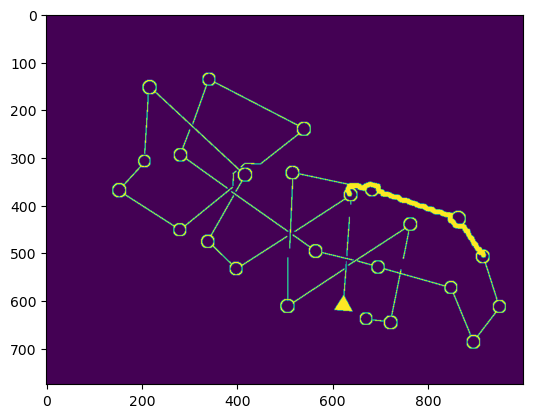

0.6703601859318842 0.8268282920362827


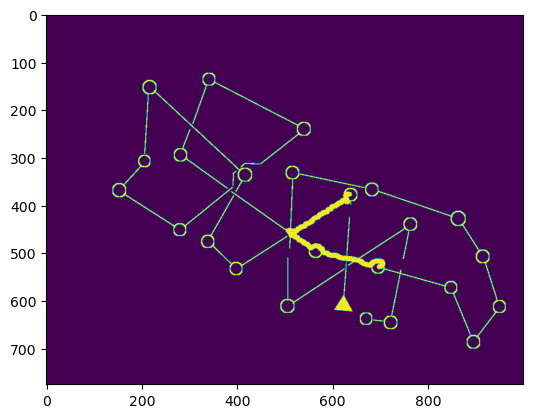

2.5104278110724763 0.7806262622676731


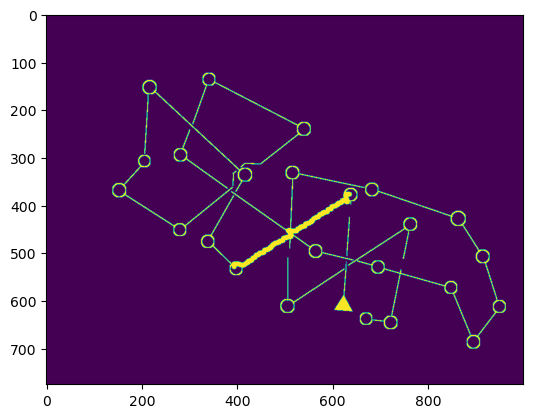

0.6855329579308307 0.05921619806278233


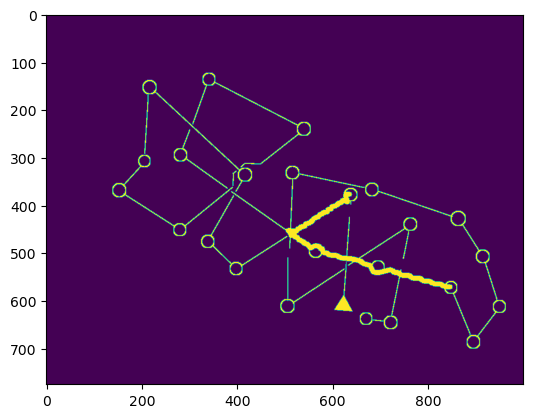

1.3594905482970918 0.8250480884455237


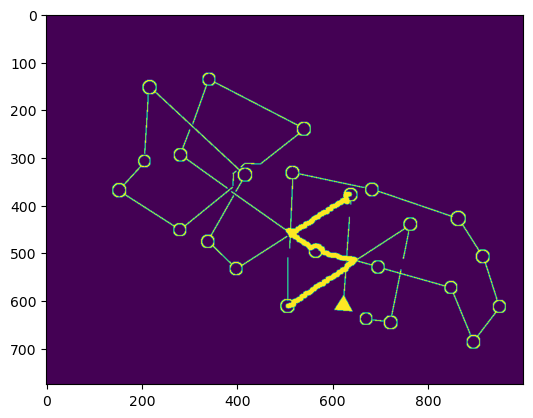

1.6770917925539832 0.8099389509623611


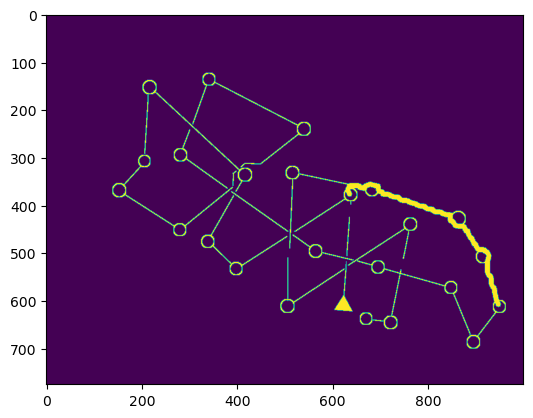

0.5773420862036003 0.8704538834595156


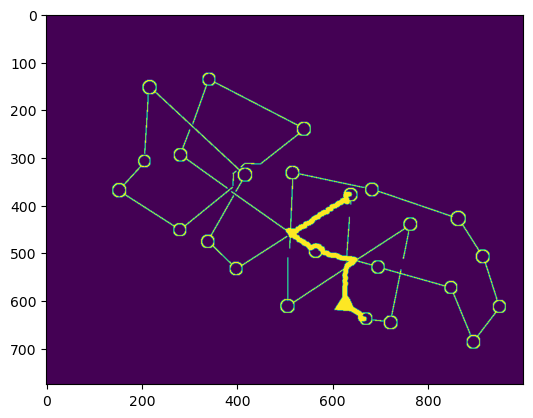

1.4815591327751423 0.8183462178311923


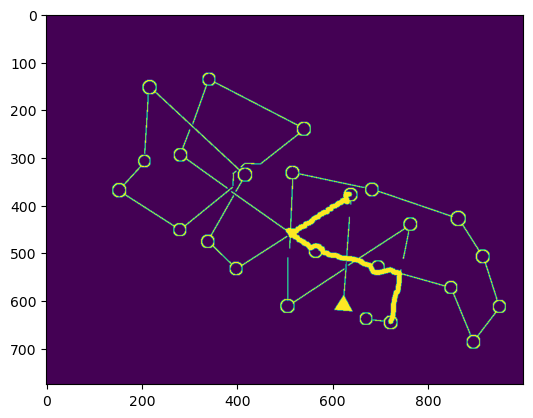

1.4785353359220297 0.7548356617620477


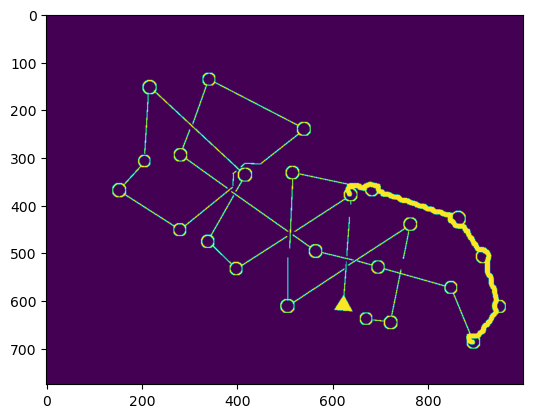

 42%|█████████████████▉                         | 10/24 [00:21<00:26,  1.90s/it]

0.9393606050927799 0.8185954029479282


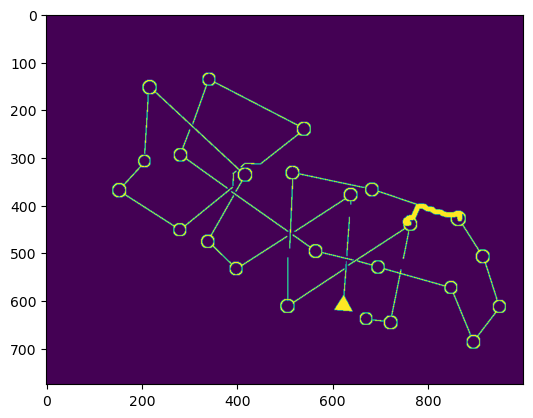

3.7026795117552913 0.7364985314233925


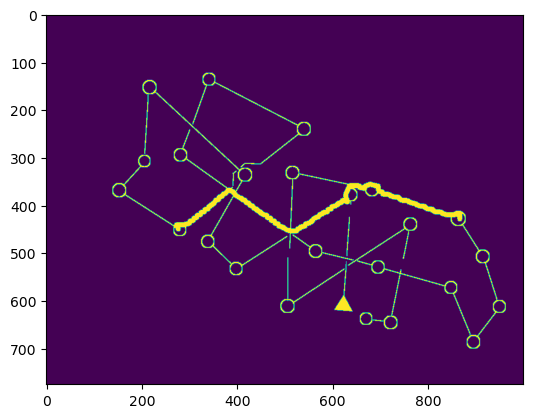

0.535884072225802 0.7783966925451306


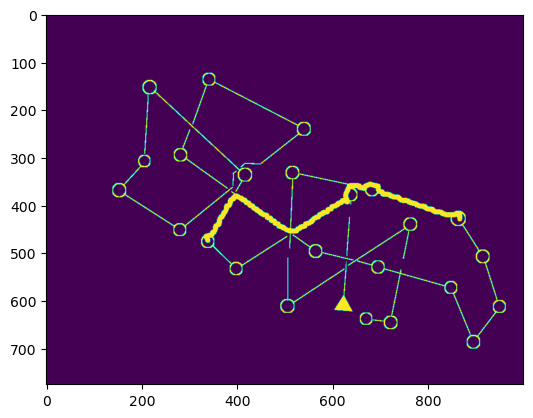

0.6183632387761133 0.8249859478917286


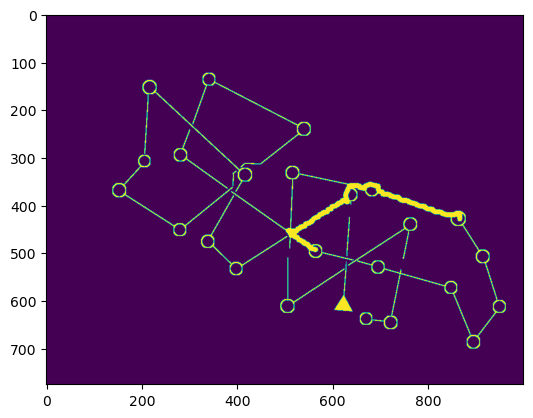

1.1073789516695247 0.7364963552741943


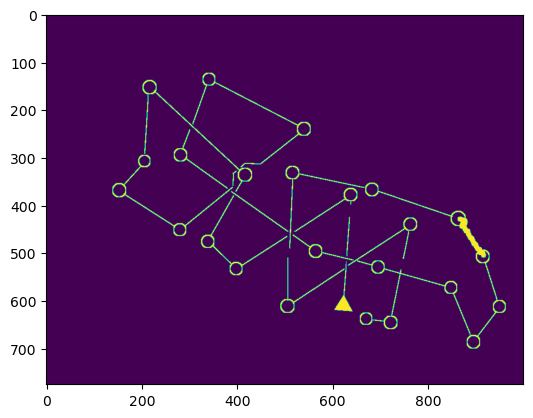

1.3755902461851384 0.12576654244509555


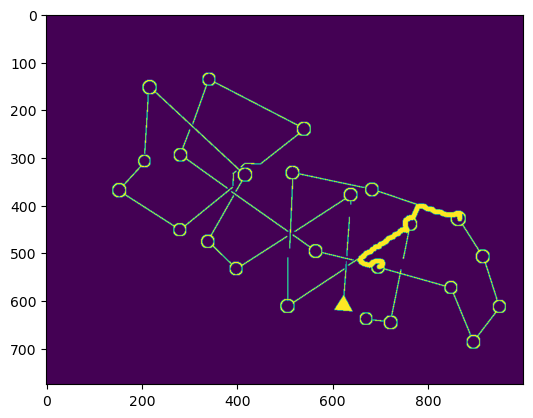

2.6736863564599846 0.7869751607501603


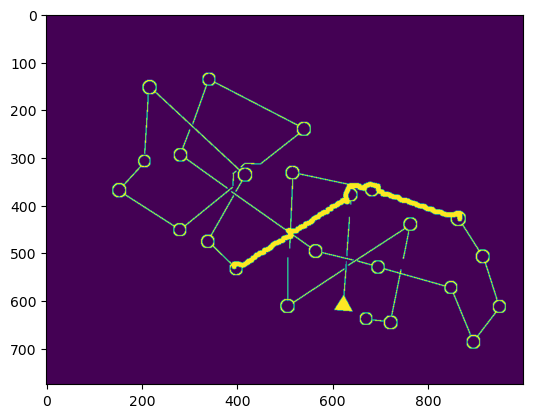

0.6170154933369687 0.774214463380604


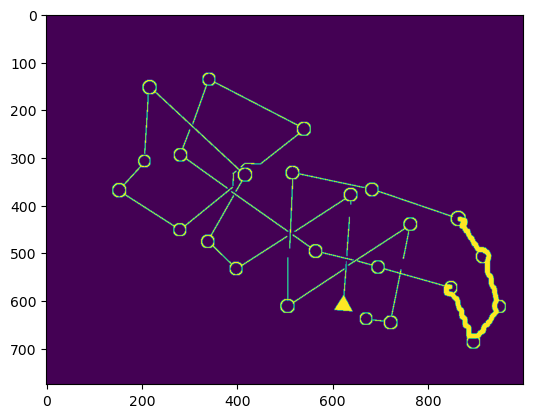

3.0426469665657896 0.8312408931253251


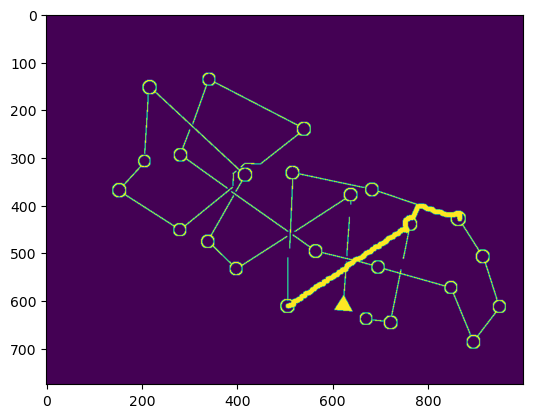

1.1959040546751627 0.6434509555559775


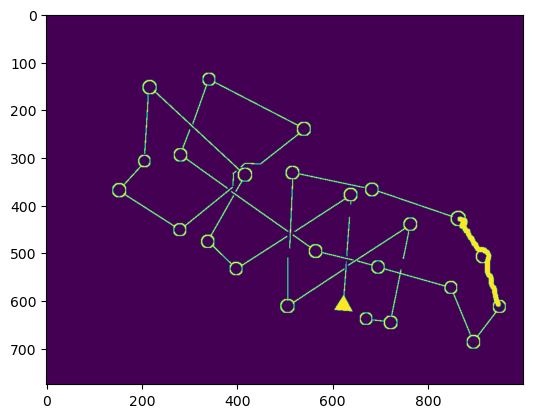

0.6223511345439332 0.49893411775923985


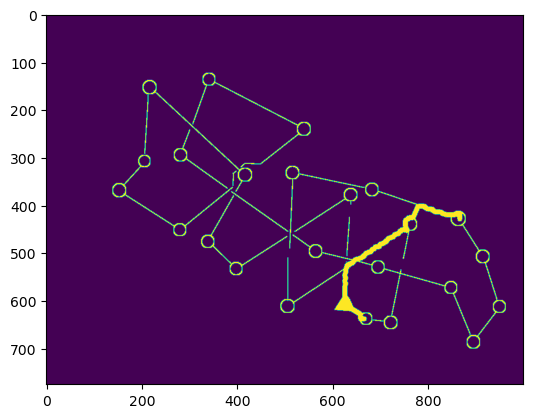

1.8543868084874715 0.7952751841162651


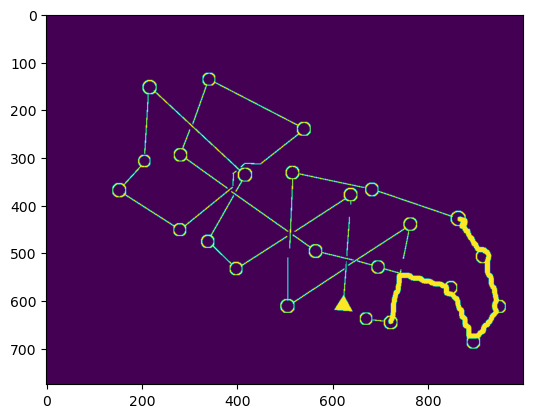

2.1348665879027666 0.8435251938233922


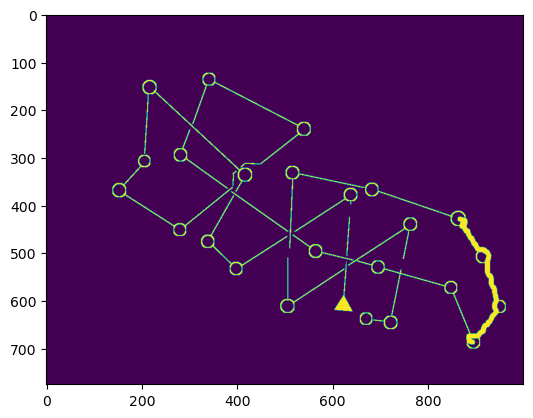

 46%|███████████████████▋                       | 11/24 [00:22<00:22,  1.74s/it]

0.896774490789114 0.8928251643512397


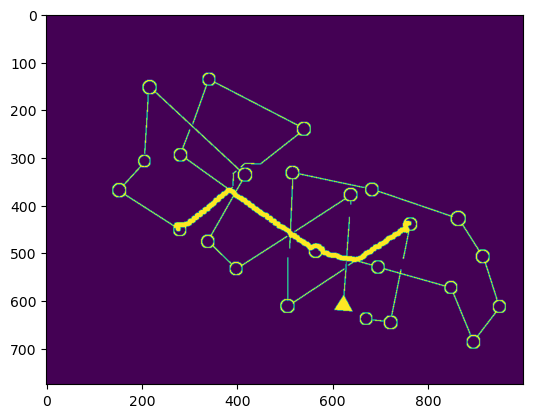

0.508621192444211 0.8072043270547523


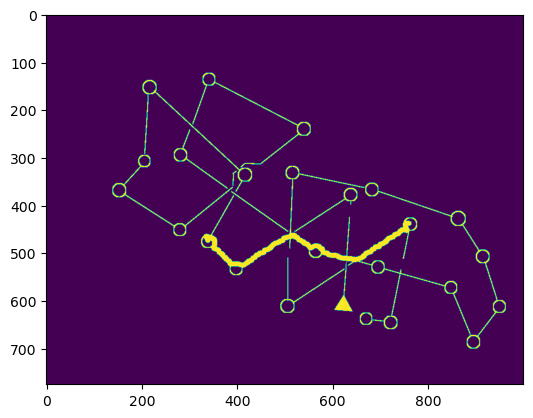

0.6071629000819823 0.8695129906211205


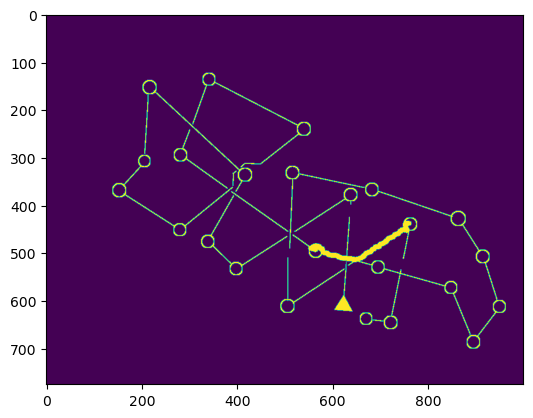

0.6658551357936162 0.821317880564697


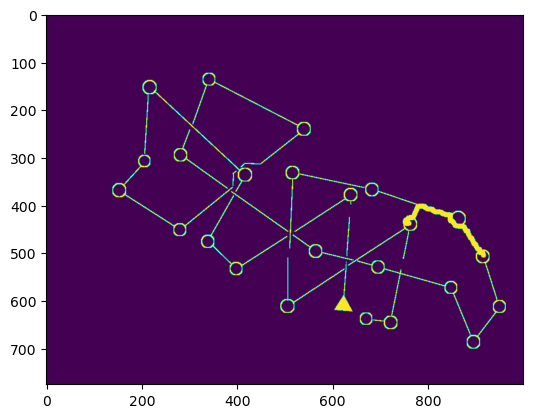

2.7319328166530834 0.8322010612536552


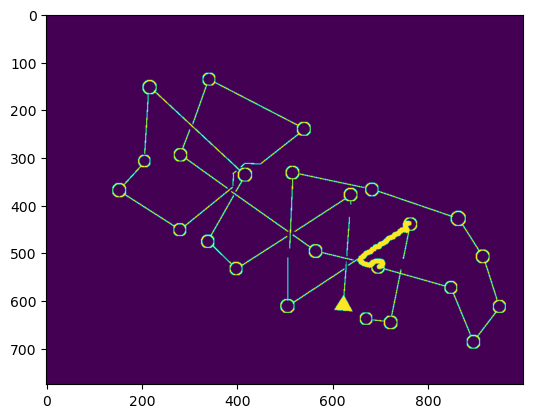

1.9331699905896222 0.6678602440111757


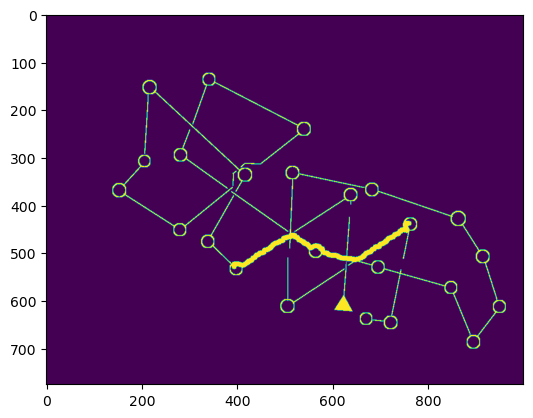

0.5324687802302626 0.7911609756645931


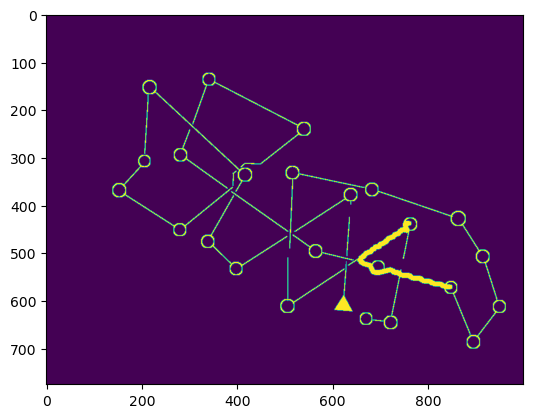

1.7254703453153875 0.8144841881367225


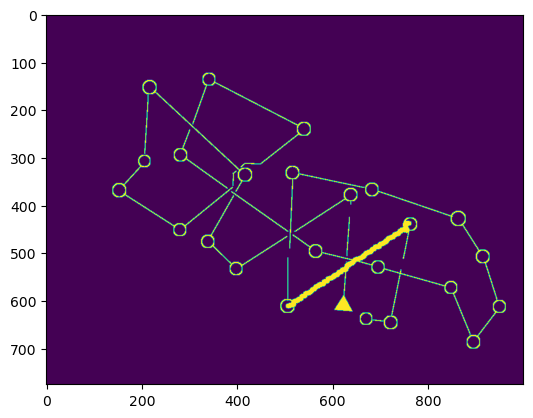

0.5873489774328122 0.03563436479951211


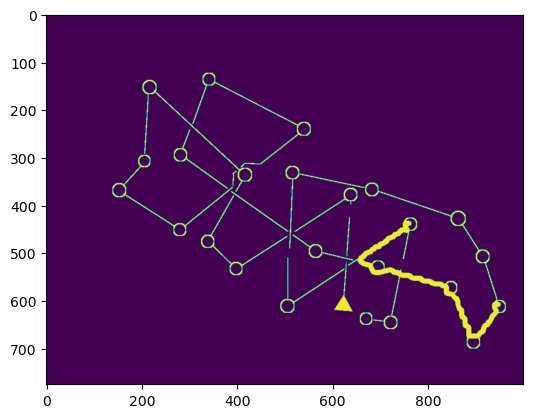

1.6904606337075059 0.8830117963140517


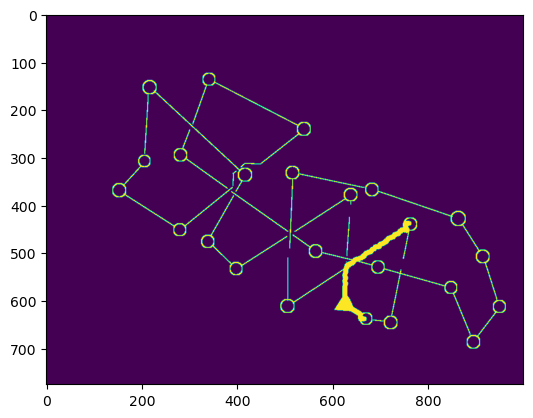

0.9360045789552871 0.8301506545363246


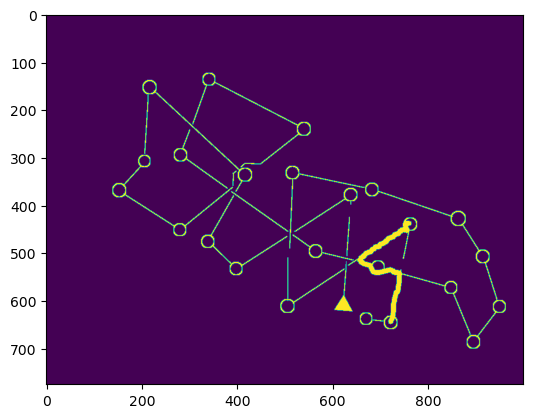

1.154491543471047 0.11969397463728038


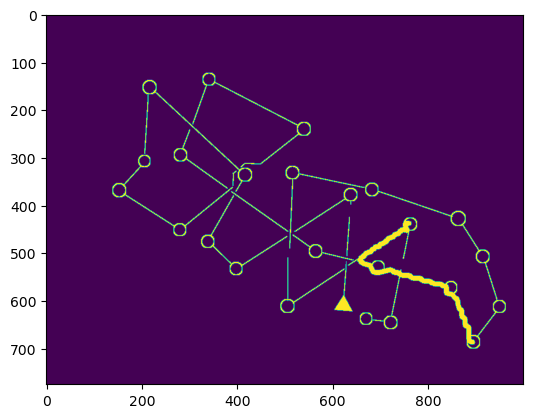

 50%|█████████████████████▌                     | 12/24 [00:23<00:19,  1.63s/it]

1.230950791000359 0.6722651359523788


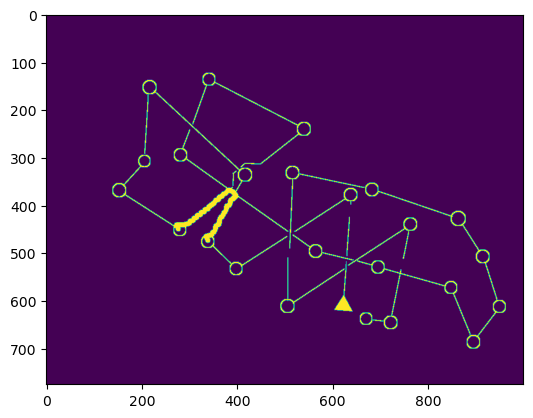

5.1316917784481175 0.5808971158529797


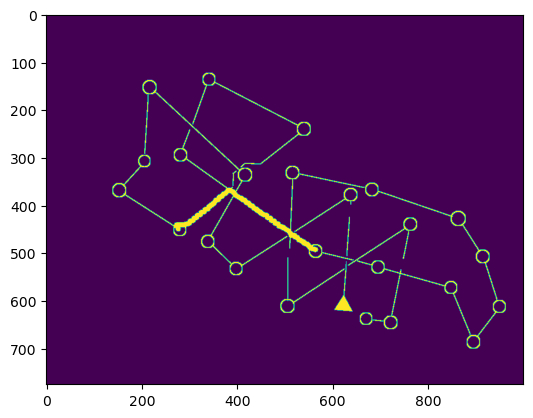

0.6240343770406112 0.7767623497304558


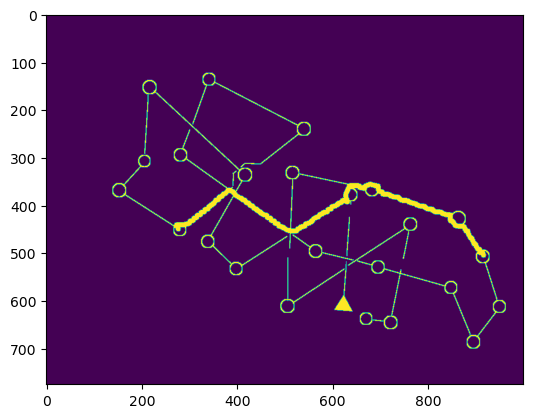

0.6326208265419155 0.8130033988035479


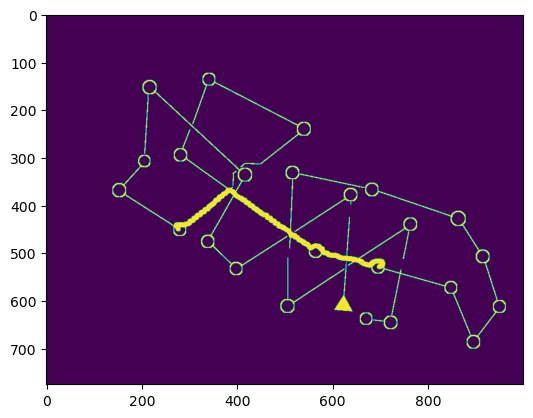

0.60751663619581 0.5588969820710123


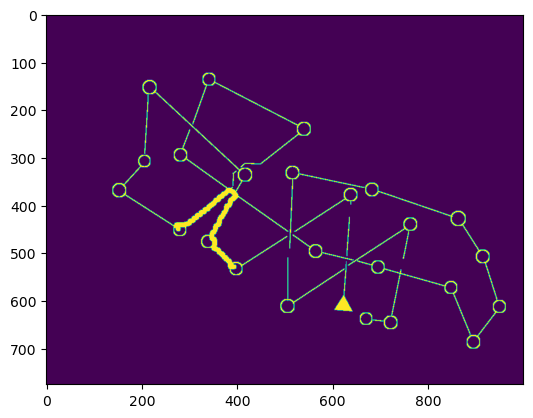

2.3109951296350406 0.5240144695201999


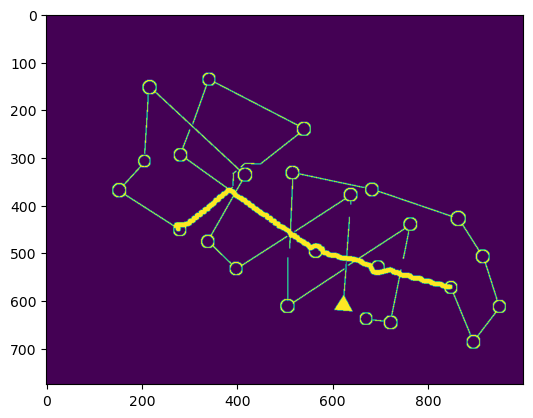

0.3551689105930167 0.58618934272163


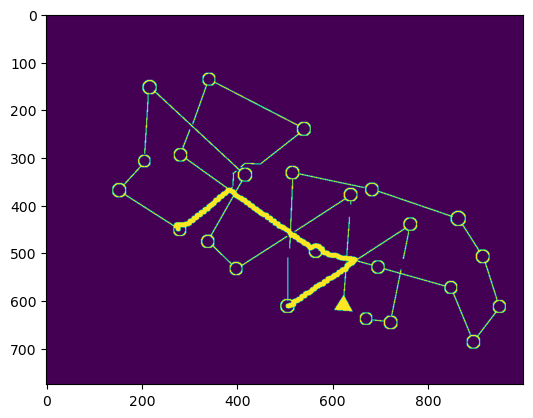

2.007700998014105 0.6875893992786251


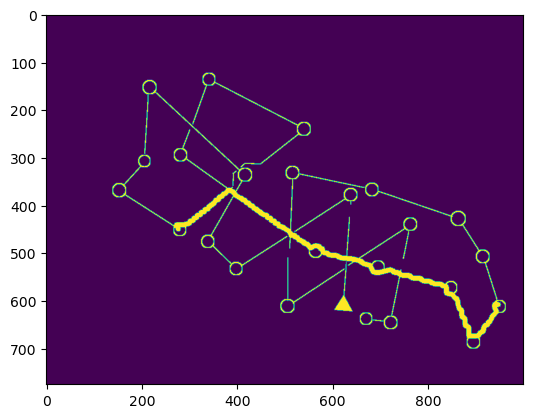

0.5108780059905442 0.8205130663662925


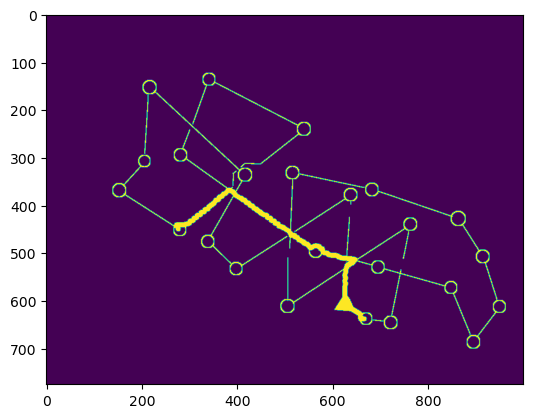

0.7663270210484812 0.6829456000106174


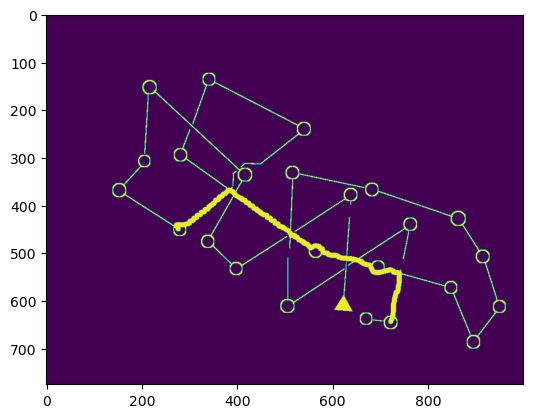

0.6693697084712193 0.7367301027468017


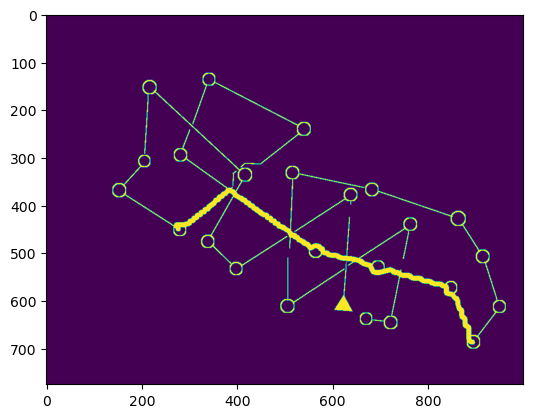

0.4880629162249286 0.8407344702886669


 54%|███████████████████████▎                   | 13/24 [00:25<00:16,  1.51s/it]

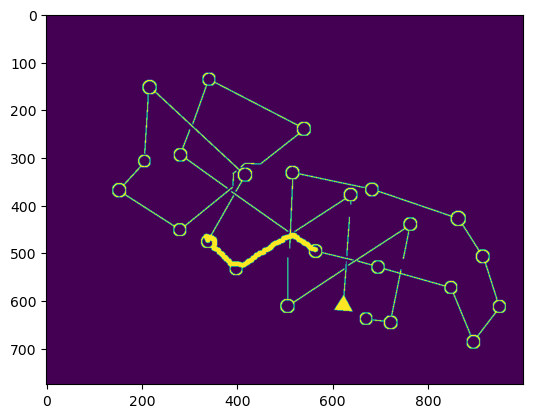

0.8658643636219747 0.7757294362144904


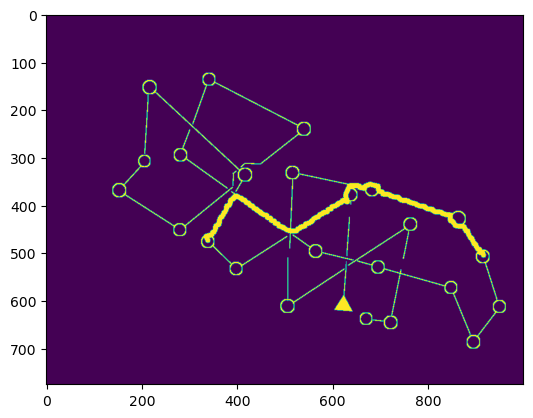

0.726760562173062 0.7735810402697352


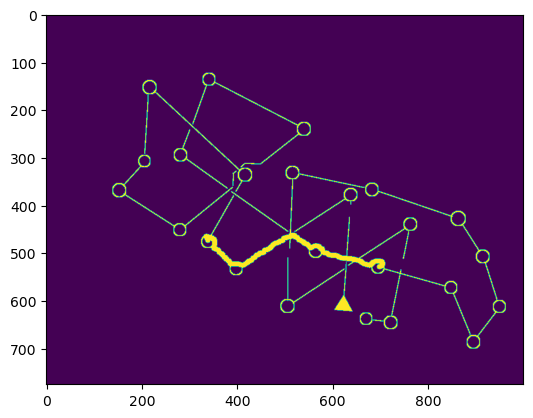

0.7592243388395035 0.6493472036030624


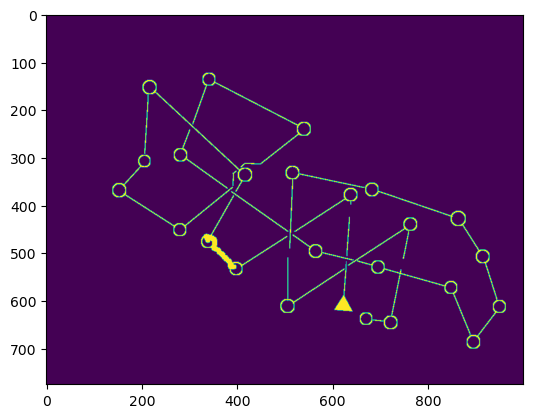

1.3431282577149788 0.10970716119937188


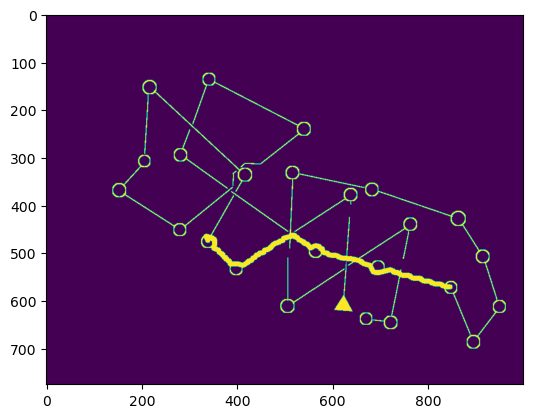

0.4318481806389294 0.7107874152319701


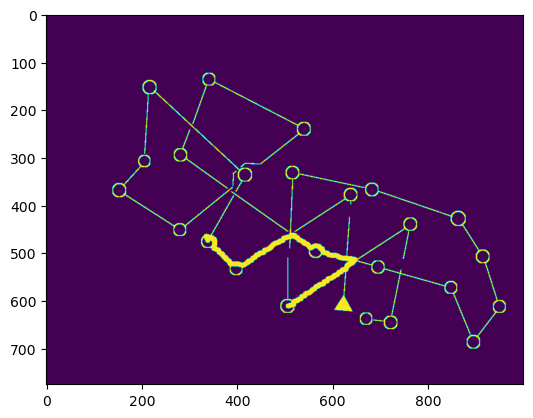

2.660728641283589 0.5401838447349915


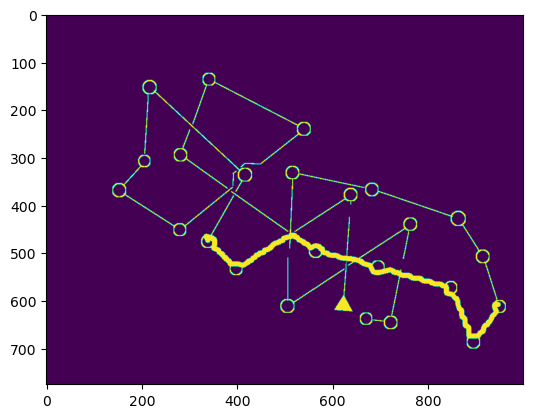

0.590646126570622 0.8310350626729401


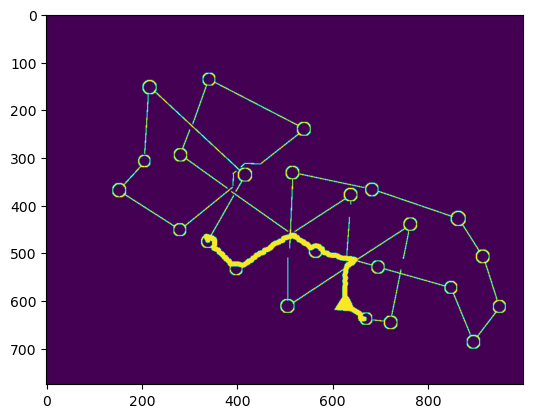

0.9482089489296548 0.7110887559161901


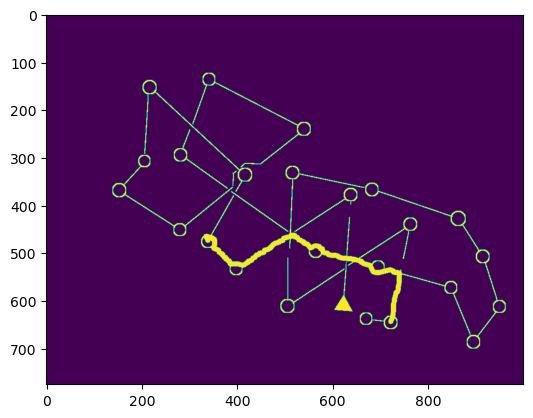

0.8154640038130134 0.7531990702909126


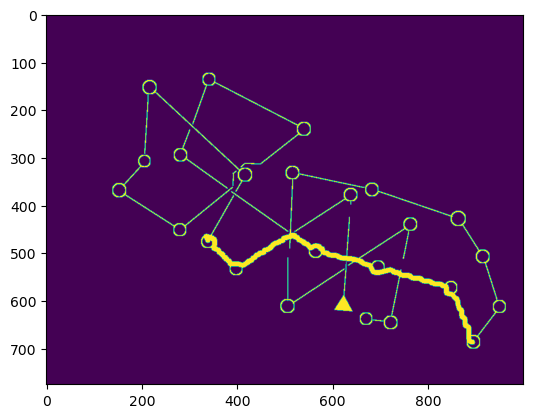

 58%|█████████████████████████                  | 14/24 [00:26<00:13,  1.38s/it]

0.5716432669244045 0.8701901318766705


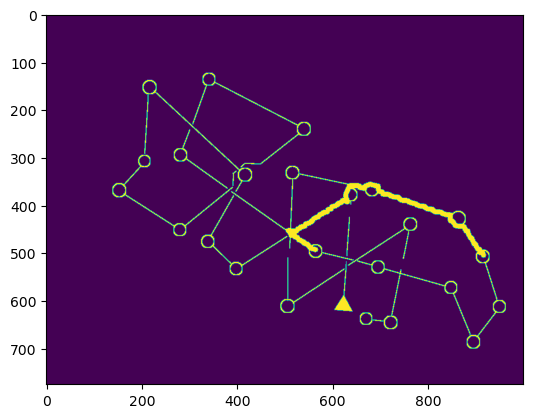

1.268591844841394 0.820110189934294


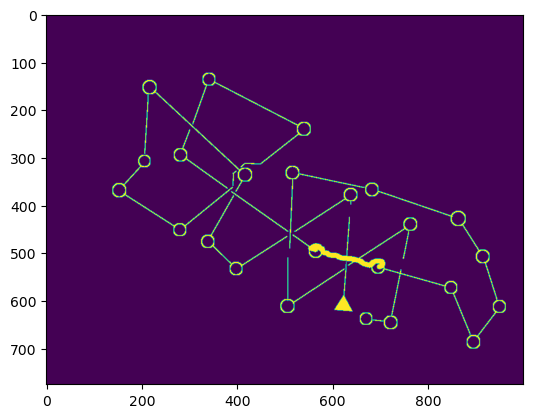

1.2130355011732736 0.08819477274048473


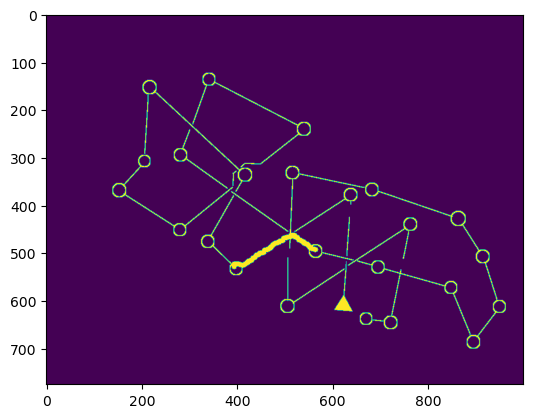

0.8837929648918654 0.8067830559985164


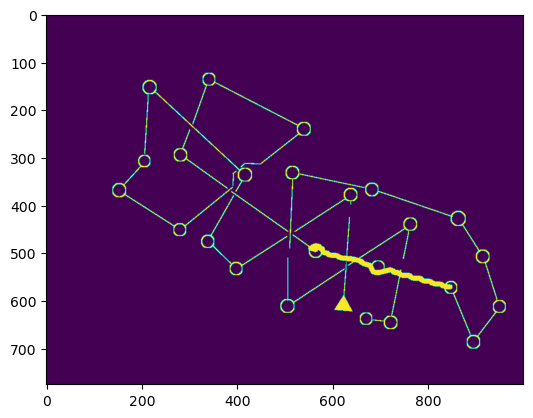

0.3858053198305127 0.08835924927529704


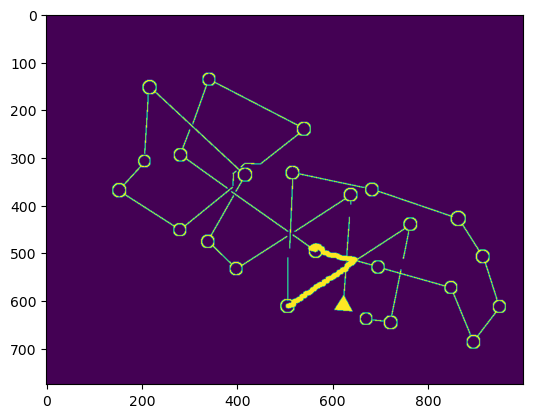

2.485877415074375 0.7736842598192202


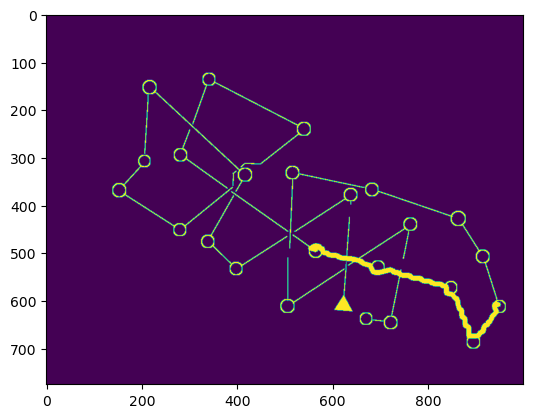

0.641635462567538 0.40193190670419315


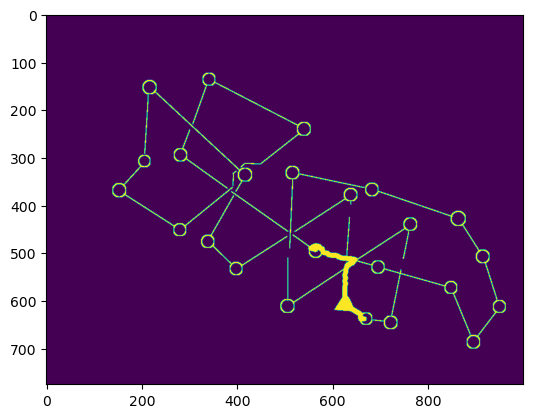

1.1628872164160047 0.7078539980997833


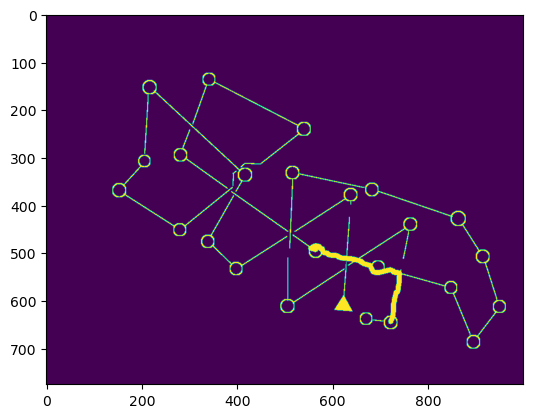

0.9620629611585383 0.7689649623523552


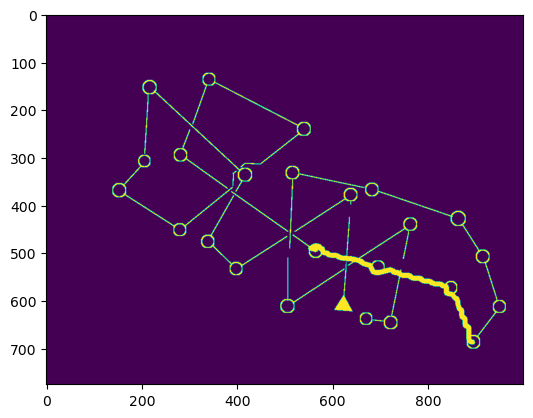

 62%|██████████████████████████▉                | 15/24 [00:27<00:11,  1.29s/it]

0.5720979695952759 0.8646538832774017


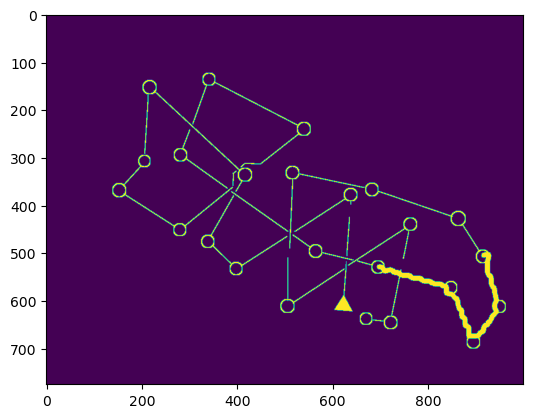

2.1399547908167564 0.8859518742577823


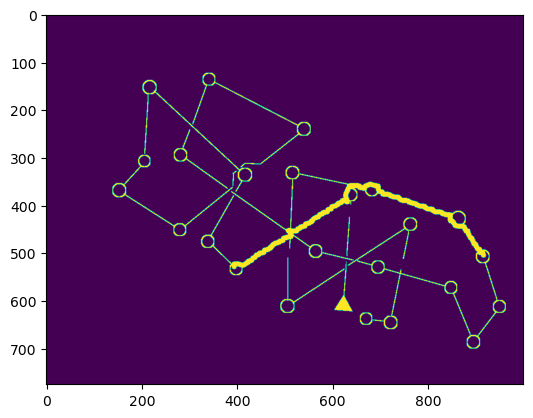

0.7684729776371995 0.7789421861524961


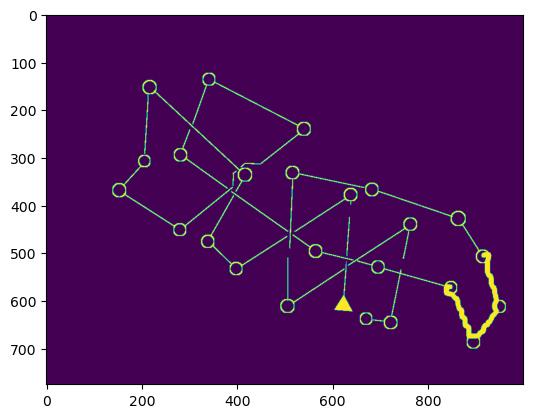

4.446399539238222 0.6698717003791912


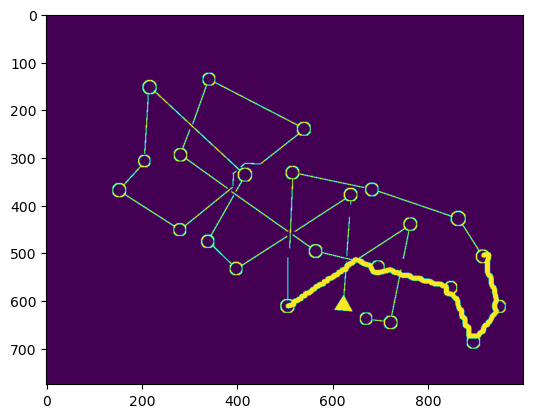

1.3076751122550956 0.834545683737557


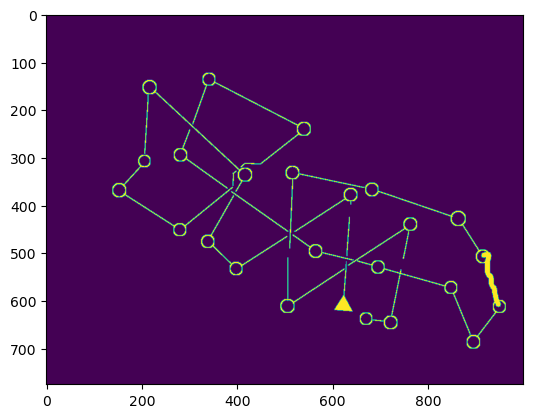

1.2637892456126014 0.0813157112614726


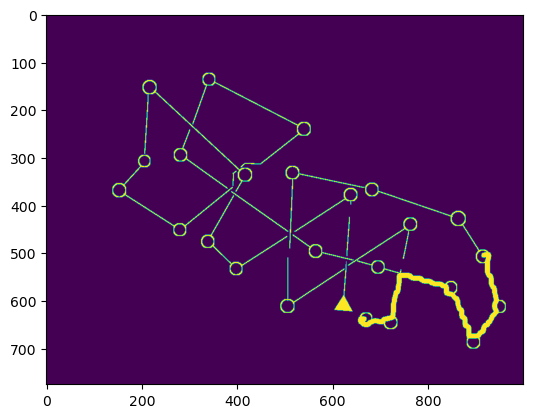

1.9005823627268819 0.8084899221640647


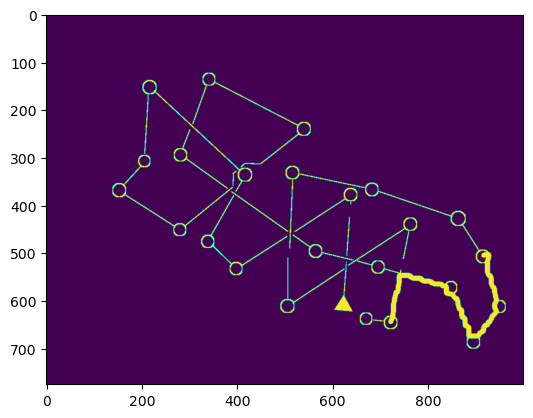

2.088482134392526 0.7670862374730788


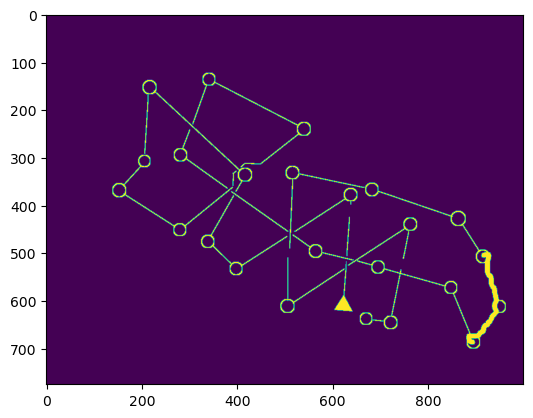

 67%|████████████████████████████▋              | 16/24 [00:28<00:09,  1.15s/it]

1.297929239013262 0.8661188326374817


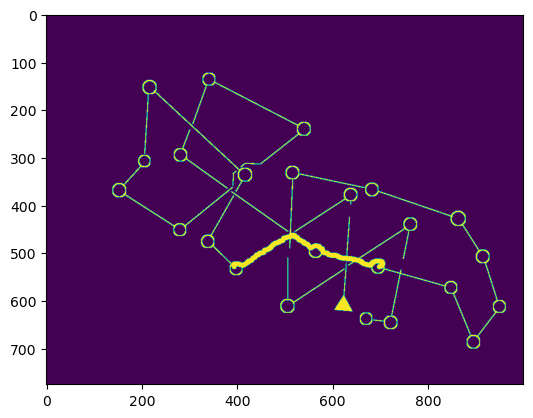

0.7724166541887092 0.8059479503009032


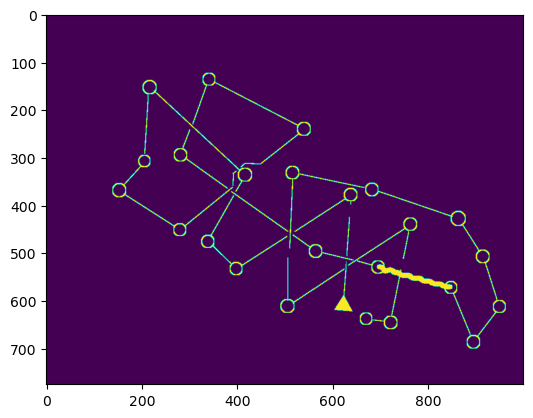

0.6711571266861518 0.05055601391655587


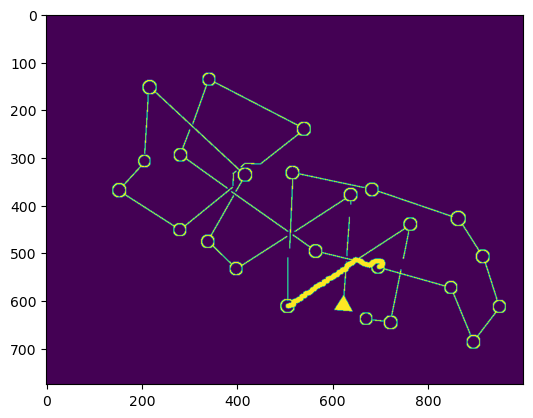

1.1301923051423226 0.6639143897080966


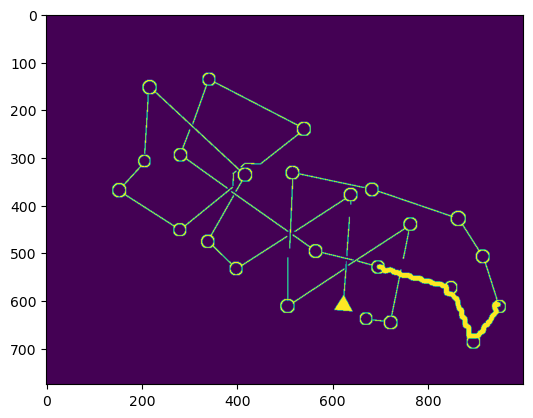

0.9397458299489154 0.35177384182996413


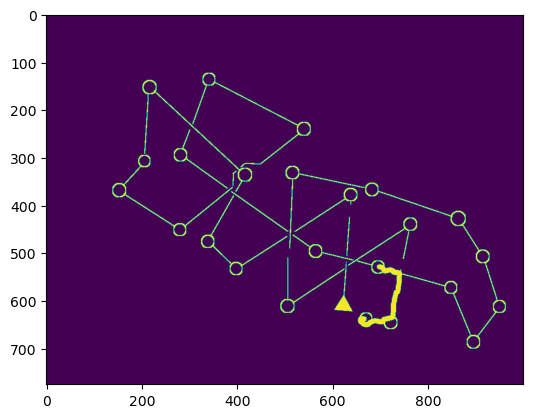

2.160392454622382 0.7873948230645501


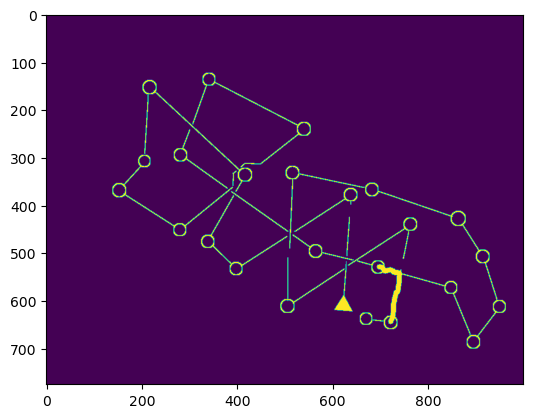

1.378720760062965 0.7907260365474534


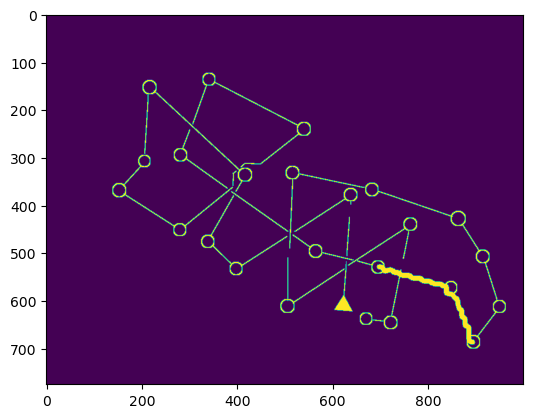

 71%|██████████████████████████████▍            | 17/24 [00:28<00:07,  1.02s/it]

0.8016181418648098 0.8442619321731446


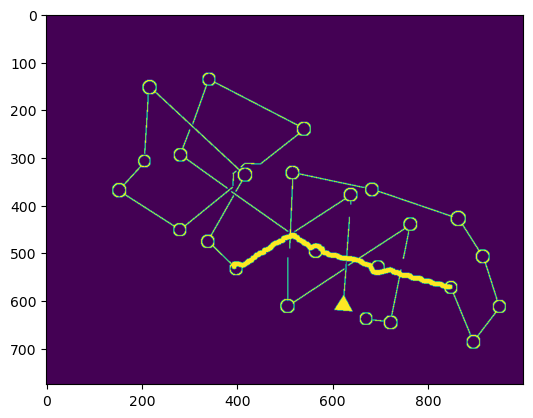

0.4061580023702316 0.7973136735952671


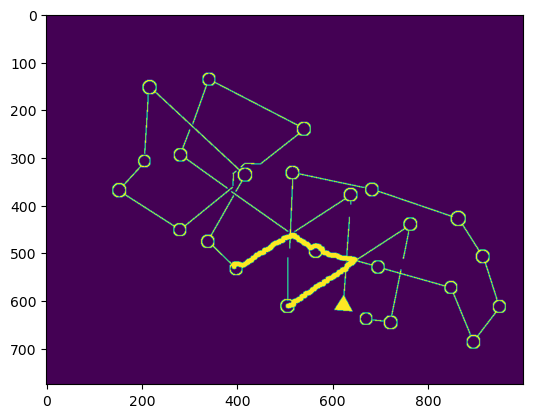

4.100106462618595 0.7656414934887765


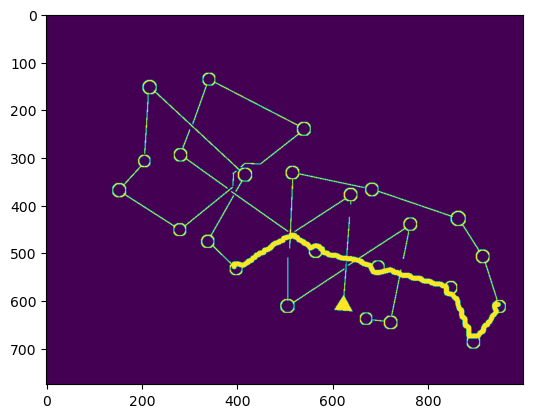

0.5942224616624987 0.8574788561730539


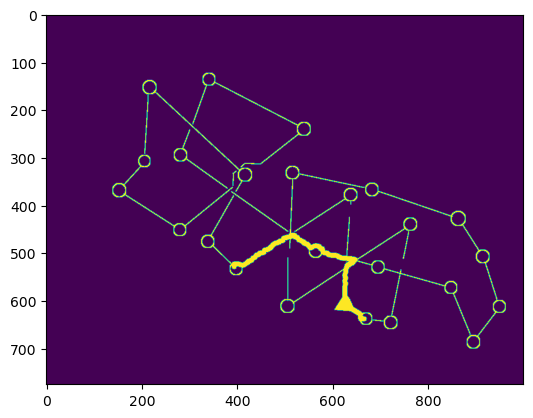

1.0962097030677818 0.6965866090194478


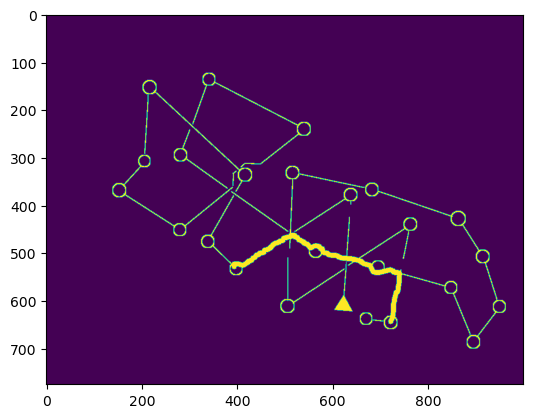

0.9054147368748997 0.6661679003730561


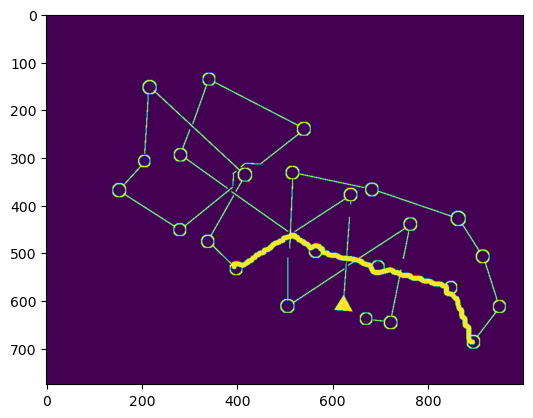

 75%|████████████████████████████████▎          | 18/24 [00:29<00:05,  1.09it/s]

0.5910396227551562 0.8081031006192068


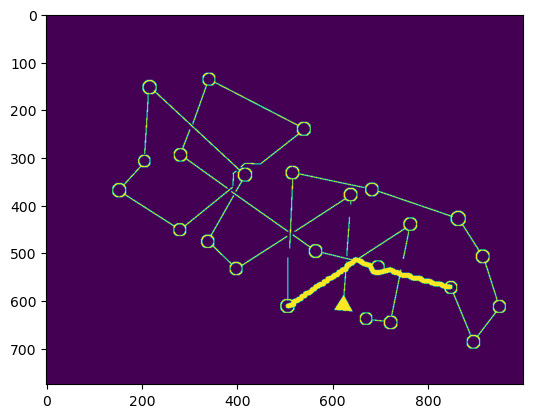

0.5921378565479491 0.8374419746979203


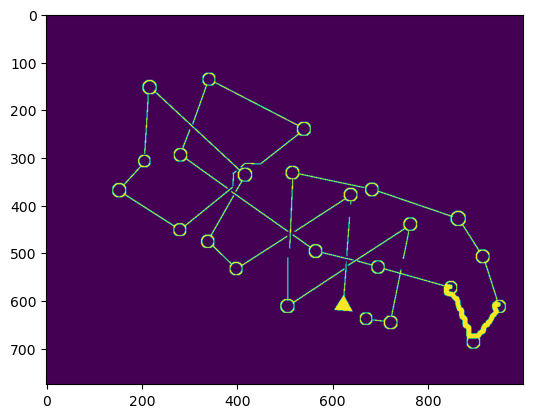

2.1084186878758886 0.760061787182746


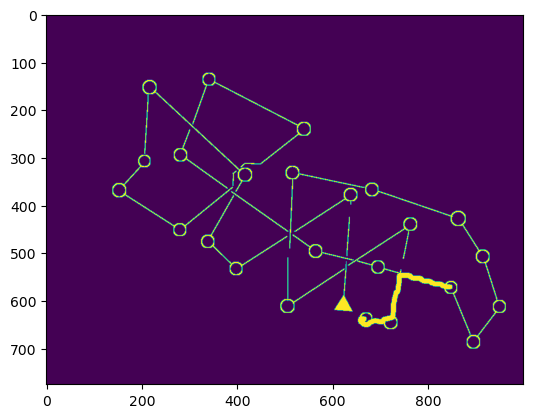

1.0045905340813261 0.8006656498170084


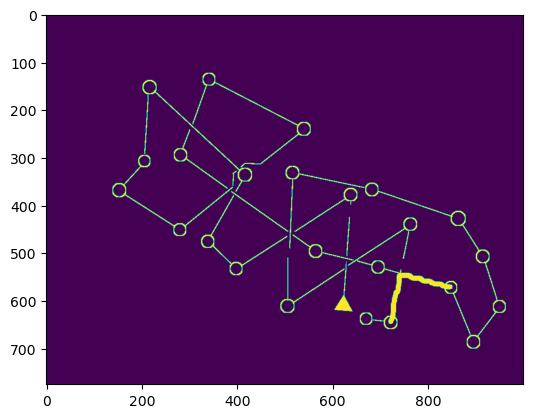

1.1093561345263536 0.7924441376532763


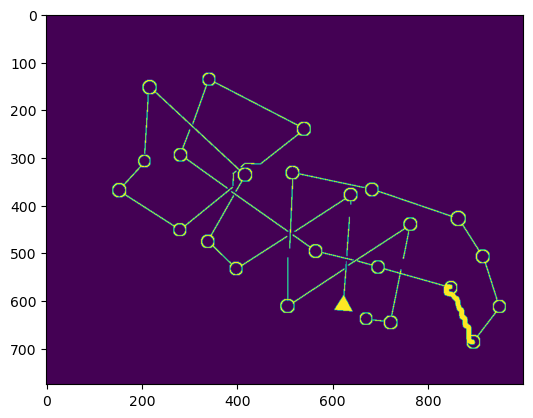

 79%|██████████████████████████████████         | 19/24 [00:30<00:04,  1.21it/s]

1.2697111237046887 0.07353864040803192


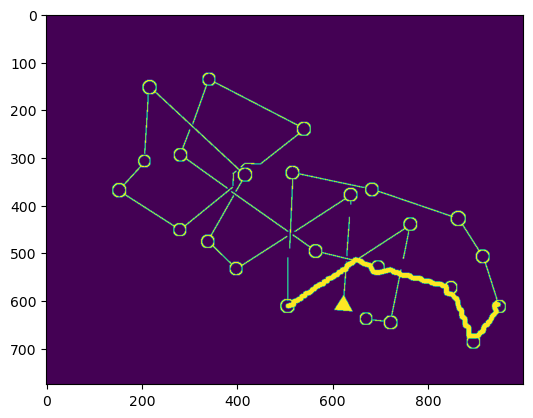

0.6429421687887751 0.8202226480959157


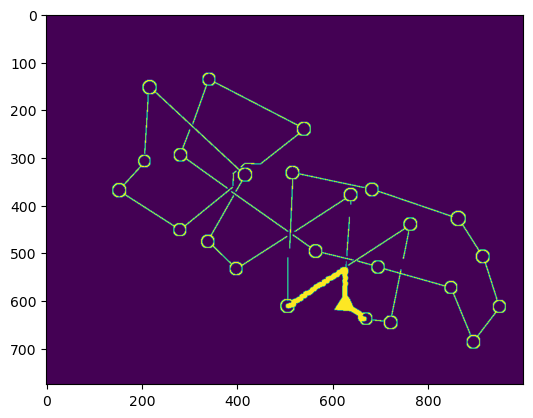

1.327001756353896 0.8604263270284307


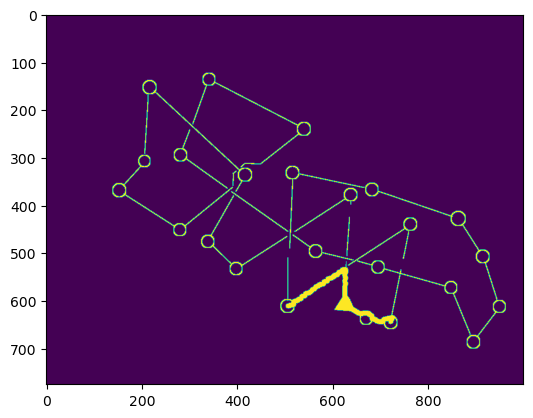

1.1119703411334885 0.7102290680123157


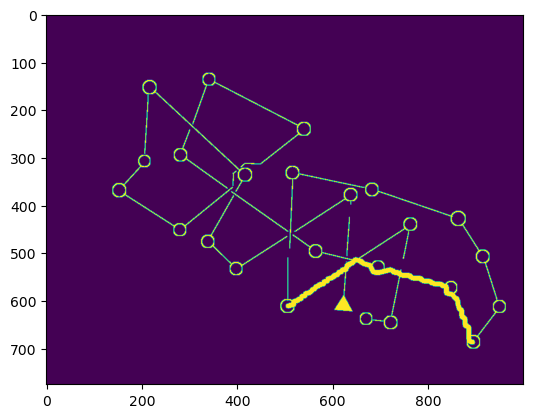

 83%|███████████████████████████████████▊       | 20/24 [00:30<00:02,  1.41it/s]

0.6856378470251852 0.7906410880818545


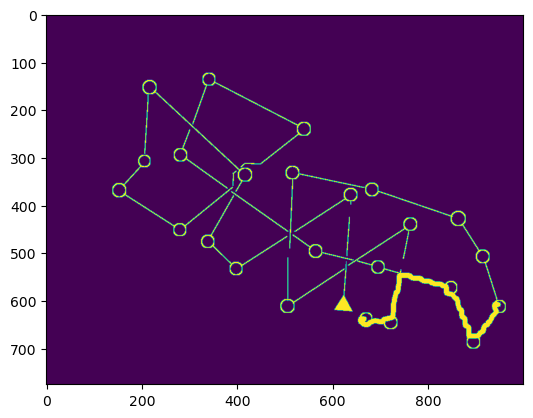

1.255411342327156 0.7785316559941893


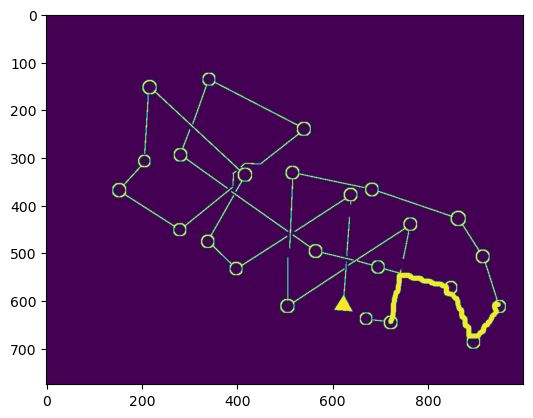

1.430811086373609 0.8464431461479528


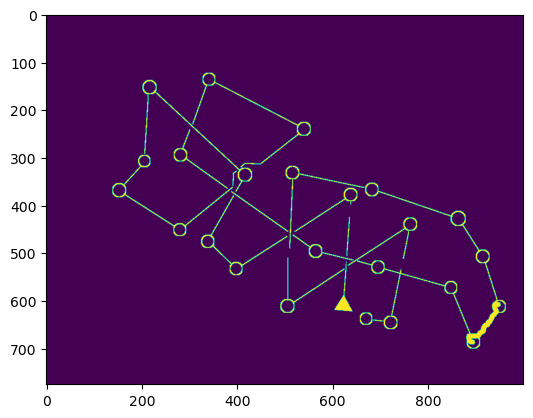

 88%|█████████████████████████████████████▋     | 21/24 [00:30<00:01,  1.71it/s]

1.6150633631923168 0.1084588491646583


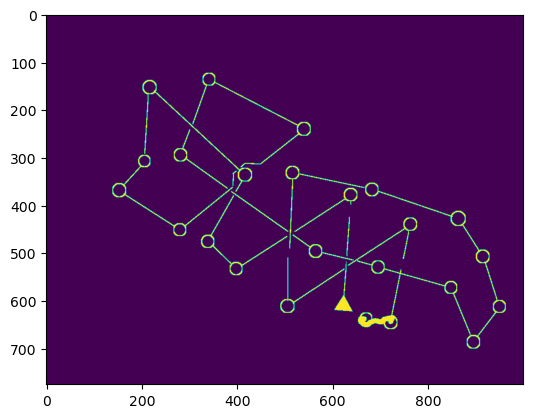

2.205229686250872 0.19104017997521752


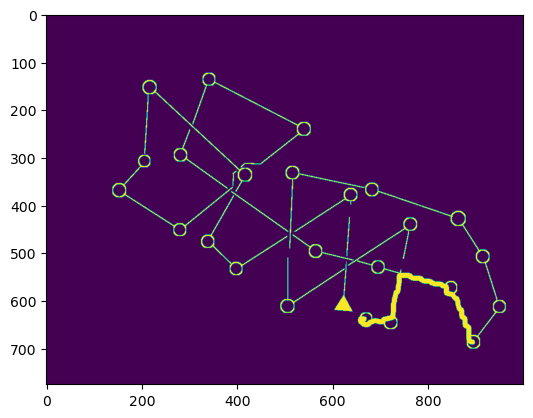

 92%|███████████████████████████████████████▍   | 22/24 [00:30<00:00,  2.13it/s]

1.4918931385168808 0.7308908681741075


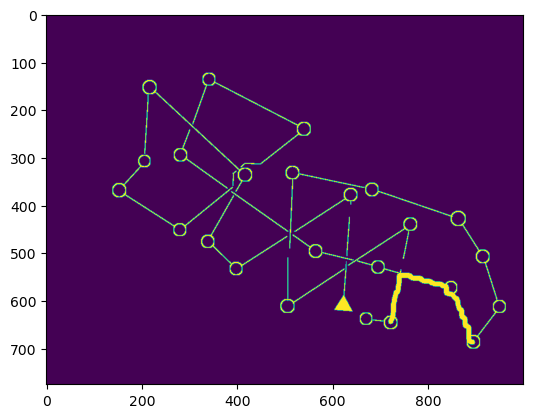

100%|███████████████████████████████████████████| 24/24 [00:31<00:00,  1.30s/it]

1.8029005579648452 0.8549315414260666


In [29]:
dist_matrix_full = quadtree_dist_matrix(img, circles, tree, graph)

In [30]:
dist_matrix_full = np.array(dist_matrix_full)

In [58]:
from scipy.optimize import linear_sum_assignment

from python_tsp.heuristics import solve_tsp_simulated_annealing
from python_tsp.exact import solve_tsp_dynamic_programming


def draw_permutation(course, circles, permutation):
    res = np.zeros((course.shape[0],course.shape[1],1), np.uint8)
    for circle in circles:
        cv2.circle(res, (circle[1],circle[0]),12,255,10)
    for i in range(len(permutation)):
        cv2.line(res, (circles[permutation[i]][1], circles[permutation[i]][0]), ((circles[permutation[(i+1)%len(permutation)]][1], circles[permutation[(i+1)%len(permutation)]][0])), 255, 10)

    plt.imshow(res + 100 * course.reshape((course.shape[0], course.shape[1], 1)))
    plt.show()

def get_best_permutation(circles, d, img, visualize=False):
    n = len(circles)
    matrix = np.array(d)
#     matrix[:, 0] = 0
    print(matrix)
    res, distance = solve_tsp_simulated_annealing(matrix)
#     print(res, distance)
    if visualize:
        draw_permutation(img, circles, res)

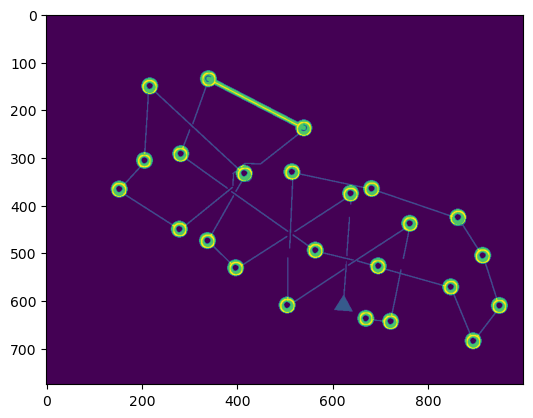

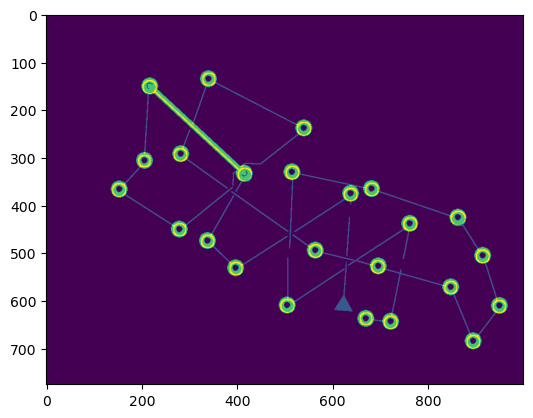

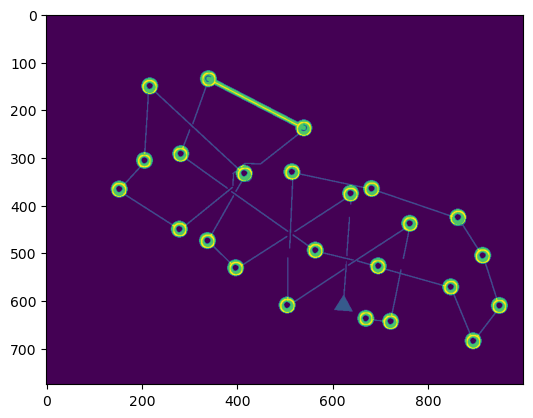

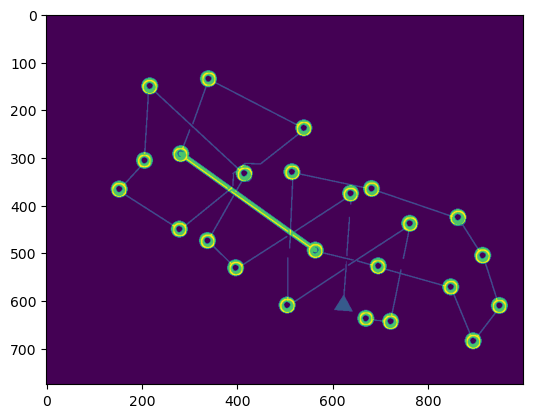

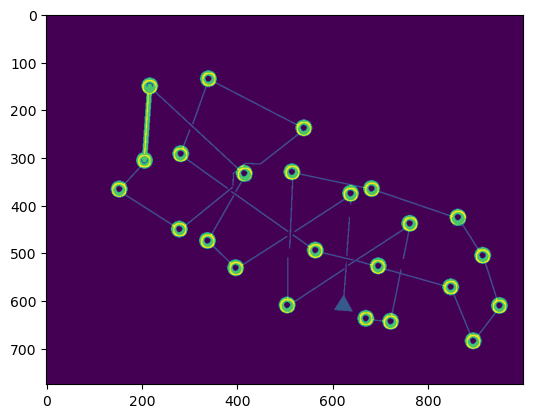

...

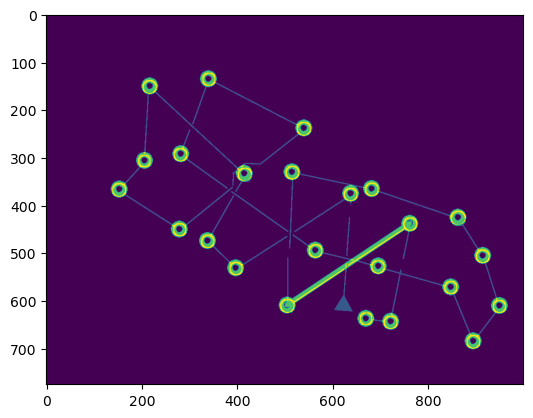

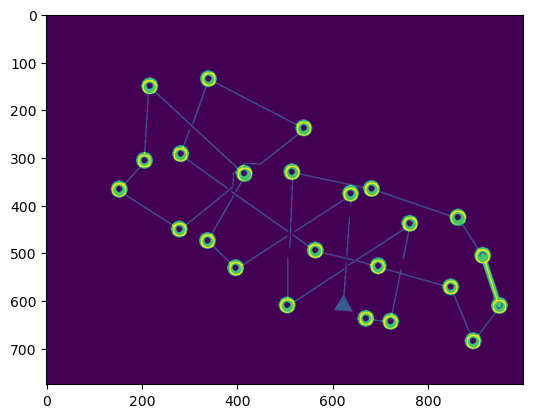

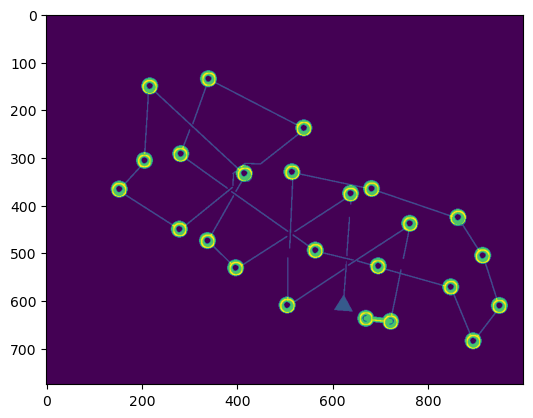

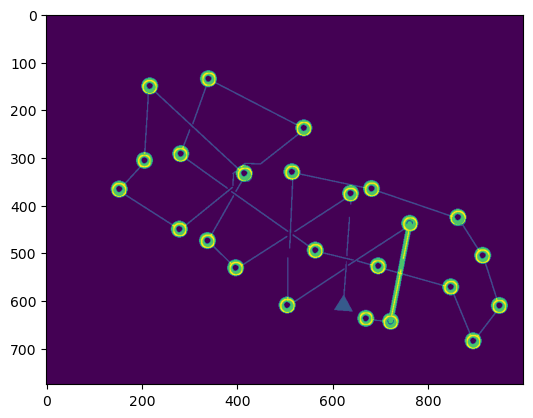

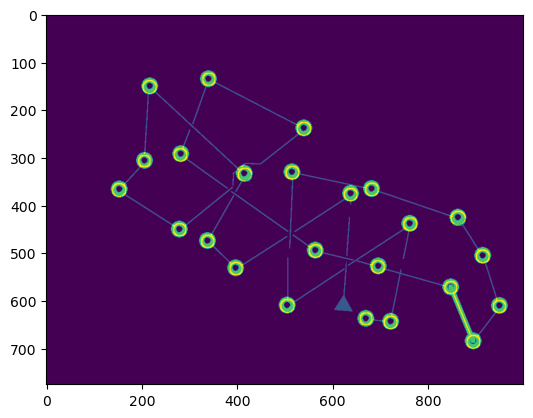

In [59]:
for i in range(len(circles)):
    min_idx = (i + 1) % len(circles)
    for j in range(len(circles)):
        if i == j:
            continue
        if dist_matrix_full[i,j] < dist_matrix_full[i,min_idx]:
            min_idx = j
    draw_permutation(img, circles, [i, min_idx])

[[0.         0.79088859 0.04445147 0.04779805 0.81013141 0.84729122
  0.85014495 0.8273775  0.6527511  0.81280042 0.60700219 0.785352
  0.76047526 0.76824192 0.60042582 0.77074053 0.68179096 0.70659783
  0.48961968 0.83682442 0.61824834 0.62203879 0.5977891  0.52364459]
 [0.79088859 0.         0.79059943 0.81321752 0.07673255 0.85884089
  0.03338076 0.7199166  0.76322184 0.68638261 0.66880889 0.50060936
  0.71559739 0.69626992 0.35985165 0.58134351 0.44000586 0.59001423
  0.2977933  0.79539115 0.43096443 0.44586519 0.42088119 0.36339581]
 [0.04445147 0.79059943 0.         0.84980271 0.81560355 0.73424329
  0.2484026  0.84511234 0.86600542 0.74209137 0.92705107 0.8199347
  0.13977637 0.71464329 0.82450959 0.86240384 0.81299354 0.88027699
  0.81569657 0.67892618 0.8598111  0.82212562 0.79051448 0.79819525]
 [0.04779805 0.81321752 0.84980271 0.         0.6858292  0.67774102
  0.7688099  0.47220079 0.76655221 0.5957797  0.59388345 0.4018637
  0.8542764  0.79298149 0.02306251 0.52223926 0.3

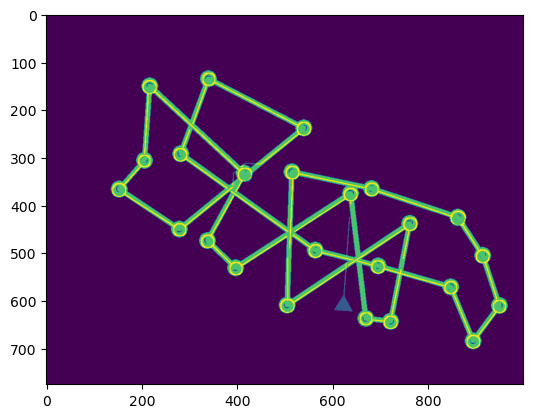

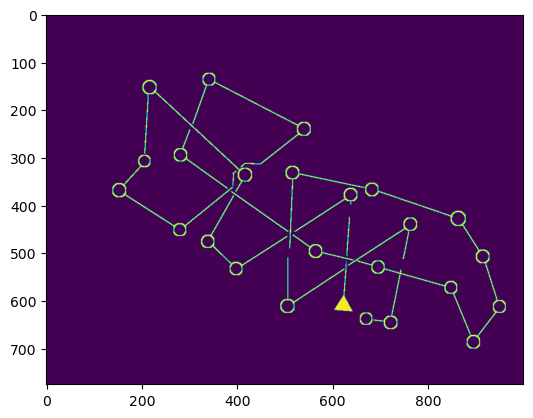

In [61]:
get_best_permutation(circles, dist_matrix_full, img, visualize=True)
plt.imshow(img)